# Missing data imputation with Fedbiomed using MIWAE

In this notebook we show how to impute missing not at random (MAR) data in a federated setting using MIWAE (https://arxiv.org/abs/2006.12871). We will compare results of federated training using FedAvg and FedProx with local results.

In [1]:
%load_ext autoreload
%autoreload 2

## Prepare the data

For this experiment we will use the data extracted from ADNI.

In [2]:
import pandas as pd
import numpy as np
import os
from copy import deepcopy

cwd = os.getcwd()
data_file = os.path.join(cwd, "data/ADNI/data_irene_dx_2g_corrected.csv")
raw_df = pd.read_csv(data_file, sep=",",index_col="RID")
target = raw_df["DX"]
data = deepcopy(raw_df)
del data["DX"]
print(data.shape)

(311, 130)


In [3]:
from sklearn.model_selection import train_test_split

#train test split
data_train, data_test, labels_train, labels_test = train_test_split(data, target, test_size=0.20, random_state=42)
N_train = data_train.shape[0]
mean_train = data_train.mean(0).to_numpy()
std_train = data_train.std(0).to_numpy()

print("N_train: ",N_train)
#print("mean_train: ",mean_train)
#print("std_train: ",std_train)

N_train:  248


In [4]:
# split train across datasets
client_1, client_2, client_3 = np.split(data_train.sample(frac=1,random_state=42), \
                                        [int(.33*N_train), int(.66*len(data_train))])

#Clients_data contains original full data of each client 
Clients_data=[client_1, client_2, client_3]

#N_cl = [len(i) for i in Clients_data]
#mean_cl = [np.nanmean(i,0) for i in Clients_data]
#std_cl = [np.nanstd(i,0) for i in Clients_data]
#cl = len(Clients_data)

#N_train_post = sum(N_cl)
#mean_train_post = sum([N_cl[i]*np.array(mean_cl[i])/N_train_post for i in range(cl)])
#std_train_post = np.sqrt(sum([((N_cl[i]-1)*np.array(std_cl[i])**2+\
#                               N_cl[i]*np.array(mean_cl[i])**2)/(N_train_post-cl) for i in range(cl)])\
#                         -(N_train_post/(N_train_post-cl))*mean_train_post**2)

#print("N_train_post", N_train_post)
#print("mean_train_post", mean_train_post)
#print("std_train_post",std_train_post)

In [5]:
# from each dataset we will remove randomly 50% of data
np.random.seed(1234)

# 30% of missing data for client 1, 30% for client 2, 30% for client 3
perc_miss_list = [0.3,0.3,0.3] 

#Clients_data contains data of each client with missing entries wrt to perc_miss_list
Clients_missing = []
for perc,c in enumerate(Clients_data):
    perc_miss=perc_miss_list[perc]
    n = c.shape[0] # number of observations
    p = c.shape[1] # number of features
    xmiss = np.copy(c)
    xmiss_flat = xmiss.flatten()
    miss_pattern = np.random.choice(n*p, np.floor(n*p*perc_miss).astype(np.int_),\
                                    replace=False)
    xmiss_flat[miss_pattern] = np.nan 
    xmiss = xmiss_flat.reshape([n,p]) # in xmiss, the missing values are represented by nans
    mask = np.isfinite(xmiss) # binary mask that indicates which values are missing
    Clients_missing.append(xmiss)

We evaluate global mean and std using local means and stds evaluated by each center using their respective datasets with missing entries.

In [6]:
N_cl = [len(i) for i in Clients_missing]
mean_cl = [np.nanmean(i,0) for i in Clients_missing]
std_cl = [np.nanstd(i,0) for i in Clients_missing]
cl = len(Clients_missing)

N_train_post = sum(N_cl)
mean_train_post = sum([N_cl[i]*np.array(mean_cl[i])/N_train_post for i in range(cl)])
std_train_post = np.sqrt(sum([((N_cl[i]-1)*np.array(std_cl[i])**2+\
                               N_cl[i]*np.array(mean_cl[i])**2)/(N_train_post-cl) for i in range(cl)])\
                         -(N_train_post/(N_train_post-cl))*mean_train_post**2)

#print("N_train_post after missing", N_train_post)
#print("mean_train_post after missing", mean_train_post)
#print("std_train_post after missing",std_train_post)

Local datasets will be standardized wrt the global mean and std:

In [7]:
#Clients_data contains data of each client with missing entries wrt to perc_miss_list, 
#standardized using the evaluated global mean and std
Clients_missing_norm = []
for data in Clients_missing:
    data_norm = np.copy(data)
    data_norm = (data_norm - mean_train_post)/std_train_post
    Clients_missing_norm.append(data_norm)

import os 
os.makedirs('data/clients_data', exist_ok=True) 
for i in range(len(Clients_missing_norm)):
    pd.DataFrame(Clients_missing_norm[i]).to_csv('data/clients_data/client_'+str(i+1)+'.csv',index=False)

## Start the network
Before running this notebook, start the network with `./scripts/fedbiomed_run network`

## Setting the nodes up
It is necessary to previously configure a node:
1. `./scripts/fedbiomed_run node add`
  * Select option 1 (csv) to add client_1 dataset to the first node
  * Provide the correct tag by entering:  breast_cancer
  * Pick the folder where client_1 dataset has been saved
  * Data must have been added (if you get a warning saying that data must be unique is because it's been already added)
  
2. Check that your data has been added by executing `./scripts/fedbiomed_run node list`
3. Run the node using `./scripts/fedbiomed_run node start`. Wait until you get `Starting task manager`. it means you are online.
4. Following the same procedure, you can create additional nodes for clients 2 and 3.

Check available clients:

In [8]:
from fedbiomed.researcher.requests import Requests
req = Requests()
req.list(verbose=True)
xx = req.list()
dataset_size = [xx[i][0]['shape'][1] for i in xx]
assert min(dataset_size)==max(dataset_size)
data_size = dataset_size[0]

2022-08-01 16:19:00,876 fedbiomed INFO - Component environment:
2022-08-01 16:19:00,877 fedbiomed INFO - type = ComponentType.RESEARCHER
2022-08-01 16:19:00,918 fedbiomed INFO - Messaging researcher_7d066765-b830-4c69-94cb-04c4c57f100c successfully connected to the message broker, object = <fedbiomed.common.messaging.Messaging object at 0x14e0d49d0>
2022-08-01 16:19:00,931 fedbiomed INFO - Listing available datasets in all nodes... 
2022-08-01 16:19:10,977 fedbiomed INFO - 
 Node: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 | Number of Datasets: 1 
+--------+-------------+----------+---------------+-----------+----------------------+
| name   | data_type   | tags     | description   | shape     | dataset_parameters   |
+========+=============+==========+===============+===========+======================+
| adni   | csv         | ['adni'] | adni          | [86, 130] |                      |
+--------+-------------+----------+---------------+-----------+----------------------+

2022-08-01 

## Define an experiment model and parameters

Declare a torch.nn MIWAETrainingPlan class to send for training on the node

Note : write **only** the code to export in the following cell

In [9]:
import torch
import torch.nn as nn
import torchvision
from torchvision import datasets, transforms
import numpy as np
import torch.distributions as td
import pandas as pd

from fedbiomed.common.training_plans import TorchTrainingPlan
from fedbiomed.common.data import DataManager
from fedbiomed.common.constants import ProcessTypes

# Here we define the model to be used. 
# You can use any class name (here 'Net')
class MIWAETrainingPlan(TorchTrainingPlan):
    def __init__(self, model_args: dict = {}):
        super(MIWAETrainingPlan, self).__init__(model_args)
        
        # Here we define the custom dependencies that will be needed by our custom Dataloader
        deps = ["from torchvision import datasets, transforms",
               "import torch.distributions as td",
               "import pandas as pd",
               "import numpy as np"]
        
        self.n_features=model_args['n_features']
        self.n_latent=model_args['n_latent']
        self.n_hidden=model_args['n_hidden']
        self.n_samples=model_args['n_samples']
        
        self.add_dependency(deps)
        
        # the encoder will output both the mean and the diagonal covariance
        self.encoder=nn.Sequential(
                        torch.nn.Linear(self.n_features, self.n_hidden),
                        torch.nn.ReLU(),
                        torch.nn.Linear(self.n_hidden, self.n_hidden),
                        torch.nn.ReLU(),
                        torch.nn.Linear(self.n_hidden, 2*self.n_latent),  
                        )
        # the decoder will output both the mean, the scale, 
        # and the number of degrees of freedoms (hence the 3*p)
        self.decoder = nn.Sequential(
                        torch.nn.Linear(self.n_latent, self.n_hidden),
                        torch.nn.ReLU(),
                        torch.nn.Linear(self.n_hidden, self.n_hidden),
                        torch.nn.ReLU(),
                        torch.nn.Linear(self.n_hidden, 3*self.n_features),  
                        )
        
        self.optimizer = torch.optim.Adam(list(self.encoder.parameters()) \
                                    + list(self.decoder.parameters()),lr=1e-3)
              
        self.encoder.apply(self.weights_init)
        self.decoder.apply(self.weights_init)
        
        # prior
        self.p_z = td.Independent(td.Normal(loc=torch.zeros(self.n_latent).to(self.device)\
                                       ,scale=torch.ones(self.n_latent).to(self.device)),1)
    
    def weights_init(self,layer):
        if type(layer) == nn.Linear: torch.nn.init.orthogonal_(layer.weight)
    
    def miwae_loss(self,iota_x,mask):
        batch_size = iota_x.shape[0]
        out_encoder = self.encoder(iota_x)
        
        q_zgivenxobs = td.Independent(td.Normal(loc=out_encoder[..., :self.n_latent],\
                                                scale=torch.nn.Softplus()\
                                                (out_encoder[..., self.n_latent:\
                                                             (2*self.n_latent)])),1)

        zgivenx = q_zgivenxobs.rsample([self.n_samples])
        zgivenx_flat = zgivenx.reshape([self.n_samples*batch_size,self.n_latent])

        out_decoder = self.decoder(zgivenx_flat)
        all_means_obs_model = out_decoder[..., :self.n_features]
        all_scales_obs_model = torch.nn.Softplus()(out_decoder[..., self.n_features:\
                                                               (2*self.n_features)]) + 0.001
        all_degfreedom_obs_model = torch.nn.Softplus()\
        (out_decoder[..., (2*self.n_features):(3*self.n_features)]) + 3

        data_flat = torch.Tensor.repeat(iota_x,[self.n_samples,1]).reshape([-1,1])
        tiledmask = torch.Tensor.repeat(mask,[self.n_samples,1])

        all_log_pxgivenz_flat = torch.distributions.StudentT\
        (loc=all_means_obs_model.reshape([-1,1]),\
         scale=all_scales_obs_model.reshape([-1,1]),\
         df=all_degfreedom_obs_model.reshape([-1,1])).log_prob(data_flat)
        all_log_pxgivenz = all_log_pxgivenz_flat.reshape([self.n_samples*batch_size,self.n_features])

        logpxobsgivenz = torch.sum(all_log_pxgivenz*tiledmask,1).reshape([self.n_samples,batch_size])
        logpz = self.p_z.log_prob(zgivenx)
        logq = q_zgivenxobs.log_prob(zgivenx)

        neg_bound = -torch.mean(torch.logsumexp(logpxobsgivenz + logpz - logq,0))

        return neg_bound

    def training_data(self,  batch_size = 48):
        
        df = pd.read_csv(self.dataset_path, sep=',', index_col=False)
        x_train = df.values
        x_mask = np.isfinite(x_train)
        # xhat_0: missing values are replaced by zeros. 
        #This x_hat0 is what will be fed to our encoder.
        xhat_0 = np.copy(x_train)
        xhat_0[np.isnan(x_train)] = 0
        train_kwargs = {'batch_size': batch_size, 'shuffle': True}
        
        data_manager = DataManager(dataset=xhat_0 , target=x_mask , **train_kwargs)
        
        return data_manager
    
    def training_step(self, data, mask):
        self.encoder.zero_grad()
        self.decoder.zero_grad()
        loss = self.miwae_loss(iota_x = data,mask = mask)
        return loss

This group of arguments correspond respectively:
* `model_args`: a dictionary with the arguments related to the model (e.g. number of layers, features, etc.). This will be passed to the model class on the node side. 
* `training_args`: a dictionary containing the arguments for the training routine (e.g. batch size, learning rate, epochs, etc.). This will be passed to the routine on the node side.
* data `tags` to search nodes for training.
* total number of `rounds`.
If FedProx optimisation is requested, `fedprox_mu` parameter must be defined here. It also must be a float between XX and YY.

**NOTE:** typos and/or lack of positional (required) arguments will raise error. 🤓

In [10]:
h = 128 # number of hidden units in (same for all MLPs)
d = 5 # dimension of the latent space, we choose d=1 for visualisation purposes
K = 100 # number of IS during training

n_epochs=10
batch_size = 16

model_args = {'n_features':data_size, 'n_latent':d,'n_hidden':h,'n_samples':K}

training_args = {
    'batch_size': batch_size, 
    'lr': 1e-3, 
    'log_interval' : 1,
    'epochs': n_epochs, 
    'dry_run': False,  
    'batch_maxnum': 100 # Fast pass for development : only use ( batch_maxnum * batch_size ) samples
}

tags =  ['adni']
rounds = 150

## Declare and run the experiment

- search nodes serving data for these `tags`, optionally filter on a list of node ID with `nodes`
- run a round of local training on nodes with model defined in `model_path` + federation with `aggregator`
- run for `round_limit` rounds, applying the `node_selection_strategy` between the rounds

In [11]:
from fedbiomed.researcher.experiment import Experiment
from fedbiomed.researcher.aggregators.fedavg import FedAverage

exp = Experiment(tags=tags,
                 model_args=model_args,
                 model_class=MIWAETrainingPlan,
                 training_args=training_args,
                 round_limit=rounds,
                 aggregator=FedAverage(),
                 node_selection_strategy=None)

2022-08-01 16:19:23,512 fedbiomed INFO - Searching dataset with data tags: ['adni'] for all nodes
2022-08-01 16:19:33,549 fedbiomed INFO - Node selected for training -> node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
2022-08-01 16:19:33,553 fedbiomed INFO - Node selected for training -> node_1e5975d2-fd95-45fb-850c-68c574c26b87
2022-08-01 16:19:33,555 fedbiomed INFO - Node selected for training -> node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
2022-08-01 16:19:33,576 fedbiomed INFO - Checking data quality of federated datasets...
2022-08-01 16:19:33,624 fedbiomed DEBUG - Model file has been saved: /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py
2022-08-01 16:19:33,749 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py successful, with status code 201
2022-08-01 16:19

Let's start the experiment.

By default, this function doesn't stop until all the `round_limit` rounds are done for all the nodes

In [12]:
exp.run()

2022-08-01 16:19:33,907 fedbiomed INFO - Sampled nodes in round 0 ['node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964']
2022-08-01 16:19:33,907 fedbiomed INFO - Sending request 
					 To: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': scheme:
{'lr': {'rules': [<class 'float'>, <function TrainingArgs._lr_hook at 0x14dd10160>], 'required': False}, 'batch_size': {'rules': [<class 'int'>], 'required': False}, 'epochs': {'rules': [<class 'int'>], 'required': False}, 'dry_run': {'rules': [<class 'bool'>], 'required': False}, 'batch_maxnum': {'rules': [<class 'int'>], 'required': False}, 'test_ratio': {'rules': [<class 'float'>, <function TrainingArgs._test_ratio_hook at 0x14dd10040>], 'required': False, 'default': 0.0}, 'test_on

2022-08-01 16:19:34,655 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 32/81 (33%) 
 					 Loss: 130.114014 
					 ---------
2022-08-01 16:19:34,656 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 140.364258 
					 ---------
2022-08-01 16:19:34,700 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 48/81 (50%) 
 					 Loss: 124.541885 
					 ---------
2022-08-01 16:19:34,701 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 48/85 (50%) 
 					 Loss: 115.588539 
					 ---------
2022-08-01 16:19:34,702 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 48/82 (50%) 
 					 Loss: 137.563797 
					 ---------
2022-08-01 16:19:34,752 fedbiomed INFO - TRAI

2022-08-01 16:19:35,147 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 115.864304 
					 ---------
2022-08-01 16:19:35,165 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 64/81 (67%) 
 					 Loss: 127.008835 
					 ---------
2022-08-01 16:19:35,170 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 64/82 (67%) 
 					 Loss: 125.222031 
					 ---------
2022-08-01 16:19:35,188 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 64/85 (67%) 
 					 Loss: 129.114243 
					 ---------
2022-08-01 16:19:35,204 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 80/81 (83%) 
 					 Loss: 118.730034 
					 ---------
2022-08-01 16:19:35,208 fedbiomed INFO - TRAI

2022-08-01 16:19:35,642 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 114.089294 
					 ---------
2022-08-01 16:19:35,642 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 119.227386 
					 ---------
2022-08-01 16:19:35,647 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 81/81 (100%) 
 					 Loss: 100.442337 
					 ---------
2022-08-01 16:19:35,653 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 82/82 (100%) 
 					 Loss: 125.467606 
					 ---------
2022-08-01 16:19:35,683 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 80/85 (83%) 
 					 Loss: 129.711853 
					 ---------
2022-08-01 16:19:35,688 fedbiomed INFO - TR

2022-08-01 16:19:36,118 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 116.133804 
					 ---------
2022-08-01 16:19:36,133 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 16/82 (17%) 
 					 Loss: 122.067093 
					 ---------
2022-08-01 16:19:36,140 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 108.994324 
					 ---------
2022-08-01 16:19:36,157 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 32/81 (33%) 
 					 Loss: 106.672867 
					 ---------
2022-08-01 16:19:36,161 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 85/85 (100%) 
 					 Loss: 135.107803 
					 ---------
2022-08-01 16:19:36,173 fedbiomed INFO - TRA

2022-08-01 16:19:36,601 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 123.975693 
					 ---------
2022-08-01 16:19:36,615 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 112.788010 
					 ---------
2022-08-01 16:19:36,619 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 48/81 (50%) 
 					 Loss: 108.833427 
					 ---------
2022-08-01 16:19:36,638 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 48/82 (50%) 
 					 Loss: 102.411110 
					 ---------
2022-08-01 16:19:36,655 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 16/85 (17%) 
 					 Loss: 103.696228 
					 ---------
2022-08-01 16:19:36,669 fedbiomed INFO -

2022-08-01 16:19:44,192 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:19:44,193 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_07d34e42-86c8-406f-a1bc-8b57a1ce091d.pt', 'model_class': 'MI

2022-08-01 16:19:44,515 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 76.540718 
					 ---------
2022-08-01 16:19:44,516 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 93.263748 
					 ---------
2022-08-01 16:19:44,525 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 99.760666 
					 ---------
2022-08-01 16:19:44,559 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 97.454987 
					 ---------
2022-08-01 16:19:44,560 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 99.085922 
					 ---------
2022-08-01 16:19:44,568 fedbiomed INFO - TRAINI

2022-08-01 16:19:45,000 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 94.517609 
					 ---------
2022-08-01 16:19:45,014 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 94.166275 
					 ---------
2022-08-01 16:19:45,032 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 99.611092 
					 ---------
2022-08-01 16:19:45,041 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 97.685043 
					 ---------
2022-08-01 16:19:45,052 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 98.880875 
					 ---------
2022-08-01 16:19:45,073 fedbiomed INFO - TRAINING 

2022-08-01 16:19:45,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 86.745079 
					 ---------
2022-08-01 16:19:45,500 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 93.660049 
					 ---------
2022-08-01 16:19:45,514 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 97.250587 
					 ---------
2022-08-01 16:19:45,541 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 88.071152 
					 ---------
2022-08-01 16:19:45,543 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 87.868622 
					 ---------
2022-08-01 16:19:45,554 fedbiomed INFO - TRAINING 

2022-08-01 16:19:45,986 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 87.629326 
					 ---------
2022-08-01 16:19:45,993 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 89.961365 
					 ---------
2022-08-01 16:19:45,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 91.251625 
					 ---------
2022-08-01 16:19:46,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 95.367935 
					 ---------
2022-08-01 16:19:46,027 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 98.190758 
					 ---------
2022-08-01 16:19:46,033 fedbiomed INFO - TRAINING

2022-08-01 16:19:46,465 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 78.145599 
					 ---------
2022-08-01 16:19:46,466 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 97.894501 
					 ---------
2022-08-01 16:19:46,479 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 80.438766 
					 ---------
2022-08-01 16:19:46,521 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 83.969086 
					 ---------
2022-08-01 16:19:46,541 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 95.482262 
					 ---------
2022-08-01 16:19:46,589 fedbiomed INFO - IN

2022-08-01 16:19:54,491 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:19:54,554 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:19:54,556 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:19:54,557 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:19:54,958 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 90.069565 
					 ---------
2022-08-01 16:19:54,959 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 80.072060 
					 ---------
2022-08-01 16:19:54,959 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 98.985306 
					 ---------
2022-08-01 16:19:55,003 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 82.201454 
					 ---------
2022-08-01 16:19:55,004 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 86.579727 
					 ---------
2022-08-01 16:19:55,005 fedbiomed INFO - TRAINING 

2022-08-01 16:19:55,427 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 108.043236 
					 ---------
2022-08-01 16:19:55,431 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 88.240204 
					 ---------
2022-08-01 16:19:55,441 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 99.337662 
					 ---------
2022-08-01 16:19:55,444 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 87.148308 
					 ---------
2022-08-01 16:19:55,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 84.529327 
					 ---------
2022-08-01 16:19:55,478 fedbiomed INFO - TRAIN

2022-08-01 16:19:55,902 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 86.069839 
					 ---------
2022-08-01 16:19:55,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 89.212891 
					 ---------
2022-08-01 16:19:55,916 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 92.999184 
					 ---------
2022-08-01 16:19:55,928 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 89.748672 
					 ---------
2022-08-01 16:19:55,954 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 81.018097 
					 ---------
2022-08-01 16:19:55,958 fedbiomed INFO - TRAINING

2022-08-01 16:19:56,388 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 87.212311 
					 ---------
2022-08-01 16:19:56,398 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 89.786194 
					 ---------
2022-08-01 16:19:56,427 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 81.813896 
					 ---------
2022-08-01 16:19:56,428 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 86.081238 
					 ---------
2022-08-01 16:19:56,438 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 88.552841 
					 ---------
2022-08-01 16:19:56,459 fedbiomed INFO - TRAINING 

2022-08-01 16:20:04,642 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_cb934609-88b2-4396-99ff-96994184b1db.pt
2022-08-01 16:20:04,668 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_abe70d47-9152-4303-bccc-4e3bdd7c015e.pt successful, with status code 200
2022-08-01 16:20:04,677 fedbiomed INFO - Nodes that successfully reply in round 2 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:20:04,764 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_282597fe-ee39-4d57-a4a1-45920d788afd.pt successful, with status code 201
2022-08-01 16:20:04,765 fedbiomed INFO - Saved aggregated params for round 2 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/f

2022-08-01 16:20:04,911 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 84.353043 
					 ---------
2022-08-01 16:20:04,912 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 80.485428 
					 ---------
2022-08-01 16:20:04,925 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 93.544373 
					 ---------
2022-08-01 16:20:04,954 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 97.562332 
					 ---------
2022-08-01 16:20:04,955 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 95.599861 
					 ---------
2022-08-01 16:20:04,964 fedbiomed INFO - TRAINING 

2022-08-01 16:20:05,407 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 81.829193 
					 ---------
2022-08-01 16:20:05,408 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 87.046112 
					 ---------
2022-08-01 16:20:05,434 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 82.109512 
					 ---------
2022-08-01 16:20:05,435 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 90.763077 
					 ---------
2022-08-01 16:20:05,447 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 79.467636 
					 ---------
2022-08-01 16:20:05,475 fedbiomed INFO - TRAINING 

2022-08-01 16:20:05,902 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 77.489922 
					 ---------
2022-08-01 16:20:05,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 89.161743 
					 ---------
2022-08-01 16:20:05,907 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 85.597023 
					 ---------
2022-08-01 16:20:05,944 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 80.266548 
					 ---------
2022-08-01 16:20:05,949 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 73.903969 
					 ---------
2022-08-01 16:20:05,950 fedbiomed INFO - TRAINING 

2022-08-01 16:20:06,382 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 59.711391 
					 ---------
2022-08-01 16:20:06,383 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 83.412231 
					 ---------
2022-08-01 16:20:06,394 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 80.516319 
					 ---------
2022-08-01 16:20:06,396 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 75.613342 
					 ---------
2022-08-01 16:20:06,424 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 78.735077 
					 ---------
2022-08-01 16:20:06,436 fedbiomed INFO - TRAININ

2022-08-01 16:20:06,850 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 81.866081 
					 ---------
2022-08-01 16:20:06,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 74.522530 
					 ---------
2022-08-01 16:20:06,903 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 88.275200 
					 ---------
2022-08-01 16:20:06,905 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 74.138885 
					 ---------
2022-08-01 16:20:06,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 81.689980 
					 ---------
2022-08-01 16:20:06,909 fedbiomed INFO - TRAIN

2022-08-01 16:20:15,058 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:20:15,060 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_de14e36d-0235-4844-9196-57067cf74c83.pt', 'model_class': 'MI

2022-08-01 16:20:15,376 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 86.940681 
					 ---------
2022-08-01 16:20:15,381 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 67.547493 
					 ---------
2022-08-01 16:20:15,390 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 88.876205 
					 ---------
2022-08-01 16:20:15,419 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 80.759590 
					 ---------
2022-08-01 16:20:15,424 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 87.424751 
					 ---------
2022-08-01 16:20:15,427 fedbiomed INFO - TRAINI

2022-08-01 16:20:15,858 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 83.960304 
					 ---------
2022-08-01 16:20:15,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 73.375275 
					 ---------
2022-08-01 16:20:15,895 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 74.403831 
					 ---------
2022-08-01 16:20:15,902 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 80.609184 
					 ---------
2022-08-01 16:20:15,922 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 82.152718 
					 ---------
2022-08-01 16:20:15,936 fedbiomed INFO - TRAINING 

2022-08-01 16:20:16,381 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 76.892830 
					 ---------
2022-08-01 16:20:16,382 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 80.855293 
					 ---------
2022-08-01 16:20:16,383 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 82.289001 
					 ---------
2022-08-01 16:20:16,411 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 78.628731 
					 ---------
2022-08-01 16:20:16,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 79.425804 
					 ---------
2022-08-01 16:20:16,416 fedbiomed INFO - TRAINING 

2022-08-01 16:20:16,856 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 77.540398 
					 ---------
2022-08-01 16:20:16,863 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 77.256744 
					 ---------
2022-08-01 16:20:16,892 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 75.898499 
					 ---------
2022-08-01 16:20:16,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 78.283630 
					 ---------
2022-08-01 16:20:16,900 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 75.508492 
					 ---------
2022-08-01 16:20:16,904 fedbiomed INFO - TRAINING

2022-08-01 16:20:17,331 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 77.236115 
					 ---------
2022-08-01 16:20:17,360 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 81.503250 
					 ---------
2022-08-01 16:20:17,361 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 75.612259 
					 ---------
2022-08-01 16:20:17,398 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 76.441933 
					 ---------
2022-08-01 16:20:17,420 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 71.655647 
					 ---------
2022-08-01 16:20:17,491 fedbiomed INFO - IN

2022-08-01 16:20:25,355 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:20:25,426 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:20:25,427 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:20:25,428 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:20:25,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 75.875778 
					 ---------
2022-08-01 16:20:25,832 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 80.403625 
					 ---------
2022-08-01 16:20:25,840 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 83.835724 
					 ---------
2022-08-01 16:20:25,856 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 88.518875 
					 ---------
2022-08-01 16:20:25,867 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 82/82 (100%) 
 					 Loss: 97.696945 
					 ---------
2022-08-01 16:20:25,873 fedbiomed INFO - TRAINING

2022-08-01 16:20:26,302 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 94.487839 
					 ---------
2022-08-01 16:20:26,303 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 86.248955 
					 ---------
2022-08-01 16:20:26,308 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 61.075352 
					 ---------
2022-08-01 16:20:26,341 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 76.530724 
					 ---------
2022-08-01 16:20:26,342 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 16/82 (17%) 
 					 Loss: 73.858421 
					 ---------
2022-08-01 16:20:26,348 fedbiomed INFO - TRAININ

2022-08-01 16:20:26,782 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 73.394440 
					 ---------
2022-08-01 16:20:26,788 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 77.609238 
					 ---------
2022-08-01 16:20:26,813 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 67.894257 
					 ---------
2022-08-01 16:20:26,820 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 73.306259 
					 ---------
2022-08-01 16:20:26,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 80.195282 
					 ---------
2022-08-01 16:20:26,852 fedbiomed INFO - TRAINING

2022-08-01 16:20:27,265 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: 84.697784 
					 ---------
2022-08-01 16:20:27,292 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 78.302063 
					 ---------
2022-08-01 16:20:27,298 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 68.735031 
					 ---------
2022-08-01 16:20:27,309 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 72.565742 
					 ---------
2022-08-01 16:20:27,334 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 71.643021 
					 ---------
2022-08-01 16:20:27,339 fedbiomed INFO - TRAINING

2022-08-01 16:20:35,496 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_6433abaf-0dc6-4314-b1eb-fb8b57b187cf.pt
2022-08-01 16:20:35,521 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_38ee55cf-3ab7-4e85-a1b9-8059e5659234.pt successful, with status code 200
2022-08-01 16:20:35,532 fedbiomed INFO - Nodes that successfully reply in round 5 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:20:35,625 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_1ea6d3c7-51bd-4784-b8ff-fc728288c9b4.pt successful, with status code 201
2022-08-01 16:20:35,627 fedbiomed INFO - Saved aggregated params for round 5 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/f

2022-08-01 16:20:35,776 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 76.292969 
					 ---------
2022-08-01 16:20:35,779 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 87.382729 
					 ---------
2022-08-01 16:20:35,783 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 76.468399 
					 ---------
2022-08-01 16:20:35,819 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 86.668091 
					 ---------
2022-08-01 16:20:35,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 78.523407 
					 ---------
2022-08-01 16:20:35,825 fedbiomed INFO - TRAINING 

2022-08-01 16:20:36,283 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 74.405968 
					 ---------
2022-08-01 16:20:36,304 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 78.208870 
					 ---------
2022-08-01 16:20:36,320 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 75.956871 
					 ---------
2022-08-01 16:20:36,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 78.204582 
					 ---------
2022-08-01 16:20:36,347 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 70.993690 
					 ---------
2022-08-01 16:20:36,364 fedbiomed INFO - TRAINING 

2022-08-01 16:20:36,818 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 84.777840 
					 ---------
2022-08-01 16:20:36,819 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 80.920479 
					 ---------
2022-08-01 16:20:36,820 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 70.028358 
					 ---------
2022-08-01 16:20:36,859 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 85.846581 
					 ---------
2022-08-01 16:20:36,862 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 69.845406 
					 ---------
2022-08-01 16:20:36,862 fedbiomed INFO - TRAINING 

2022-08-01 16:20:37,292 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 59.568218 
					 ---------
2022-08-01 16:20:37,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 74.216919 
					 ---------
2022-08-01 16:20:37,308 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 59.773140 
					 ---------
2022-08-01 16:20:37,310 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 81.420776 
					 ---------
2022-08-01 16:20:37,333 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 72.804024 
					 ---------
2022-08-01 16:20:37,349 fedbiomed INFO - TRAININ

2022-08-01 16:20:37,765 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 66.928802 
					 ---------
2022-08-01 16:20:37,781 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 67.871162 
					 ---------
2022-08-01 16:20:37,799 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 67.166847 
					 ---------
2022-08-01 16:20:37,808 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 69.965668 
					 ---------
2022-08-01 16:20:37,819 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 73.323830 
					 ---------
2022-08-01 16:20:37,827 fedbiomed INFO - TRAINI

2022-08-01 16:20:45,923 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:20:45,924 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_3b928f42-7c4e-44d7-931a-49bb1f9e319a.pt', 'model_class': 'MI

2022-08-01 16:20:46,241 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 77.922447 
					 ---------
2022-08-01 16:20:46,250 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 81.016266 
					 ---------
2022-08-01 16:20:46,258 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 86.818436 
					 ---------
2022-08-01 16:20:46,284 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 75.897614 
					 ---------
2022-08-01 16:20:46,293 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 72.614052 
					 ---------
2022-08-01 16:20:46,300 fedbiomed INFO - TRAININ

2022-08-01 16:20:46,728 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 78.301216 
					 ---------
2022-08-01 16:20:46,755 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 74.202393 
					 ---------
2022-08-01 16:20:46,761 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 75.565849 
					 ---------
2022-08-01 16:20:46,769 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 74.838264 
					 ---------
2022-08-01 16:20:46,798 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 81.196373 
					 ---------
2022-08-01 16:20:46,805 fedbiomed INFO - TRAINING 

2022-08-01 16:20:47,245 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 72.451851 
					 ---------
2022-08-01 16:20:47,260 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 80.181000 
					 ---------
2022-08-01 16:20:47,261 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 72.388100 
					 ---------
2022-08-01 16:20:47,288 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 75.069611 
					 ---------
2022-08-01 16:20:47,290 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 70.289818 
					 ---------
2022-08-01 16:20:47,291 fedbiomed INFO - TRAINING 

2022-08-01 16:20:47,729 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 68.357162 
					 ---------
2022-08-01 16:20:47,746 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 71.557930 
					 ---------
2022-08-01 16:20:47,751 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 70.482452 
					 ---------
2022-08-01 16:20:47,760 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 82.923676 
					 ---------
2022-08-01 16:20:47,770 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 77.631180 
					 ---------
2022-08-01 16:20:47,782 fedbiomed INFO - TRAINING

2022-08-01 16:20:48,216 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 66.586792 
					 ---------
2022-08-01 16:20:48,217 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 87.145882 
					 ---------
2022-08-01 16:20:48,255 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 64.977493 
					 ---------
2022-08-01 16:20:48,287 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 80.199760 
					 ---------
2022-08-01 16:20:48,309 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 72.258362 
					 ---------
2022-08-01 16:20:48,344 fedbiomed INFO - IN

2022-08-01 16:20:56,229 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:20:56,297 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:20:56,299 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:20:56,300 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:20:56,699 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 71.884865 
					 ---------
2022-08-01 16:20:56,705 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 74.725670 
					 ---------
2022-08-01 16:20:56,722 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 76.903366 
					 ---------
2022-08-01 16:20:56,741 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 73.556786 
					 ---------
2022-08-01 16:20:56,748 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 77.547806 
					 ---------
2022-08-01 16:20:56,751 fedbiomed INFO - TRAINING 

2022-08-01 16:20:57,183 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 78.267426 
					 ---------
2022-08-01 16:20:57,189 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 68.032310 
					 ---------
2022-08-01 16:20:57,192 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 57.259956 
					 ---------
2022-08-01 16:20:57,205 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 70.793266 
					 ---------
2022-08-01 16:20:57,238 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 66.260475 
					 ---------
2022-08-01 16:20:57,240 fedbiomed INFO - TRAINI

2022-08-01 16:20:57,669 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 68.712173 
					 ---------
2022-08-01 16:20:57,682 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 72.515579 
					 ---------
2022-08-01 16:20:57,684 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 67.218575 
					 ---------
2022-08-01 16:20:57,714 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 69.957977 
					 ---------
2022-08-01 16:20:57,715 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 72.480530 
					 ---------
2022-08-01 16:20:57,722 fedbiomed INFO - TRAINING

2022-08-01 16:20:58,148 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 65.416840 
					 ---------
2022-08-01 16:20:58,177 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 63.239189 
					 ---------
2022-08-01 16:20:58,181 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 65.986191 
					 ---------
2022-08-01 16:20:58,189 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 71.792931 
					 ---------
2022-08-01 16:20:58,217 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 62.994553 
					 ---------
2022-08-01 16:20:58,223 fedbiomed INFO - TRAINING 

2022-08-01 16:21:06,371 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_807349b0-0234-4d62-8b3f-dbca5a0431b6.pt
2022-08-01 16:21:06,393 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_f404afda-8d12-4bf1-b53c-8f30714c3b11.pt successful, with status code 200
2022-08-01 16:21:06,400 fedbiomed INFO - Nodes that successfully reply in round 8 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:21:06,485 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_bd6ea813-0bcc-42d3-b7ec-7cf5e72a3c6b.pt successful, with status code 201
2022-08-01 16:21:06,488 fedbiomed INFO - Saved aggregated params for round 8 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/f

2022-08-01 16:21:06,626 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 74.633072 
					 ---------
2022-08-01 16:21:06,633 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 80.310570 
					 ---------
2022-08-01 16:21:06,644 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 75.865738 
					 ---------
2022-08-01 16:21:06,667 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 75.828270 
					 ---------
2022-08-01 16:21:06,674 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 76.453911 
					 ---------
2022-08-01 16:21:06,684 fedbiomed INFO - TRAINING 

2022-08-01 16:21:07,116 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 73.616379 
					 ---------
2022-08-01 16:21:07,118 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 74.832550 
					 ---------
2022-08-01 16:21:07,154 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 72.010155 
					 ---------
2022-08-01 16:21:07,160 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 78.830795 
					 ---------
2022-08-01 16:21:07,161 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 73.485344 
					 ---------
2022-08-01 16:21:07,194 fedbiomed INFO - TRAINING 

2022-08-01 16:21:07,610 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 67.710182 
					 ---------
2022-08-01 16:21:07,627 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 74.955879 
					 ---------
2022-08-01 16:21:07,634 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 66.423492 
					 ---------
2022-08-01 16:21:07,650 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 67.330299 
					 ---------
2022-08-01 16:21:07,669 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 76.071426 
					 ---------
2022-08-01 16:21:07,674 fedbiomed INFO - TRAINING 

2022-08-01 16:21:08,101 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 90.670441 
					 ---------
2022-08-01 16:21:08,107 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 69.496155 
					 ---------
2022-08-01 16:21:08,108 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 71.801453 
					 ---------
2022-08-01 16:21:08,115 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 65.686890 
					 ---------
2022-08-01 16:21:08,142 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 68.721794 
					 ---------
2022-08-01 16:21:08,148 fedbiomed INFO - TRAININ

2022-08-01 16:21:08,573 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 70.475945 
					 ---------
2022-08-01 16:21:08,592 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 69.817825 
					 ---------
2022-08-01 16:21:08,594 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 75.094482 
					 ---------
2022-08-01 16:21:08,611 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 68.610245 
					 ---------
2022-08-01 16:21:08,615 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 69.947098 
					 ---------
2022-08-01 16:21:08,631 fedbiomed INFO - TRAIN

2022-08-01 16:21:16,761 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:21:16,762 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_328c3c0a-eb3b-43f5-82f5-2c55da6ea55c.pt', 'model_class': 'MI

2022-08-01 16:21:17,065 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 75.672935 
					 ---------
2022-08-01 16:21:17,074 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 76.828804 
					 ---------
2022-08-01 16:21:17,084 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 80.227013 
					 ---------
2022-08-01 16:21:17,101 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 74.369431 
					 ---------
2022-08-01 16:21:17,115 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 83.256592 
					 ---------
2022-08-01 16:21:17,124 fedbiomed INFO - TRAININ

2022-08-01 16:21:17,516 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 69.451416 
					 ---------
2022-08-01 16:21:17,549 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 79.413414 
					 ---------
2022-08-01 16:21:17,559 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 72.375359 
					 ---------
2022-08-01 16:21:17,560 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 76.066223 
					 ---------
2022-08-01 16:21:17,588 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 48/82 (50%) 
 					 Loss: 71.913651 
					 ---------
2022-08-01 16:21:17,596 fedbiomed INFO - TRAINING 

2022-08-01 16:21:18,015 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 69.401619 
					 ---------
2022-08-01 16:21:18,017 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 70.993050 
					 ---------
2022-08-01 16:21:18,039 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 65.998215 
					 ---------
2022-08-01 16:21:18,053 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 68.050346 
					 ---------
2022-08-01 16:21:18,055 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 70.632599 
					 ---------
2022-08-01 16:21:18,079 fedbiomed INFO - TRAINING 

2022-08-01 16:21:18,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 66.373550 
					 ---------
2022-08-01 16:21:18,512 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 72.559753 
					 ---------
2022-08-01 16:21:18,519 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 69.933647 
					 ---------
2022-08-01 16:21:18,520 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 65.187866 
					 ---------
2022-08-01 16:21:18,520 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 68.813820 
					 ---------
2022-08-01 16:21:18,530 fedbiomed INFO - TRAINING

2022-08-01 16:21:18,955 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 78.115860 
					 ---------
2022-08-01 16:21:18,957 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 65.236275 
					 ---------
2022-08-01 16:21:18,999 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 62.234314 
					 ---------
2022-08-01 16:21:19,045 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 71.922615 
					 ---------
2022-08-01 16:21:19,067 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 66.833832 
					 ---------
2022-08-01 16:21:19,077 fedbiomed INFO - IN

2022-08-01 16:22:57,793 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:22:57,984 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:22:57,992 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:22:58,010 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:22:58,559 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 64.275574 
					 ---------
2022-08-01 16:22:58,566 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 72.393272 
					 ---------
2022-08-01 16:22:58,579 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 62.464539 
					 ---------
2022-08-01 16:22:58,606 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 72.654198 
					 ---------
2022-08-01 16:22:58,610 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 70.816818 
					 ---------
2022-08-01 16:22:58,612 fedbiomed INFO - TRAINING 

2022-08-01 16:22:59,048 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 72.890350 
					 ---------
2022-08-01 16:22:59,049 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 55.374226 
					 ---------
2022-08-01 16:22:59,053 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 65.236008 
					 ---------
2022-08-01 16:22:59,068 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 66.078568 
					 ---------
2022-08-01 16:22:59,086 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 72.951286 
					 ---------
2022-08-01 16:22:59,088 fedbiomed INFO - TRAINI

2022-08-01 16:22:59,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 60.181473 
					 ---------
2022-08-01 16:22:59,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 65.584396 
					 ---------
2022-08-01 16:22:59,582 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 72.396461 
					 ---------
2022-08-01 16:22:59,611 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 71.726326 
					 ---------
2022-08-01 16:22:59,612 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 66.735443 
					 ---------
2022-08-01 16:22:59,617 fedbiomed INFO - TRAINING

2022-08-01 16:23:00,037 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 69.580482 
					 ---------
2022-08-01 16:23:00,065 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 60.805809 
					 ---------
2022-08-01 16:23:00,066 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 75.519440 
					 ---------
2022-08-01 16:23:00,083 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 61.059425 
					 ---------
2022-08-01 16:23:00,104 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 59.667145 
					 ---------
2022-08-01 16:23:00,105 fedbiomed INFO - TRAINING 

2022-08-01 16:23:09,165 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_06a01a2a-72b1-4b21-8ce7-f34e0cf59ce4.pt
2022-08-01 16:23:09,221 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_837ca1f4-f374-4542-b590-1513a5864e3e.pt successful, with status code 200
2022-08-01 16:23:09,229 fedbiomed INFO - Nodes that successfully reply in round 11 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:23:09,341 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_d23b78d7-ebe7-41a4-b799-b899a37df092.pt successful, with status code 201
2022-08-01 16:23:09,342 fedbiomed INFO - Saved aggregated params for round 11 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:23:09,506 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 81.088844 
					 ---------
2022-08-01 16:23:09,507 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.HistoryMonitor object at 0x178e0d280>, 'node_args': {'gpu': False, 'gpu_num': None, 'gpu_only': False}, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100}
-----------------------------------------------------------------
2022-08-01 16:23:09,541 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 74.987595 
					 ---------
2022-08-01 16:23:09,549 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 32/81 (33%) 
 					 Loss: 72.419754 
	

2022-08-01 16:23:09,993 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 70.007195 
					 ---------
2022-08-01 16:23:10,018 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 16/85 (17%) 
 					 Loss: 68.599136 
					 ---------
2022-08-01 16:23:10,033 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 61.640488 
					 ---------
2022-08-01 16:23:10,035 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 74.203659 
					 ---------
2022-08-01 16:23:10,059 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 71.492096 
					 ---------
2022-08-01 16:23:10,075 fedbiomed INFO - TRAINING 

2022-08-01 16:23:10,522 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 65.759911 
					 ---------
2022-08-01 16:23:10,523 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 32/85 (33%) 
 					 Loss: 67.620613 
					 ---------
2022-08-01 16:23:10,523 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 66.208260 
					 ---------
2022-08-01 16:23:10,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 67.256783 
					 ---------
2022-08-01 16:23:10,566 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 70.780220 
					 ---------
2022-08-01 16:23:10,567 fedbiomed INFO - TRAINING 

2022-08-01 16:23:11,004 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 77.571640 
					 ---------
2022-08-01 16:23:11,008 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 75.462662 
					 ---------
2022-08-01 16:23:11,030 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 76.916824 
					 ---------
2022-08-01 16:23:11,033 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 48/85 (50%) 
 					 Loss: 64.867462 
					 ---------
2022-08-01 16:23:11,044 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 67.293312 
					 ---------
2022-08-01 16:23:11,065 fedbiomed INFO - TRAININ

2022-08-01 16:23:11,485 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 48/85 (50%) 
 					 Loss: 68.021004 
					 ---------
2022-08-01 16:23:11,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 62.773624 
					 ---------
2022-08-01 16:23:11,513 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 69.601570 
					 ---------
2022-08-01 16:23:11,526 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 66.413826 
					 ---------
2022-08-01 16:23:11,548 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 64.093399 
					 ---------
2022-08-01 16:23:11,554 fedbiomed INFO - TRAINI

2022-08-01 16:23:19,636 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:23:19,638 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_a421e84b-b246-498a-9c30-5b1f783bd24a.pt', 'model_class': 'MI

2022-08-01 16:23:19,990 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 73.470711 
					 ---------
2022-08-01 16:23:19,991 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 60.249500 
					 ---------
2022-08-01 16:23:19,998 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 62.373280 
					 ---------
2022-08-01 16:23:20,033 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 80.481010 
					 ---------
2022-08-01 16:23:20,033 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 75.651863 
					 ---------
2022-08-01 16:23:20,040 fedbiomed INFO - TRAINI

2022-08-01 16:23:20,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 69.322731 
					 ---------
2022-08-01 16:23:20,493 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 59.311657 
					 ---------
2022-08-01 16:23:20,509 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 67.833664 
					 ---------
2022-08-01 16:23:20,518 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 67.742599 
					 ---------
2022-08-01 16:23:20,535 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 67.528122 
					 ---------
2022-08-01 16:23:20,550 fedbiomed INFO - TRAINING 

2022-08-01 16:23:20,987 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 62.335281 
					 ---------
2022-08-01 16:23:20,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 68.032089 
					 ---------
2022-08-01 16:23:20,995 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 62.844734 
					 ---------
2022-08-01 16:23:21,029 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 69.969162 
					 ---------
2022-08-01 16:23:21,034 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 64.911934 
					 ---------
2022-08-01 16:23:21,036 fedbiomed INFO - TRAINING 

2022-08-01 16:23:21,543 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 68.193336 
					 ---------
2022-08-01 16:23:21,544 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 68.197914 
					 ---------
2022-08-01 16:23:21,546 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 62.156868 
					 ---------
2022-08-01 16:23:21,547 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 41.472225 
					 ---------
2022-08-01 16:23:21,550 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 69.289200 
					 ---------
2022-08-01 16:23:21,551 fedbiomed INFO - TRAINING

2022-08-01 16:23:21,965 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 62.459511 
					 ---------
2022-08-01 16:23:21,967 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 63.435032 
					 ---------
2022-08-01 16:23:21,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 57.636456 
					 ---------
2022-08-01 16:23:22,041 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 63.633278 
					 ---------
2022-08-01 16:23:22,061 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 59.349480 
					 ---------
2022-08-01 16:23:22,103 fedbiomed INFO - IN

2022-08-01 16:23:29,964 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:23:30,057 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:23:30,060 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:23:30,060 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:23:30,466 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 63.569542 
					 ---------
2022-08-01 16:23:30,474 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 74.073860 
					 ---------
2022-08-01 16:23:30,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 67.838165 
					 ---------
2022-08-01 16:23:30,508 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 77.418091 
					 ---------
2022-08-01 16:23:30,517 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 70.008896 
					 ---------
2022-08-01 16:23:30,519 fedbiomed INFO - TRAINING 

2022-08-01 16:23:30,962 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 70.402649 
					 ---------
2022-08-01 16:23:30,972 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 80.761261 
					 ---------
2022-08-01 16:23:30,973 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 44.778278 
					 ---------
2022-08-01 16:23:30,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 68.757370 
					 ---------
2022-08-01 16:23:31,018 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: 65.908493 
					 ---------
2022-08-01 16:23:31,019 fedbiomed INFO - TRAININ

2022-08-01 16:23:31,457 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 69.426270 
					 ---------
2022-08-01 16:23:31,462 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 56.524628 
					 ---------
2022-08-01 16:23:31,479 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 45.056847 
					 ---------
2022-08-01 16:23:31,495 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 68.535362 
					 ---------
2022-08-01 16:23:31,503 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 66.757759 
					 ---------
2022-08-01 16:23:31,519 fedbiomed INFO - TRAINING

2022-08-01 16:23:31,938 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 60.226246 
					 ---------
2022-08-01 16:23:31,968 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 66.990280 
					 ---------
2022-08-01 16:23:31,975 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 67.938843 
					 ---------
2022-08-01 16:23:31,982 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 66.987122 
					 ---------
2022-08-01 16:23:32,010 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 69.824974 
					 ---------
2022-08-01 16:23:32,018 fedbiomed INFO - TRAINING 

2022-08-01 16:23:40,126 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_9193793d-2f5c-480f-bdea-5f7a157ab756.pt
2022-08-01 16:23:40,149 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_8546f6f7-41bc-4c71-8777-bedfeae2a448.pt successful, with status code 200
2022-08-01 16:23:40,157 fedbiomed INFO - Nodes that successfully reply in round 14 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:23:40,246 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_9097fb93-c8fa-4b90-b366-c6562e9a90cb.pt successful, with status code 201
2022-08-01 16:23:40,248 fedbiomed INFO - Saved aggregated params for round 14 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:23:40,391 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 70.519997 
					 ---------
2022-08-01 16:23:40,394 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 80.121323 
					 ---------
2022-08-01 16:23:40,406 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 79.235397 
					 ---------
2022-08-01 16:23:40,434 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 75.094292 
					 ---------
2022-08-01 16:23:40,436 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 69.414467 
					 ---------
2022-08-01 16:23:40,446 fedbiomed INFO - TRAINING 

2022-08-01 16:23:40,892 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 67.212173 
					 ---------
2022-08-01 16:23:40,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 62.412857 
					 ---------
2022-08-01 16:23:40,929 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 70.552216 
					 ---------
2022-08-01 16:23:40,935 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 65.232285 
					 ---------
2022-08-01 16:23:40,939 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 58.911453 
					 ---------
2022-08-01 16:23:40,972 fedbiomed INFO - TRAINING 

2022-08-01 16:23:41,400 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 69.526970 
					 ---------
2022-08-01 16:23:41,403 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 67.214577 
					 ---------
2022-08-01 16:23:41,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 61.121574 
					 ---------
2022-08-01 16:23:41,443 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 59.633659 
					 ---------
2022-08-01 16:23:41,448 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 70.193634 
					 ---------
2022-08-01 16:23:41,455 fedbiomed INFO - TRAINING 

2022-08-01 16:23:41,887 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 64.089050 
					 ---------
2022-08-01 16:23:41,893 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 66.378639 
					 ---------
2022-08-01 16:23:41,898 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 58.641087 
					 ---------
2022-08-01 16:23:41,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 66.279343 
					 ---------
2022-08-01 16:23:41,922 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 65.648781 
					 ---------
2022-08-01 16:23:41,942 fedbiomed INFO - TRAININ

2022-08-01 16:23:42,357 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 61.180168 
					 ---------
2022-08-01 16:23:42,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 57.428665 
					 ---------
2022-08-01 16:23:42,393 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 74.070229 
					 ---------
2022-08-01 16:23:42,396 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 55.936642 
					 ---------
2022-08-01 16:23:42,421 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 63.381470 
					 ---------
2022-08-01 16:23:42,422 fedbiomed INFO - TRAINI

2022-08-01 16:23:50,551 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:23:50,552 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_668690ac-54f3-49f4-805d-0a32ed460c0e.pt', 'model_class': 'MI

2022-08-01 16:23:50,878 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 73.413376 
					 ---------
2022-08-01 16:23:50,879 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 77.397057 
					 ---------
2022-08-01 16:23:50,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 73.659470 
					 ---------
2022-08-01 16:23:50,921 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 71.224747 
					 ---------
2022-08-01 16:23:50,923 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 75.329552 
					 ---------
2022-08-01 16:23:50,925 fedbiomed INFO - TRAINI

2022-08-01 16:23:51,366 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 68.494102 
					 ---------
2022-08-01 16:23:51,387 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 67.750664 
					 ---------
2022-08-01 16:23:51,395 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 63.979176 
					 ---------
2022-08-01 16:23:51,407 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 63.197800 
					 ---------
2022-08-01 16:23:51,430 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 58.581348 
					 ---------
2022-08-01 16:23:51,444 fedbiomed INFO - TRAINING 

2022-08-01 16:23:51,878 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 60.963814 
					 ---------
2022-08-01 16:23:51,882 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 62.894524 
					 ---------
2022-08-01 16:23:51,888 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 59.372696 
					 ---------
2022-08-01 16:23:51,920 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 63.166336 
					 ---------
2022-08-01 16:23:51,926 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 64.295456 
					 ---------
2022-08-01 16:23:51,932 fedbiomed INFO - TRAINING 

2022-08-01 16:23:52,362 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 59.350536 
					 ---------
2022-08-01 16:23:52,390 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 57.293987 
					 ---------
2022-08-01 16:23:52,391 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 61.365231 
					 ---------
2022-08-01 16:23:52,397 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 62.256985 
					 ---------
2022-08-01 16:23:52,404 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 61.498734 
					 ---------
2022-08-01 16:23:52,416 fedbiomed INFO - TRAINING

2022-08-01 16:23:52,852 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 61.617111 
					 ---------
2022-08-01 16:23:52,853 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 71.075401 
					 ---------
2022-08-01 16:23:52,893 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 57.251610 
					 ---------
2022-08-01 16:23:52,935 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 54.700249 
					 ---------
2022-08-01 16:23:52,959 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 57.460228 
					 ---------
2022-08-01 16:23:52,979 fedbiomed INFO - IN

2022-08-01 16:24:00,857 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:24:00,942 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:24:00,943 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:24:00,948 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:24:01,355 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 74.210274 
					 ---------
2022-08-01 16:24:01,356 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 68.193863 
					 ---------
2022-08-01 16:24:01,357 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 72.075531 
					 ---------
2022-08-01 16:24:01,398 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 74.061478 
					 ---------
2022-08-01 16:24:01,399 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 65.492126 
					 ---------
2022-08-01 16:24:01,400 fedbiomed INFO - TRAINING 

2022-08-01 16:24:01,840 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 67.839577 
					 ---------
2022-08-01 16:24:01,841 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 60.032028 
					 ---------
2022-08-01 16:24:01,845 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 62.737068 
					 ---------
2022-08-01 16:24:01,850 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 77.809410 
					 ---------
2022-08-01 16:24:01,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 67.662392 
					 ---------
2022-08-01 16:24:01,881 fedbiomed INFO - TRAINI

2022-08-01 16:24:02,314 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 56.770786 
					 ---------
2022-08-01 16:24:02,320 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 55.300697 
					 ---------
2022-08-01 16:24:02,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 61.927158 
					 ---------
2022-08-01 16:24:02,359 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 63.234970 
					 ---------
2022-08-01 16:24:02,363 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: 57.103500 
					 ---------
2022-08-01 16:24:02,368 fedbiomed INFO - TRAINING

2022-08-01 16:24:02,808 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 58.907448 
					 ---------
2022-08-01 16:24:02,836 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 55.394905 
					 ---------
2022-08-01 16:24:02,837 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 65.438454 
					 ---------
2022-08-01 16:24:02,847 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 62.781895 
					 ---------
2022-08-01 16:24:02,868 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 60.840908 
					 ---------
2022-08-01 16:24:02,869 fedbiomed INFO - TRAINING 

2022-08-01 16:24:10,993 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_3bb79d69-00ec-4d86-95d0-342bf847a466.pt
2022-08-01 16:24:11,018 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_3396495a-3259-4bf7-ac99-bd50558f91ed.pt successful, with status code 200
2022-08-01 16:24:11,026 fedbiomed INFO - Nodes that successfully reply in round 17 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:24:11,115 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_64e66abb-b784-4f2b-a1b1-c169d13f1224.pt successful, with status code 201
2022-08-01 16:24:11,117 fedbiomed INFO - Saved aggregated params for round 17 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:24:11,253 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 66.544716 
					 ---------
2022-08-01 16:24:11,257 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 67.028809 
					 ---------
2022-08-01 16:24:11,273 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 73.219917 
					 ---------
2022-08-01 16:24:11,294 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 67.945396 
					 ---------
2022-08-01 16:24:11,300 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 66.363037 
					 ---------
2022-08-01 16:24:11,314 fedbiomed INFO - TRAINING 

2022-08-01 16:24:11,746 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 62.279781 
					 ---------
2022-08-01 16:24:11,766 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 58.080044 
					 ---------
2022-08-01 16:24:11,783 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 69.066216 
					 ---------
2022-08-01 16:24:11,791 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 61.540291 
					 ---------
2022-08-01 16:24:11,806 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 63.084984 
					 ---------
2022-08-01 16:24:11,825 fedbiomed INFO - TRAINING 

2022-08-01 16:24:12,269 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 64.628410 
					 ---------
2022-08-01 16:24:12,269 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 56.467178 
					 ---------
2022-08-01 16:24:12,270 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 57.145390 
					 ---------
2022-08-01 16:24:12,311 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 69.200409 
					 ---------
2022-08-01 16:24:12,312 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 67.525238 
					 ---------
2022-08-01 16:24:12,313 fedbiomed INFO - TRAINING 

2022-08-01 16:24:12,757 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 61.478119 
					 ---------
2022-08-01 16:24:12,758 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 93.031403 
					 ---------
2022-08-01 16:24:12,764 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 41.129868 
					 ---------
2022-08-01 16:24:12,766 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 57.074471 
					 ---------
2022-08-01 16:24:12,804 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 68.089569 
					 ---------
2022-08-01 16:24:12,808 fedbiomed INFO - TRAININ

2022-08-01 16:24:13,231 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 64.418968 
					 ---------
2022-08-01 16:24:13,246 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 60.363102 
					 ---------
2022-08-01 16:24:13,271 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 58.031071 
					 ---------
2022-08-01 16:24:13,272 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 51.536964 
					 ---------
2022-08-01 16:24:13,287 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 55.509605 
					 ---------
2022-08-01 16:24:13,291 fedbiomed INFO - TRAIN

2022-08-01 16:24:21,398 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:24:21,399 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_4e978470-febd-469a-8d96-2cb73c61b1c1.pt', 'model_class': 'MI

2022-08-01 16:24:21,736 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 72.768997 
					 ---------
2022-08-01 16:24:21,745 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 83.030663 
					 ---------
2022-08-01 16:24:21,749 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 74.315681 
					 ---------
2022-08-01 16:24:21,777 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 62.282249 
					 ---------
2022-08-01 16:24:21,793 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 59.470795 
					 ---------
2022-08-01 16:24:21,795 fedbiomed INFO - TRAININ

2022-08-01 16:24:22,224 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 63.529808 
					 ---------
2022-08-01 16:24:22,258 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 66.890717 
					 ---------
2022-08-01 16:24:22,264 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 59.282791 
					 ---------
2022-08-01 16:24:22,266 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 67.162758 
					 ---------
2022-08-01 16:24:22,303 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 48/82 (50%) 
 					 Loss: 57.461788 
					 ---------
2022-08-01 16:24:22,306 fedbiomed INFO - TRAINING 

2022-08-01 16:24:22,740 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 62.774143 
					 ---------
2022-08-01 16:24:22,744 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 62.101215 
					 ---------
2022-08-01 16:24:22,769 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 48.889713 
					 ---------
2022-08-01 16:24:22,796 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 56.010880 
					 ---------
2022-08-01 16:24:22,797 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 59.385067 
					 ---------
2022-08-01 16:24:22,809 fedbiomed INFO - TRAINING 

2022-08-01 16:24:23,223 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 64.659531 
					 ---------
2022-08-01 16:24:23,264 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 63.137089 
					 ---------
2022-08-01 16:24:23,266 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 59.859974 
					 ---------
2022-08-01 16:24:23,266 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 66.301239 
					 ---------
2022-08-01 16:24:23,273 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 72.325081 
					 ---------
2022-08-01 16:24:23,276 fedbiomed INFO - TRAINING

2022-08-01 16:24:23,723 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 53.060322 
					 ---------
2022-08-01 16:24:23,737 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 44.280075 
					 ---------
2022-08-01 16:24:23,765 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 50.646000 
					 ---------
2022-08-01 16:24:23,808 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 57.016060 
					 ---------
2022-08-01 16:24:23,831 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 58.154991 
					 ---------
2022-08-01 16:24:23,888 fedbiomed INFO - IN

2022-08-01 16:24:31,685 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:24:31,754 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:24:31,755 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:24:31,756 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:24:32,172 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 72.938080 
					 ---------
2022-08-01 16:24:32,172 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 65.082527 
					 ---------
2022-08-01 16:24:32,173 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 64.152725 
					 ---------
2022-08-01 16:24:32,212 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 74.117485 
					 ---------
2022-08-01 16:24:32,214 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 55.179775 
					 ---------
2022-08-01 16:24:32,215 fedbiomed INFO - TRAINING 

2022-08-01 16:24:32,651 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 57.749096 
					 ---------
2022-08-01 16:24:32,653 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 66.248596 
					 ---------
2022-08-01 16:24:32,660 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 53.812866 
					 ---------
2022-08-01 16:24:32,662 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 54.745567 
					 ---------
2022-08-01 16:24:32,682 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: 55.651947 
					 ---------
2022-08-01 16:24:32,683 fedbiomed INFO - TRAININ

2022-08-01 16:24:33,123 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 59.982285 
					 ---------
2022-08-01 16:24:33,138 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 53.005238 
					 ---------
2022-08-01 16:24:33,142 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 41.835045 
					 ---------
2022-08-01 16:24:33,148 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 64.535957 
					 ---------
2022-08-01 16:24:33,181 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 62.437538 
					 ---------
2022-08-01 16:24:33,187 fedbiomed INFO - TRAINING

2022-08-01 16:24:33,618 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 55.044437 
					 ---------
2022-08-01 16:24:33,624 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 51.932564 
					 ---------
2022-08-01 16:24:33,647 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 50.717751 
					 ---------
2022-08-01 16:24:33,660 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 58.491402 
					 ---------
2022-08-01 16:24:33,665 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 52.843143 
					 ---------
2022-08-01 16:24:33,689 fedbiomed INFO - TRAINING 

2022-08-01 16:24:41,826 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_63a2cff7-410d-4160-8f62-58ca9c9eb2ae.pt
2022-08-01 16:24:41,855 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_e0d3822f-dc22-4319-b07b-9e968339f0f7.pt successful, with status code 200
2022-08-01 16:24:41,862 fedbiomed INFO - Nodes that successfully reply in round 20 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:24:41,949 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_5d835429-af4e-4d05-b4e5-95d30d6a14ce.pt successful, with status code 201
2022-08-01 16:24:41,951 fedbiomed INFO - Saved aggregated params for round 20 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:24:42,093 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 66.531303 
					 ---------
2022-08-01 16:24:42,095 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 63.712212 
					 ---------
2022-08-01 16:24:42,109 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 79.830383 
					 ---------
2022-08-01 16:24:42,137 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 74.024811 
					 ---------
2022-08-01 16:24:42,139 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 67.960342 
					 ---------
2022-08-01 16:24:42,152 fedbiomed INFO - TRAINING 

2022-08-01 16:24:42,597 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 64.420723 
					 ---------
2022-08-01 16:24:42,599 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 59.346226 
					 ---------
2022-08-01 16:24:42,638 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 53.858501 
					 ---------
2022-08-01 16:24:42,642 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 57.817604 
					 ---------
2022-08-01 16:24:42,644 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 63.949501 
					 ---------
2022-08-01 16:24:42,683 fedbiomed INFO - TRAINING 

2022-08-01 16:24:43,101 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 58.446083 
					 ---------
2022-08-01 16:24:43,111 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 65.003845 
					 ---------
2022-08-01 16:24:43,127 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 64.474823 
					 ---------
2022-08-01 16:24:43,142 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 57.738758 
					 ---------
2022-08-01 16:24:43,152 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 49.981148 
					 ---------
2022-08-01 16:24:43,158 fedbiomed INFO - TRAINING 

2022-08-01 16:24:43,588 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 43.317291 
					 ---------
2022-08-01 16:24:43,600 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 49.696831 
					 ---------
2022-08-01 16:24:43,601 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 58.762199 
					 ---------
2022-08-01 16:24:43,613 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 46.804199 
					 ---------
2022-08-01 16:24:43,629 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 55.035648 
					 ---------
2022-08-01 16:24:43,641 fedbiomed INFO - TRAININ

2022-08-01 16:24:44,068 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 56.667126 
					 ---------
2022-08-01 16:24:44,084 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 54.794430 
					 ---------
2022-08-01 16:24:44,101 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 62.407497 
					 ---------
2022-08-01 16:24:44,109 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 55.889893 
					 ---------
2022-08-01 16:24:44,122 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 48.092419 
					 ---------
2022-08-01 16:24:44,128 fedbiomed INFO - TRAINI

2022-08-01 16:24:52,262 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:24:52,264 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_de3f8d6c-26b1-4afc-a4cf-75e37997a7d4.pt', 'model_class': 'MI

2022-08-01 16:24:52,598 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 62.787251 
					 ---------
2022-08-01 16:24:52,600 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 61.930058 
					 ---------
2022-08-01 16:24:52,601 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 89.659210 
					 ---------
2022-08-01 16:24:52,645 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 62.156113 
					 ---------
2022-08-01 16:24:52,646 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 66.626381 
					 ---------
2022-08-01 16:24:52,647 fedbiomed INFO - TRAINI

2022-08-01 16:24:53,093 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 61.368565 
					 ---------
2022-08-01 16:24:53,103 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 58.386040 
					 ---------
2022-08-01 16:24:53,128 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 62.031784 
					 ---------
2022-08-01 16:24:53,134 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 65.872917 
					 ---------
2022-08-01 16:24:53,145 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 58.096283 
					 ---------
2022-08-01 16:24:53,170 fedbiomed INFO - TRAINING 

2022-08-01 16:24:53,597 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 50.287125 
					 ---------
2022-08-01 16:24:53,601 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 60.289402 
					 ---------
2022-08-01 16:24:53,608 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 55.851700 
					 ---------
2022-08-01 16:24:53,640 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 56.744019 
					 ---------
2022-08-01 16:24:53,643 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 52.238346 
					 ---------
2022-08-01 16:24:53,649 fedbiomed INFO - TRAINING 

2022-08-01 16:24:54,106 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 53.140781 
					 ---------
2022-08-01 16:24:54,108 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 49.688354 
					 ---------
2022-08-01 16:24:54,122 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 57.613777 
					 ---------
2022-08-01 16:24:54,131 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 11.571514 
					 ---------
2022-08-01 16:24:54,136 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 57.481689 
					 ---------
2022-08-01 16:24:54,142 fedbiomed INFO - TRAINING

2022-08-01 16:24:54,569 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 51.435547 
					 ---------
2022-08-01 16:24:54,583 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 62.150642 
					 ---------
2022-08-01 16:24:54,605 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 47.859825 
					 ---------
2022-08-01 16:24:54,648 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 51.744835 
					 ---------
2022-08-01 16:24:54,675 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 47.430035 
					 ---------
2022-08-01 16:24:54,727 fedbiomed INFO - IN

2022-08-01 16:25:02,580 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:25:02,663 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:25:02,664 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:25:02,665 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:25:03,080 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 63.026691 
					 ---------
2022-08-01 16:25:03,081 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 59.329216 
					 ---------
2022-08-01 16:25:03,085 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 57.644642 
					 ---------
2022-08-01 16:25:03,124 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 64.605095 
					 ---------
2022-08-01 16:25:03,130 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 63.949745 
					 ---------
2022-08-01 16:25:03,143 fedbiomed INFO - TRAINING 

2022-08-01 16:25:03,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 56.492989 
					 ---------
2022-08-01 16:25:03,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 30.217306 
					 ---------
2022-08-01 16:25:03,572 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 69.703697 
					 ---------
2022-08-01 16:25:03,579 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 57.732475 
					 ---------
2022-08-01 16:25:03,604 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 50.876423 
					 ---------
2022-08-01 16:25:03,609 fedbiomed INFO - TRAINI

2022-08-01 16:25:04,051 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 56.840687 
					 ---------
2022-08-01 16:25:04,055 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 56.580673 
					 ---------
2022-08-01 16:25:04,061 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 60.069939 
					 ---------
2022-08-01 16:25:04,092 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 57.701843 
					 ---------
2022-08-01 16:25:04,097 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 43.513603 
					 ---------
2022-08-01 16:25:04,104 fedbiomed INFO - TRAINING

2022-08-01 16:25:04,537 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 57.643265 
					 ---------
2022-08-01 16:25:04,563 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 44.694382 
					 ---------
2022-08-01 16:25:04,573 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 47.743095 
					 ---------
2022-08-01 16:25:04,577 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 55.787239 
					 ---------
2022-08-01 16:25:04,603 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 51.315655 
					 ---------
2022-08-01 16:25:04,618 fedbiomed INFO - TRAINING 

2022-08-01 16:25:12,723 fedbiomed INFO - Downloading model params after training on node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 - from http://localhost:8844/media/uploads/2022/08/01/node_params_975f1287-88d0-4dad-b645-dbf6968fa824.pt
2022-08-01 16:25:12,748 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_3f47d461-2130-46fc-97d2-66d7ce1d8ccf.pt successful, with status code 200
2022-08-01 16:25:12,756 fedbiomed INFO - Nodes that successfully reply in round 23 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964']
2022-08-01 16:25:12,855 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_f09e3c27-7725-4c67-b5fc-93d1d8db98a1.pt successful, with status code 201
2022-08-01 16:25:12,858 fedbiomed INFO - Saved aggregated params for round 23 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:25:12,999 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 70.424507 
					 ---------
2022-08-01 16:25:13,010 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 73.563057 
					 ---------
2022-08-01 16:25:13,015 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 68.391403 
					 ---------
2022-08-01 16:25:13,042 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 64.579651 
					 ---------
2022-08-01 16:25:13,051 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 66.236603 
					 ---------
2022-08-01 16:25:13,058 fedbiomed INFO - TRAINING 

2022-08-01 16:25:13,509 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 61.146179 
					 ---------
2022-08-01 16:25:13,511 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 44.981323 
					 ---------
2022-08-01 16:25:13,548 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 63.077816 
					 ---------
2022-08-01 16:25:13,549 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 58.601597 
					 ---------
2022-08-01 16:25:13,551 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 58.279961 
					 ---------
2022-08-01 16:25:13,591 fedbiomed INFO - TRAINING 

2022-08-01 16:25:14,012 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 46.865234 
					 ---------
2022-08-01 16:25:14,023 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 66.795135 
					 ---------
2022-08-01 16:25:14,037 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 57.607624 
					 ---------
2022-08-01 16:25:14,053 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 54.178551 
					 ---------
2022-08-01 16:25:14,063 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 61.728828 
					 ---------
2022-08-01 16:25:14,071 fedbiomed INFO - TRAINING 

2022-08-01 16:25:14,495 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 81.982941 
					 ---------
2022-08-01 16:25:14,508 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 59.373940 
					 ---------
2022-08-01 16:25:14,510 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 45.322662 
					 ---------
2022-08-01 16:25:14,519 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 70.746124 
					 ---------
2022-08-01 16:25:14,536 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 55.999622 
					 ---------
2022-08-01 16:25:14,550 fedbiomed INFO - TRAININ

2022-08-01 16:25:14,970 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 45.038891 
					 ---------
2022-08-01 16:25:14,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 54.919395 
					 ---------
2022-08-01 16:25:15,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 50.795662 
					 ---------
2022-08-01 16:25:15,012 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 50.403797 
					 ---------
2022-08-01 16:25:15,033 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 59.417797 
					 ---------
2022-08-01 16:25:15,034 fedbiomed INFO - TRAINI

2022-08-01 16:25:23,140 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:25:23,141 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_eef2e035-a218-4f52-8795-1f2b2cafcefe.pt', 'model_class': 'MI

2022-08-01 16:25:23,468 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 69.760941 
					 ---------
2022-08-01 16:25:23,475 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 80.739449 
					 ---------
2022-08-01 16:25:23,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 59.104847 
					 ---------
2022-08-01 16:25:23,508 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 59.495262 
					 ---------
2022-08-01 16:25:23,516 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 58.407635 
					 ---------
2022-08-01 16:25:23,522 fedbiomed INFO - TRAININ

2022-08-01 16:25:23,950 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 51.781006 
					 ---------
2022-08-01 16:25:23,978 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 52.468552 
					 ---------
2022-08-01 16:25:23,987 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 57.389755 
					 ---------
2022-08-01 16:25:23,991 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 55.693562 
					 ---------
2022-08-01 16:25:24,019 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 63.381290 
					 ---------
2022-08-01 16:25:24,029 fedbiomed INFO - TRAINING 

2022-08-01 16:25:24,471 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 61.623993 
					 ---------
2022-08-01 16:25:24,478 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 51.664413 
					 ---------
2022-08-01 16:25:24,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 47.525867 
					 ---------
2022-08-01 16:25:24,515 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 54.471058 
					 ---------
2022-08-01 16:25:24,519 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 53.893322 
					 ---------
2022-08-01 16:25:24,521 fedbiomed INFO - TRAINING 

2022-08-01 16:25:24,970 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 50.359947 
					 ---------
2022-08-01 16:25:24,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 50.792339 
					 ---------
2022-08-01 16:25:25,000 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 46.745647 
					 ---------
2022-08-01 16:25:25,005 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 62.793629 
					 ---------
2022-08-01 16:25:25,010 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 55.574818 
					 ---------
2022-08-01 16:25:25,024 fedbiomed INFO - TRAINING

2022-08-01 16:25:25,469 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 78.000015 
					 ---------
2022-08-01 16:25:25,470 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 48.655460 
					 ---------
2022-08-01 16:25:25,498 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 48.158993 
					 ---------
2022-08-01 16:25:25,545 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 38.656582 
					 ---------
2022-08-01 16:25:25,568 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 58.411049 
					 ---------
2022-08-01 16:25:25,600 fedbiomed INFO - IN

2022-08-01 16:25:33,434 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:25:33,505 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:25:33,506 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:25:33,506 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:25:33,913 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 57.877739 
					 ---------
2022-08-01 16:25:33,919 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 48.729736 
					 ---------
2022-08-01 16:25:33,923 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 53.302910 
					 ---------
2022-08-01 16:25:33,958 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 74.313858 
					 ---------
2022-08-01 16:25:33,963 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 63.066452 
					 ---------
2022-08-01 16:25:33,964 fedbiomed INFO - TRAINING 

2022-08-01 16:25:34,406 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 61.799709 
					 ---------
2022-08-01 16:25:34,409 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 55.250870 
					 ---------
2022-08-01 16:25:34,410 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 49.083218 
					 ---------
2022-08-01 16:25:34,415 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 42.626209 
					 ---------
2022-08-01 16:25:34,439 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 55.126453 
					 ---------
2022-08-01 16:25:34,451 fedbiomed INFO - TRAINI

2022-08-01 16:25:34,897 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 52.496506 
					 ---------
2022-08-01 16:25:34,898 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 51.207615 
					 ---------
2022-08-01 16:25:34,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 45.341972 
					 ---------
2022-08-01 16:25:34,934 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 51.538055 
					 ---------
2022-08-01 16:25:34,935 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 60.609657 
					 ---------
2022-08-01 16:25:34,936 fedbiomed INFO - TRAINING

2022-08-01 16:25:35,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 54.867485 
					 ---------
2022-08-01 16:25:35,397 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 38.906815 
					 ---------
2022-08-01 16:25:35,411 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 53.026764 
					 ---------
2022-08-01 16:25:35,421 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 53.033623 
					 ---------
2022-08-01 16:25:35,438 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 48.655388 
					 ---------
2022-08-01 16:25:35,452 fedbiomed INFO - TRAINING 

2022-08-01 16:25:43,582 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_0d6f77b4-2342-410f-999b-b1374154ced4.pt
2022-08-01 16:25:43,606 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_b8cbb905-2c61-4131-af4e-811e0db53ba2.pt successful, with status code 200
2022-08-01 16:25:43,613 fedbiomed INFO - Nodes that successfully reply in round 26 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:25:43,716 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_ffde90fa-813d-4fe9-a788-680761729bb1.pt successful, with status code 201
2022-08-01 16:25:43,718 fedbiomed INFO - Saved aggregated params for round 26 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:25:43,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 59.081566 
					 ---------
2022-08-01 16:25:43,870 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 59.095619 
					 ---------
2022-08-01 16:25:43,884 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 65.564400 
					 ---------
2022-08-01 16:25:43,912 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 69.717354 
					 ---------
2022-08-01 16:25:43,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 71.165695 
					 ---------
2022-08-01 16:25:43,923 fedbiomed INFO - TRAINING 

2022-08-01 16:25:44,367 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 49.800049 
					 ---------
2022-08-01 16:25:44,375 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 54.301788 
					 ---------
2022-08-01 16:25:44,409 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 52.664875 
					 ---------
2022-08-01 16:25:44,410 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 65.393845 
					 ---------
2022-08-01 16:25:44,416 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 45.128700 
					 ---------
2022-08-01 16:25:44,451 fedbiomed INFO - TRAINING 

2022-08-01 16:25:44,868 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 44.042557 
					 ---------
2022-08-01 16:25:44,882 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 62.833687 
					 ---------
2022-08-01 16:25:44,894 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 51.072208 
					 ---------
2022-08-01 16:25:44,908 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 56.535801 
					 ---------
2022-08-01 16:25:44,922 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 54.344334 
					 ---------
2022-08-01 16:25:44,931 fedbiomed INFO - TRAINING 

2022-08-01 16:25:45,359 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 98.583199 
					 ---------
2022-08-01 16:25:45,367 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 43.434097 
					 ---------
2022-08-01 16:25:45,368 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 53.023800 
					 ---------
2022-08-01 16:25:45,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 32.186478 
					 ---------
2022-08-01 16:25:45,402 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 48.675789 
					 ---------
2022-08-01 16:25:45,407 fedbiomed INFO - TRAININ

2022-08-01 16:25:45,834 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 65.028572 
					 ---------
2022-08-01 16:25:45,860 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 51.169125 
					 ---------
2022-08-01 16:25:45,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 47.266354 
					 ---------
2022-08-01 16:25:45,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 45.739296 
					 ---------
2022-08-01 16:25:45,886 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 44.346485 
					 ---------
2022-08-01 16:25:45,901 fedbiomed INFO - TRAIN

2022-08-01 16:25:54,012 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:25:54,013 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_61c1f106-83cc-4a6b-b449-a5e9fcf3675e.pt', 'model_class': 'MI

2022-08-01 16:25:54,405 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 56.387989 
					 ---------
2022-08-01 16:25:54,406 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 83.395477 
					 ---------
2022-08-01 16:25:54,407 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 72.790535 
					 ---------
2022-08-01 16:25:54,447 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 58.584663 
					 ---------
2022-08-01 16:25:54,448 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 60.165051 
					 ---------
2022-08-01 16:25:54,448 fedbiomed INFO - TRAINI

2022-08-01 16:25:54,853 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 51.209961 
					 ---------
2022-08-01 16:25:54,875 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 55.732754 
					 ---------
2022-08-01 16:25:54,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 47.604740 
					 ---------
2022-08-01 16:25:54,893 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 54.688423 
					 ---------
2022-08-01 16:25:54,918 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 50.935749 
					 ---------
2022-08-01 16:25:54,919 fedbiomed INFO - TRAINING 

2022-08-01 16:25:55,348 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 53.167431 
					 ---------
2022-08-01 16:25:55,367 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 46.733929 
					 ---------
2022-08-01 16:25:55,373 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 50.775723 
					 ---------
2022-08-01 16:25:55,388 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 50.333187 
					 ---------
2022-08-01 16:25:55,409 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 49.600052 
					 ---------
2022-08-01 16:25:55,415 fedbiomed INFO - TRAINING 

2022-08-01 16:25:55,846 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 44.898693 
					 ---------
2022-08-01 16:25:55,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 60.036686 
					 ---------
2022-08-01 16:25:55,870 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 76.758369 
					 ---------
2022-08-01 16:25:55,872 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 52.586952 
					 ---------
2022-08-01 16:25:55,887 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 46.600941 
					 ---------
2022-08-01 16:25:55,898 fedbiomed INFO - TRAINING

2022-08-01 16:25:56,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 46.120918 
					 ---------
2022-08-01 16:25:56,343 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 62.776390 
					 ---------
2022-08-01 16:25:56,377 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 43.893002 
					 ---------
2022-08-01 16:25:56,425 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 49.952141 
					 ---------
2022-08-01 16:25:56,447 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 39.504723 
					 ---------
2022-08-01 16:25:56,475 fedbiomed INFO - IN

2022-08-01 16:26:04,338 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:26:04,408 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:26:04,408 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:26:04,410 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:26:04,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 76.364586 
					 ---------
2022-08-01 16:26:04,824 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 61.605820 
					 ---------
2022-08-01 16:26:04,829 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 51.889793 
					 ---------
2022-08-01 16:26:04,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 63.657990 
					 ---------
2022-08-01 16:26:04,867 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 56.273331 
					 ---------
2022-08-01 16:26:04,883 fedbiomed INFO - TRAINING 

2022-08-01 16:26:05,306 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 55.883427 
					 ---------
2022-08-01 16:26:05,309 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 31.319363 
					 ---------
2022-08-01 16:26:05,316 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 64.169281 
					 ---------
2022-08-01 16:26:05,332 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 42.910416 
					 ---------
2022-08-01 16:26:05,353 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: 57.899281 
					 ---------
2022-08-01 16:26:05,354 fedbiomed INFO - TRAININ

2022-08-01 16:26:05,796 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 51.125782 
					 ---------
2022-08-01 16:26:05,802 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 50.620796 
					 ---------
2022-08-01 16:26:05,818 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 63.444817 
					 ---------
2022-08-01 16:26:05,834 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 59.580269 
					 ---------
2022-08-01 16:26:05,842 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 50.467957 
					 ---------
2022-08-01 16:26:05,860 fedbiomed INFO - TRAINING

2022-08-01 16:26:06,284 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 52.283222 
					 ---------
2022-08-01 16:26:06,302 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 46.647758 
					 ---------
2022-08-01 16:26:06,316 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 40.757366 
					 ---------
2022-08-01 16:26:06,323 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 52.367809 
					 ---------
2022-08-01 16:26:06,343 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 45.651783 
					 ---------
2022-08-01 16:26:06,358 fedbiomed INFO - TRAINING 

2022-08-01 16:26:14,474 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_dcbeb25b-013f-4367-9eac-865ef50591a0.pt
2022-08-01 16:26:14,499 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_884ad284-2c7a-4cdf-847c-48a72a366828.pt successful, with status code 200
2022-08-01 16:26:14,505 fedbiomed INFO - Nodes that successfully reply in round 29 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:26:14,604 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_d2612b91-21a1-49f4-8944-8dc6516e40d2.pt successful, with status code 201
2022-08-01 16:26:14,606 fedbiomed INFO - Saved aggregated params for round 29 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:26:14,740 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 65.813751 
					 ---------
2022-08-01 16:26:14,745 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 55.998852 
					 ---------
2022-08-01 16:26:14,753 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 69.989166 
					 ---------
2022-08-01 16:26:14,782 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 59.710243 
					 ---------
2022-08-01 16:26:14,789 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 57.724449 
					 ---------
2022-08-01 16:26:14,795 fedbiomed INFO - TRAINING 

2022-08-01 16:26:15,232 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 58.526878 
					 ---------
2022-08-01 16:26:15,253 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 51.913624 
					 ---------
2022-08-01 16:26:15,267 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 63.927525 
					 ---------
2022-08-01 16:26:15,274 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 50.882317 
					 ---------
2022-08-01 16:26:15,294 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 53.361031 
					 ---------
2022-08-01 16:26:15,309 fedbiomed INFO - TRAINING 

2022-08-01 16:26:15,751 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 52.539669 
					 ---------
2022-08-01 16:26:15,754 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 47.971123 
					 ---------
2022-08-01 16:26:15,755 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 46.706207 
					 ---------
2022-08-01 16:26:15,805 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 52.622952 
					 ---------
2022-08-01 16:26:15,807 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 63.671677 
					 ---------
2022-08-01 16:26:15,809 fedbiomed INFO - TRAINING 

2022-08-01 16:26:16,244 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 48.838753 
					 ---------
2022-08-01 16:26:16,245 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 61.126389 
					 ---------
2022-08-01 16:26:16,251 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 49.471523 
					 ---------
2022-08-01 16:26:16,253 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 69.334030 
					 ---------
2022-08-01 16:26:16,286 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 51.667255 
					 ---------
2022-08-01 16:26:16,293 fedbiomed INFO - TRAININ

2022-08-01 16:26:16,716 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 38.449188 
					 ---------
2022-08-01 16:26:16,732 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 45.257957 
					 ---------
2022-08-01 16:26:16,757 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 48.462311 
					 ---------
2022-08-01 16:26:16,759 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 48.617210 
					 ---------
2022-08-01 16:26:16,771 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 49.857613 
					 ---------
2022-08-01 16:26:16,777 fedbiomed INFO - TRAIN

2022-08-01 16:26:24,891 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:26:24,893 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_1d8d0e88-bcd1-4488-98c1-f545b0981a45.pt', 'model_class': 'MI

2022-08-01 16:26:25,205 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 63.800789 
					 ---------
2022-08-01 16:26:25,214 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 59.220837 
					 ---------
2022-08-01 16:26:25,220 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 56.222870 
					 ---------
2022-08-01 16:26:25,234 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 60.670006 
					 ---------
2022-08-01 16:26:25,256 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 58.100590 
					 ---------
2022-08-01 16:26:25,261 fedbiomed INFO - TRAININ

2022-08-01 16:26:25,684 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 55.491405 
					 ---------
2022-08-01 16:26:25,706 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 84.201569 
					 ---------
2022-08-01 16:26:25,721 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 45.219307 
					 ---------
2022-08-01 16:26:25,726 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 58.428509 
					 ---------
2022-08-01 16:26:25,747 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 48/82 (50%) 
 					 Loss: 53.741211 
					 ---------
2022-08-01 16:26:25,763 fedbiomed INFO - TRAINING 

2022-08-01 16:26:26,179 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 16/85 (17%) 
 					 Loss: 42.886681 
					 ---------
2022-08-01 16:26:26,203 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 54.349575 
					 ---------
2022-08-01 16:26:26,220 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 55.978607 
					 ---------
2022-08-01 16:26:26,221 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 44.541245 
					 ---------
2022-08-01 16:26:26,243 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 53.324715 
					 ---------
2022-08-01 16:26:26,261 fedbiomed INFO - TRAINING 

2022-08-01 16:26:26,678 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 32/85 (33%) 
 					 Loss: 39.246593 
					 ---------
2022-08-01 16:26:26,703 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 48.890179 
					 ---------
2022-08-01 16:26:26,714 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 82/82 (100%) 
 					 Loss: 60.280296 
					 ---------
2022-08-01 16:26:26,715 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 56.008129 
					 ---------
2022-08-01 16:26:26,719 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 33.655685 
					 ---------
2022-08-01 16:26:26,722 fedbiomed INFO - TRAINING

2022-08-01 16:26:27,167 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 83.314583 
					 ---------
2022-08-01 16:26:27,197 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 44.104767 
					 ---------
2022-08-01 16:26:27,242 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 35.290604 
					 ---------
2022-08-01 16:26:27,288 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 39.681259 
					 ---------
2022-08-01 16:26:27,309 fedbiomed INFO - INFO
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: results uploaded successfully 
-----------------------------------------------------------------
2022-08-01 16:26:27,313 

2022-08-01 16:26:35,187 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:26:35,263 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:26:35,263 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:26:35,264 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:26:35,685 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 66.103210 
					 ---------
2022-08-01 16:26:35,687 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 51.598347 
					 ---------
2022-08-01 16:26:35,692 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 48.867397 
					 ---------
2022-08-01 16:26:35,729 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 56.327690 
					 ---------
2022-08-01 16:26:35,731 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 56.694088 
					 ---------
2022-08-01 16:26:35,735 fedbiomed INFO - TRAINING 

2022-08-01 16:26:36,166 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 58.954857 
					 ---------
2022-08-01 16:26:36,167 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 176.440613 
					 ---------
2022-08-01 16:26:36,176 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 53.518265 
					 ---------
2022-08-01 16:26:36,184 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 57.890266 
					 ---------
2022-08-01 16:26:36,206 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 58.688835 
					 ---------
2022-08-01 16:26:36,208 fedbiomed INFO - TRAIN

2022-08-01 16:26:36,650 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 40.344177 
					 ---------
2022-08-01 16:26:36,656 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 55.625904 
					 ---------
2022-08-01 16:26:36,673 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 40.893402 
					 ---------
2022-08-01 16:26:36,688 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 47.690708 
					 ---------
2022-08-01 16:26:36,697 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 46.471291 
					 ---------
2022-08-01 16:26:36,716 fedbiomed INFO - TRAINING

2022-08-01 16:26:37,133 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: 44.037498 
					 ---------
2022-08-01 16:26:37,156 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 47.961403 
					 ---------
2022-08-01 16:26:37,170 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 41.785683 
					 ---------
2022-08-01 16:26:37,178 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 51.760159 
					 ---------
2022-08-01 16:26:37,197 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 48.070248 
					 ---------
2022-08-01 16:26:37,213 fedbiomed INFO - TRAINING

2022-08-01 16:26:45,320 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_a47cec12-c3f4-4bcf-b4a3-dd43a478554a.pt
2022-08-01 16:26:45,345 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_aa8c6118-c13c-4e2e-8fa1-3365b4a0b9ff.pt successful, with status code 200
2022-08-01 16:26:45,353 fedbiomed INFO - Nodes that successfully reply in round 32 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:26:45,441 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_44a3f000-5372-4427-be02-ed7bd860367e.pt successful, with status code 201
2022-08-01 16:26:45,443 fedbiomed INFO - Saved aggregated params for round 32 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:26:45,591 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 61.354649 
					 ---------
2022-08-01 16:26:45,592 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 62.164154 
					 ---------
2022-08-01 16:26:45,599 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 72.362465 
					 ---------
2022-08-01 16:26:45,637 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 57.148743 
					 ---------
2022-08-01 16:26:45,638 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 66.448624 
					 ---------
2022-08-01 16:26:45,644 fedbiomed INFO - TRAINING 

2022-08-01 16:26:46,091 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 55.249542 
					 ---------
2022-08-01 16:26:46,106 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 42.463211 
					 ---------
2022-08-01 16:26:46,131 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 54.547932 
					 ---------
2022-08-01 16:26:46,133 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 49.585308 
					 ---------
2022-08-01 16:26:46,147 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 50.720428 
					 ---------
2022-08-01 16:26:46,173 fedbiomed INFO - TRAINING 

2022-08-01 16:26:46,596 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 42.931770 
					 ---------
2022-08-01 16:26:46,603 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 46.882046 
					 ---------
2022-08-01 16:26:46,620 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 52.507275 
					 ---------
2022-08-01 16:26:46,639 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 44.921387 
					 ---------
2022-08-01 16:26:46,642 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 41.691757 
					 ---------
2022-08-01 16:26:46,651 fedbiomed INFO - TRAINING 

2022-08-01 16:26:47,084 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 27.367662 
					 ---------
2022-08-01 16:26:47,094 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 53.537998 
					 ---------
2022-08-01 16:26:47,100 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 47.449944 
					 ---------
2022-08-01 16:26:47,105 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 24.408592 
					 ---------
2022-08-01 16:26:47,125 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 45.683754 
					 ---------
2022-08-01 16:26:47,142 fedbiomed INFO - TRAININ

2022-08-01 16:26:47,554 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 40.512066 
					 ---------
2022-08-01 16:26:47,581 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 40.573578 
					 ---------
2022-08-01 16:26:47,591 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 46.098518 
					 ---------
2022-08-01 16:26:47,596 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 47.578682 
					 ---------
2022-08-01 16:26:47,618 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 40.619385 
					 ---------
2022-08-01 16:26:47,621 fedbiomed INFO - TRAINI

2022-08-01 16:26:55,735 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:26:55,737 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_744c5d10-fb57-4500-a493-3e3e6d39f80d.pt', 'model_class': 'MI

2022-08-01 16:26:56,055 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 59.394409 
					 ---------
2022-08-01 16:26:56,061 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 52.368088 
					 ---------
2022-08-01 16:26:56,067 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 42.340435 
					 ---------
2022-08-01 16:26:56,097 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 57.581387 
					 ---------
2022-08-01 16:26:56,103 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 56.678413 
					 ---------
2022-08-01 16:26:56,112 fedbiomed INFO - TRAINI

2022-08-01 16:26:56,566 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 56.198750 
					 ---------
2022-08-01 16:26:56,581 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 40.927353 
					 ---------
2022-08-01 16:26:56,606 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 43.348888 
					 ---------
2022-08-01 16:26:56,612 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 48.163010 
					 ---------
2022-08-01 16:26:56,622 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 48.427471 
					 ---------
2022-08-01 16:26:56,650 fedbiomed INFO - TRAINING 

2022-08-01 16:26:57,082 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 42.439770 
					 ---------
2022-08-01 16:26:57,108 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 50.660797 
					 ---------
2022-08-01 16:26:57,110 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 49.145073 
					 ---------
2022-08-01 16:26:57,119 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 46.768333 
					 ---------
2022-08-01 16:26:57,152 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 51.967308 
					 ---------
2022-08-01 16:26:57,153 fedbiomed INFO - TRAINING 

2022-08-01 16:26:57,589 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 64/81 (67%) 
 					 Loss: 57.694267 
					 ---------
2022-08-01 16:26:57,593 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 43.418571 
					 ---------
2022-08-01 16:26:57,630 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 50.011040 
					 ---------
2022-08-01 16:26:57,631 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 52.164242 
					 ---------
2022-08-01 16:26:57,634 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 64/85 (67%) 
 					 Loss: 45.739693 
					 ---------
2022-08-01 16:26:57,638 fedbiomed INFO - TRAINING 

2022-08-01 16:26:58,065 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 40.867123 
					 ---------
2022-08-01 16:26:58,067 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 56.451653 
					 ---------
2022-08-01 16:26:58,092 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 77.584930 
					 ---------
2022-08-01 16:26:58,120 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 32.471058 
					 ---------
2022-08-01 16:26:58,146 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 45.238976 
					 ---------
2022-08-01 16:26:58,224 fedbiomed INFO - I

2022-08-01 16:27:06,073 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:27:06,138 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:27:06,139 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:27:06,143 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:27:06,514 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 50.209873 
					 ---------
2022-08-01 16:27:06,541 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 61.684219 
					 ---------
2022-08-01 16:27:06,543 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 51.151524 
					 ---------
2022-08-01 16:27:06,551 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 59.516953 
					 ---------
2022-08-01 16:27:06,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 82/82 (100%) 
 					 Loss: 70.589790 
					 ---------
2022-08-01 16:27:06,568 fedbiomed INFO - TRAINING

2022-08-01 16:27:06,998 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 64/85 (67%) 
 					 Loss: 40.946823 
					 ---------
2022-08-01 16:27:07,000 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 46.200943 
					 ---------
2022-08-01 16:27:07,001 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 23.542398 
					 ---------
2022-08-01 16:27:07,017 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 40.348824 
					 ---------
2022-08-01 16:27:07,023 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 16/82 (17%) 
 					 Loss: 49.092144 
					 ---------
2022-08-01 16:27:07,025 fedbiomed INFO - TRAININ

2022-08-01 16:27:07,452 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 48.913937 
					 ---------
2022-08-01 16:27:07,453 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 47.529865 
					 ---------
2022-08-01 16:27:07,474 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 47.751476 
					 ---------
2022-08-01 16:27:07,487 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 47.049618 
					 ---------
2022-08-01 16:27:07,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 42.267334 
					 ---------
2022-08-01 16:27:07,513 fedbiomed INFO - TRAINING

2022-08-01 16:27:07,911 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 45.262703 
					 ---------
2022-08-01 16:27:07,949 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 48.219917 
					 ---------
2022-08-01 16:27:07,953 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 51.265762 
					 ---------
2022-08-01 16:27:07,954 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 41.232666 
					 ---------
2022-08-01 16:27:07,988 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 44.033028 
					 ---------
2022-08-01 16:27:07,993 fedbiomed INFO - TRAINING 

2022-08-01 16:27:16,227 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_bdb39dc2-4049-402e-b5a5-5ecaed6b2158.pt
2022-08-01 16:27:16,258 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_3ecc8273-a031-4221-a88a-7a406d0fa950.pt successful, with status code 200
2022-08-01 16:27:16,268 fedbiomed INFO - Nodes that successfully reply in round 35 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:27:16,358 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_8c2b06a4-b07a-4e8c-8f5a-11d03d8c2e22.pt successful, with status code 201
2022-08-01 16:27:16,360 fedbiomed INFO - Saved aggregated params for round 35 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:27:16,521 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 62.595036 
					 ---------
2022-08-01 16:27:16,523 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 65.161835 
					 ---------
2022-08-01 16:27:16,528 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 54.438164 
					 ---------
2022-08-01 16:27:16,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 73.562294 
					 ---------
2022-08-01 16:27:16,568 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 59.111797 
					 ---------
2022-08-01 16:27:16,571 fedbiomed INFO - TRAINING 

2022-08-01 16:27:17,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 50.695805 
					 ---------
2022-08-01 16:27:17,015 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 39.108158 
					 ---------
2022-08-01 16:27:17,040 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 54.564468 
					 ---------
2022-08-01 16:27:17,044 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 56.534031 
					 ---------
2022-08-01 16:27:17,056 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 47.651253 
					 ---------
2022-08-01 16:27:17,080 fedbiomed INFO - TRAINING 

2022-08-01 16:27:17,496 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 43.312386 
					 ---------
2022-08-01 16:27:17,501 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 55.378357 
					 ---------
2022-08-01 16:27:17,509 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 43.435631 
					 ---------
2022-08-01 16:27:17,539 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 40.630249 
					 ---------
2022-08-01 16:27:17,543 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 43.351151 
					 ---------
2022-08-01 16:27:17,548 fedbiomed INFO - TRAINING 

2022-08-01 16:27:17,983 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 47.221058 
					 ---------
2022-08-01 16:27:17,983 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 15.848340 
					 ---------
2022-08-01 16:27:17,984 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 46.079803 
					 ---------
2022-08-01 16:27:17,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 57.796677 
					 ---------
2022-08-01 16:27:18,030 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 38.950474 
					 ---------
2022-08-01 16:27:18,031 fedbiomed INFO - TRAININ

2022-08-01 16:27:18,439 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 49.057465 
					 ---------
2022-08-01 16:27:18,447 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 36.610432 
					 ---------
2022-08-01 16:27:18,464 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 45.861629 
					 ---------
2022-08-01 16:27:18,483 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 46.210033 
					 ---------
2022-08-01 16:27:18,484 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 41.367107 
					 ---------
2022-08-01 16:27:18,488 fedbiomed INFO - TRAIN

2022-08-01 16:27:26,675 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:27:26,676 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_9254c210-293f-41ff-830b-8260dc054b2b.pt', 'model_class': 'MI

2022-08-01 16:27:27,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 72.607597 
					 ---------
2022-08-01 16:27:27,009 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 54.389572 
					 ---------
2022-08-01 16:27:27,010 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 54.527733 
					 ---------
2022-08-01 16:27:27,044 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 66.210091 
					 ---------
2022-08-01 16:27:27,045 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 58.307598 
					 ---------
2022-08-01 16:27:27,047 fedbiomed INFO - TRAINI

2022-08-01 16:27:27,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 49.062881 
					 ---------
2022-08-01 16:27:27,526 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 36.703262 
					 ---------
2022-08-01 16:27:27,528 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 44.984818 
					 ---------
2022-08-01 16:27:27,530 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 45.721836 
					 ---------
2022-08-01 16:27:27,534 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 53.211807 
					 ---------
2022-08-01 16:27:27,568 fedbiomed INFO - TRAINING 

2022-08-01 16:27:27,980 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 45.974735 
					 ---------
2022-08-01 16:27:27,982 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 46.026188 
					 ---------
2022-08-01 16:27:27,984 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 42.214569 
					 ---------
2022-08-01 16:27:28,023 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 47.005493 
					 ---------
2022-08-01 16:27:28,026 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 40.534000 
					 ---------
2022-08-01 16:27:28,028 fedbiomed INFO - TRAINING 

2022-08-01 16:27:28,458 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 48.184372 
					 ---------
2022-08-01 16:27:28,476 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 43.294205 
					 ---------
2022-08-01 16:27:28,494 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 43.095856 
					 ---------
2022-08-01 16:27:28,507 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 43.480324 
					 ---------
2022-08-01 16:27:28,510 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 61.449486 
					 ---------
2022-08-01 16:27:28,512 fedbiomed INFO - TRAINING

2022-08-01 16:27:28,945 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 23.241699 
					 ---------
2022-08-01 16:27:28,946 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 82.823219 
					 ---------
2022-08-01 16:27:28,977 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 34.523296 
					 ---------
2022-08-01 16:27:29,015 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 40.151466 
					 ---------
2022-08-01 16:27:29,047 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 44.885376 
					 ---------
2022-08-01 16:27:29,087 fedbiomed INFO - I

2022-08-01 16:27:36,976 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:27:37,051 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:27:37,052 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:27:37,052 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:27:37,455 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 54.624859 
					 ---------
2022-08-01 16:27:37,456 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 58.196255 
					 ---------
2022-08-01 16:27:37,458 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 41.019699 
					 ---------
2022-08-01 16:27:37,496 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 60.219780 
					 ---------
2022-08-01 16:27:37,498 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 45.368572 
					 ---------
2022-08-01 16:27:37,501 fedbiomed INFO - TRAINING 

2022-08-01 16:27:37,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 48.197479 
					 ---------
2022-08-01 16:27:37,916 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 46.401756 
					 ---------
2022-08-01 16:27:37,920 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 55.040382 
					 ---------
2022-08-01 16:27:37,932 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 36.178833 
					 ---------
2022-08-01 16:27:37,951 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 55.830406 
					 ---------
2022-08-01 16:27:37,955 fedbiomed INFO - TRAINI

2022-08-01 16:27:38,405 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 40.508865 
					 ---------
2022-08-01 16:27:38,406 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 40.674236 
					 ---------
2022-08-01 16:27:38,420 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 57.491463 
					 ---------
2022-08-01 16:27:38,447 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 47.044437 
					 ---------
2022-08-01 16:27:38,449 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 36.856552 
					 ---------
2022-08-01 16:27:38,463 fedbiomed INFO - TRAINING

2022-08-01 16:27:38,875 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 37.089836 
					 ---------
2022-08-01 16:27:38,895 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 38.017838 
					 ---------
2022-08-01 16:27:38,901 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 45.173065 
					 ---------
2022-08-01 16:27:38,915 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 37.981560 
					 ---------
2022-08-01 16:27:38,936 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 31.221783 
					 ---------
2022-08-01 16:27:38,942 fedbiomed INFO - TRAINING 

2022-08-01 16:27:47,136 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_993e61e6-a9a7-4c58-ae5a-625dcc7abbb0.pt
2022-08-01 16:27:47,165 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_423446ca-56ea-48f2-8a46-b642372ce12b.pt successful, with status code 200
2022-08-01 16:27:47,174 fedbiomed INFO - Nodes that successfully reply in round 38 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:27:47,264 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_cc493c61-0cda-432a-936c-31f3a296f38a.pt successful, with status code 201
2022-08-01 16:27:47,266 fedbiomed INFO - Saved aggregated params for round 38 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:27:47,407 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 63.405262 
					 ---------
2022-08-01 16:27:47,408 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 57.292938 
					 ---------
2022-08-01 16:27:47,422 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 59.164494 
					 ---------
2022-08-01 16:27:47,447 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 61.661148 
					 ---------
2022-08-01 16:27:47,449 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 59.388611 
					 ---------
2022-08-01 16:27:47,459 fedbiomed INFO - TRAINING 

2022-08-01 16:27:47,929 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 49.024597 
					 ---------
2022-08-01 16:27:47,949 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 47.489479 
					 ---------
2022-08-01 16:27:47,958 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 46.189804 
					 ---------
2022-08-01 16:27:47,972 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 50.308670 
					 ---------
2022-08-01 16:27:47,995 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 44.797764 
					 ---------
2022-08-01 16:27:48,005 fedbiomed INFO - TRAINING 

2022-08-01 16:27:48,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 45.418640 
					 ---------
2022-08-01 16:27:48,481 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 44.687382 
					 ---------
2022-08-01 16:27:48,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 32.835201 
					 ---------
2022-08-01 16:27:48,523 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 45.877365 
					 ---------
2022-08-01 16:27:48,524 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 40.530548 
					 ---------
2022-08-01 16:27:48,529 fedbiomed INFO - TRAINING 

2022-08-01 16:27:48,985 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 36.346493 
					 ---------
2022-08-01 16:27:48,989 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 33.334274 
					 ---------
2022-08-01 16:27:49,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 56.662628 
					 ---------
2022-08-01 16:27:49,004 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 34.105484 
					 ---------
2022-08-01 16:27:49,032 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 46.374012 
					 ---------
2022-08-01 16:27:49,034 fedbiomed INFO - TRAININ

2022-08-01 16:27:49,457 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 30.135008 
					 ---------
2022-08-01 16:27:49,462 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 37.252892 
					 ---------
2022-08-01 16:27:49,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 39.638000 
					 ---------
2022-08-01 16:27:49,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 52.934982 
					 ---------
2022-08-01 16:27:49,505 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 42.515919 
					 ---------
2022-08-01 16:27:49,506 fedbiomed INFO - TRAIN

2022-08-01 16:27:57,580 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:27:57,581 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_72b20f94-792e-4937-8917-bd95634347cb.pt', 'model_class': 'MI

2022-08-01 16:27:57,898 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 47.819817 
					 ---------
2022-08-01 16:27:57,900 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 61.991962 
					 ---------
2022-08-01 16:27:57,902 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 54.313297 
					 ---------
2022-08-01 16:27:57,939 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 55.041939 
					 ---------
2022-08-01 16:27:57,942 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 46.822899 
					 ---------
2022-08-01 16:27:57,943 fedbiomed INFO - TRAINI

2022-08-01 16:27:58,381 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 54.249069 
					 ---------
2022-08-01 16:27:58,389 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 39.804810 
					 ---------
2022-08-01 16:27:58,419 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 43.249763 
					 ---------
2022-08-01 16:27:58,420 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 41.565586 
					 ---------
2022-08-01 16:27:58,428 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 40.146179 
					 ---------
2022-08-01 16:27:58,460 fedbiomed INFO - TRAINING 

2022-08-01 16:27:58,862 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 36.665855 
					 ---------
2022-08-01 16:27:58,879 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 43.679970 
					 ---------
2022-08-01 16:27:58,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 35.921040 
					 ---------
2022-08-01 16:27:58,900 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 40.887054 
					 ---------
2022-08-01 16:27:58,916 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 42.633858 
					 ---------
2022-08-01 16:27:58,917 fedbiomed INFO - TRAINING 

2022-08-01 16:27:59,345 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 29.415642 
					 ---------
2022-08-01 16:27:59,347 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 48.268894 
					 ---------
2022-08-01 16:27:59,382 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 34.810284 
					 ---------
2022-08-01 16:27:59,385 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 34.331711 
					 ---------
2022-08-01 16:27:59,386 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 64/85 (67%) 
 					 Loss: 43.956177 
					 ---------
2022-08-01 16:27:59,388 fedbiomed INFO - TRAINING 

2022-08-01 16:27:59,820 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 35.695778 
					 ---------
2022-08-01 16:27:59,821 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 51.101547 
					 ---------
2022-08-01 16:27:59,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 37.882221 
					 ---------
2022-08-01 16:27:59,861 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 33.324848 
					 ---------
2022-08-01 16:27:59,881 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 27.310627 
					 ---------
2022-08-01 16:27:59,972 fedbiomed INFO - I

2022-08-01 16:28:07,864 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:28:07,928 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:28:07,934 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.HistoryMonitor object at 0x178e0d340>, 'node_args': {'gpu': False, 'gpu_num': None, 'gpu_only': False}, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100}
-----------------------------------------------------------------
2022-08-01 16:28:07,935 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
			

2022-08-01 16:28:08,324 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 49.580040 
					 ---------
2022-08-01 16:28:08,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 52.872257 
					 ---------
2022-08-01 16:28:08,327 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 49.154762 
					 ---------
2022-08-01 16:28:08,365 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 52.795475 
					 ---------
2022-08-01 16:28:08,369 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 56.310722 
					 ---------
2022-08-01 16:28:08,370 fedbiomed INFO - TRAINING 

2022-08-01 16:28:08,804 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 43.314880 
					 ---------
2022-08-01 16:28:08,806 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 26.282938 
					 ---------
2022-08-01 16:28:08,808 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 50.985275 
					 ---------
2022-08-01 16:28:08,810 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 41.544098 
					 ---------
2022-08-01 16:28:08,833 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 45.138248 
					 ---------
2022-08-01 16:28:08,839 fedbiomed INFO - TRAINI

2022-08-01 16:28:09,269 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 46.511127 
					 ---------
2022-08-01 16:28:09,270 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 44.889870 
					 ---------
2022-08-01 16:28:09,280 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 31.567444 
					 ---------
2022-08-01 16:28:09,312 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 38.522522 
					 ---------
2022-08-01 16:28:09,314 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 38.212410 
					 ---------
2022-08-01 16:28:09,317 fedbiomed INFO - TRAINING

2022-08-01 16:28:09,756 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 45.703163 
					 ---------
2022-08-01 16:28:09,771 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 25.452606 
					 ---------
2022-08-01 16:28:09,784 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 37.229130 
					 ---------
2022-08-01 16:28:09,797 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 41.084694 
					 ---------
2022-08-01 16:28:09,812 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 41.947857 
					 ---------
2022-08-01 16:28:09,824 fedbiomed INFO - TRAINING 

2022-08-01 16:28:18,023 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_7a3cbdfd-f733-4546-99d8-192d0a9e33e7.pt
2022-08-01 16:28:18,050 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_419eb949-68f8-4fef-8c48-bedef2e75bd8.pt successful, with status code 200
2022-08-01 16:28:18,061 fedbiomed INFO - Nodes that successfully reply in round 41 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:28:18,149 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_8d975c30-9d7d-4178-807e-66f6632c8ab6.pt successful, with status code 201
2022-08-01 16:28:18,150 fedbiomed INFO - Saved aggregated params for round 41 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:28:18,284 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 59.201618 
					 ---------
2022-08-01 16:28:18,285 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 57.121094 
					 ---------
2022-08-01 16:28:18,309 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 68.826019 
					 ---------
2022-08-01 16:28:18,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 64.557846 
					 ---------
2022-08-01 16:28:18,328 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 57.711235 
					 ---------
2022-08-01 16:28:18,348 fedbiomed INFO - TRAINING 

2022-08-01 16:28:18,764 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 48.293671 
					 ---------
2022-08-01 16:28:18,766 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 42.884727 
					 ---------
2022-08-01 16:28:18,797 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 48.372520 
					 ---------
2022-08-01 16:28:18,801 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 52.829906 
					 ---------
2022-08-01 16:28:18,807 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 53.093239 
					 ---------
2022-08-01 16:28:18,838 fedbiomed INFO - TRAINING 

2022-08-01 16:28:19,236 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 36.498825 
					 ---------
2022-08-01 16:28:19,254 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 42.202618 
					 ---------
2022-08-01 16:28:19,255 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 39.671669 
					 ---------
2022-08-01 16:28:19,277 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 42.068600 
					 ---------
2022-08-01 16:28:19,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 41.084023 
					 ---------
2022-08-01 16:28:19,298 fedbiomed INFO - TRAINING 

2022-08-01 16:28:19,719 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 37.939716 
					 ---------
2022-08-01 16:28:19,721 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 33.441166 
					 ---------
2022-08-01 16:28:19,725 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 69.788506 
					 ---------
2022-08-01 16:28:19,729 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 40.942909 
					 ---------
2022-08-01 16:28:19,767 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 30.652754 
					 ---------
2022-08-01 16:28:19,770 fedbiomed INFO - TRAININ

2022-08-01 16:28:20,191 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 49.406868 
					 ---------
2022-08-01 16:28:20,197 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 31.727669 
					 ---------
2022-08-01 16:28:20,200 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 33.268417 
					 ---------
2022-08-01 16:28:20,220 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 38.861458 
					 ---------
2022-08-01 16:28:20,229 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 26.408491 
					 ---------
2022-08-01 16:28:20,233 fedbiomed INFO - TRAIN

2022-08-01 16:28:28,443 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:28:28,444 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_a5808c6a-9550-49fd-8219-ac1eafe9a406.pt', 'model_class': 'MI

2022-08-01 16:28:28,789 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 53.326511 
					 ---------
2022-08-01 16:28:28,794 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 42.367687 
					 ---------
2022-08-01 16:28:28,805 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 55.621422 
					 ---------
2022-08-01 16:28:28,830 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 49.605869 
					 ---------
2022-08-01 16:28:28,837 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 56.677635 
					 ---------
2022-08-01 16:28:28,839 fedbiomed INFO - TRAININ

2022-08-01 16:28:29,260 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 40.192810 
					 ---------
2022-08-01 16:28:29,284 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 30.038919 
					 ---------
2022-08-01 16:28:29,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 41.832600 
					 ---------
2022-08-01 16:28:29,308 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 49.954723 
					 ---------
2022-08-01 16:28:29,324 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 35.422634 
					 ---------
2022-08-01 16:28:29,340 fedbiomed INFO - TRAINING 

2022-08-01 16:28:29,778 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 43.503277 
					 ---------
2022-08-01 16:28:29,780 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 44.809235 
					 ---------
2022-08-01 16:28:29,781 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 33.899048 
					 ---------
2022-08-01 16:28:29,822 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 39.054043 
					 ---------
2022-08-01 16:28:29,825 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 44.881966 
					 ---------
2022-08-01 16:28:29,828 fedbiomed INFO - TRAINING 

2022-08-01 16:28:30,296 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 37.454151 
					 ---------
2022-08-01 16:28:30,298 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 29.831669 
					 ---------
2022-08-01 16:28:30,332 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 42.401260 
					 ---------
2022-08-01 16:28:30,341 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 43.481621 
					 ---------
2022-08-01 16:28:30,345 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 68.112381 
					 ---------
2022-08-01 16:28:30,347 fedbiomed INFO - TRAINING

2022-08-01 16:28:30,777 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 36.688213 
					 ---------
2022-08-01 16:28:30,793 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 28.771872 
					 ---------
2022-08-01 16:28:30,809 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 27.035595 
					 ---------
2022-08-01 16:28:30,836 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 19.341034 
					 ---------
2022-08-01 16:28:30,859 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 15.503613 
					 ---------
2022-08-01 16:28:30,939 fedbiomed INFO - I

2022-08-01 16:28:38,749 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:28:38,813 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:28:38,815 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:28:38,816 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:28:39,219 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 52.511936 
					 ---------
2022-08-01 16:28:39,221 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 61.033642 
					 ---------
2022-08-01 16:28:39,223 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 44.779251 
					 ---------
2022-08-01 16:28:39,262 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 52.902817 
					 ---------
2022-08-01 16:28:39,263 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 47.116222 
					 ---------
2022-08-01 16:28:39,266 fedbiomed INFO - TRAINING 

2022-08-01 16:28:39,683 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 50.410023 
					 ---------
2022-08-01 16:28:39,688 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 48.606026 
					 ---------
2022-08-01 16:28:39,690 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 31.758856 
					 ---------
2022-08-01 16:28:39,696 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 33.652645 
					 ---------
2022-08-01 16:28:39,719 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 32.394245 
					 ---------
2022-08-01 16:28:39,730 fedbiomed INFO - TRAINI

2022-08-01 16:28:40,147 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 22.195320 
					 ---------
2022-08-01 16:28:40,148 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 34.594711 
					 ---------
2022-08-01 16:28:40,153 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 39.237381 
					 ---------
2022-08-01 16:28:40,187 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: 20.904972 
					 ---------
2022-08-01 16:28:40,190 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 68.435371 
					 ---------
2022-08-01 16:28:40,192 fedbiomed INFO - TRAINING

2022-08-01 16:28:40,627 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 34.697754 
					 ---------
2022-08-01 16:28:40,631 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 25.306107 
					 ---------
2022-08-01 16:28:40,657 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 45.737892 
					 ---------
2022-08-01 16:28:40,658 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 35.543598 
					 ---------
2022-08-01 16:28:40,672 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 31.870180 
					 ---------
2022-08-01 16:28:40,697 fedbiomed INFO - TRAINING 

2022-08-01 16:28:48,892 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_68c252f0-92b9-4281-8164-a6134add9061.pt
2022-08-01 16:28:48,917 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_dd6f0982-5cc8-44cf-8505-6cc71d08e69f.pt successful, with status code 200
2022-08-01 16:28:48,925 fedbiomed INFO - Nodes that successfully reply in round 44 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:28:49,014 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_07b136db-a190-4976-99b3-aaed7c469f4c.pt successful, with status code 201
2022-08-01 16:28:49,016 fedbiomed INFO - Saved aggregated params for round 44 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:28:49,167 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 52.012344 
					 ---------
2022-08-01 16:28:49,168 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 71.580070 
					 ---------
2022-08-01 16:28:49,180 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 64.535629 
					 ---------
2022-08-01 16:28:49,211 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 55.804161 
					 ---------
2022-08-01 16:28:49,212 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 56.130905 
					 ---------
2022-08-01 16:28:49,220 fedbiomed INFO - TRAINING 

2022-08-01 16:28:49,655 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 38.798023 
					 ---------
2022-08-01 16:28:49,656 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 38.738571 
					 ---------
2022-08-01 16:28:49,687 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 48.382198 
					 ---------
2022-08-01 16:28:49,691 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 48.101562 
					 ---------
2022-08-01 16:28:49,698 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 45.100708 
					 ---------
2022-08-01 16:28:49,728 fedbiomed INFO - TRAINING 

2022-08-01 16:28:50,140 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 29.604534 
					 ---------
2022-08-01 16:28:50,144 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 47.403313 
					 ---------
2022-08-01 16:28:50,152 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 35.830933 
					 ---------
2022-08-01 16:28:50,179 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 43.229359 
					 ---------
2022-08-01 16:28:50,188 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 54.224144 
					 ---------
2022-08-01 16:28:50,190 fedbiomed INFO - TRAINING 

2022-08-01 16:28:50,614 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 43.261669 
					 ---------
2022-08-01 16:28:50,617 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 50.201046 
					 ---------
2022-08-01 16:28:50,620 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 33.102154 
					 ---------
2022-08-01 16:28:50,623 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 71.158417 
					 ---------
2022-08-01 16:28:50,661 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 28.537254 
					 ---------
2022-08-01 16:28:50,664 fedbiomed INFO - TRAININ

2022-08-01 16:28:51,078 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 30.216351 
					 ---------
2022-08-01 16:28:51,084 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 37.871319 
					 ---------
2022-08-01 16:28:51,100 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 23.037569 
					 ---------
2022-08-01 16:28:51,119 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 51.794018 
					 ---------
2022-08-01 16:28:51,120 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 41.350449 
					 ---------
2022-08-01 16:28:51,123 fedbiomed INFO - TRAIN

2022-08-01 16:28:59,350 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:28:59,352 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_7b0c53f7-333e-4994-a708-91c93af64696.pt', 'model_class': 'MI

2022-08-01 16:28:59,671 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 59.588371 
					 ---------
2022-08-01 16:28:59,677 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 58.422646 
					 ---------
2022-08-01 16:28:59,679 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 11.007809 
					 ---------
2022-08-01 16:28:59,712 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 46.203671 
					 ---------
2022-08-01 16:28:59,717 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 29.944500 
					 ---------
2022-08-01 16:28:59,720 fedbiomed INFO - TRAININ

2022-08-01 16:29:00,153 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 44.897457 
					 ---------
2022-08-01 16:29:00,166 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 40.583626 
					 ---------
2022-08-01 16:29:00,208 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 52.397797 
					 ---------
2022-08-01 16:29:00,209 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 41.640091 
					 ---------
2022-08-01 16:29:00,211 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 34.284885 
					 ---------
2022-08-01 16:29:00,232 fedbiomed INFO - TRAINING 

2022-08-01 16:29:00,637 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 30.461929 
					 ---------
2022-08-01 16:29:00,638 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 38.699051 
					 ---------
2022-08-01 16:29:00,653 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 42.929844 
					 ---------
2022-08-01 16:29:00,681 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 41.453094 
					 ---------
2022-08-01 16:29:00,682 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 27.542004 
					 ---------
2022-08-01 16:29:00,692 fedbiomed INFO - TRAINING 

2022-08-01 16:29:01,111 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 36.449631 
					 ---------
2022-08-01 16:29:01,119 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 29.806385 
					 ---------
2022-08-01 16:29:01,125 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 35.176876 
					 ---------
2022-08-01 16:29:01,135 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 42.903820 
					 ---------
2022-08-01 16:29:01,149 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 33.493984 
					 ---------
2022-08-01 16:29:01,163 fedbiomed INFO - TRAINING

2022-08-01 16:29:01,574 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 31.558544 
					 ---------
2022-08-01 16:29:01,575 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 78.589798 
					 ---------
2022-08-01 16:29:01,597 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 36.497585 
					 ---------
2022-08-01 16:29:01,639 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 31.541298 
					 ---------
2022-08-01 16:29:01,662 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 44.274506 
					 ---------
2022-08-01 16:29:01,707 fedbiomed INFO - IN

2022-08-01 16:29:09,688 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:29:09,763 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:29:09,765 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:29:09,766 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:29:10,163 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 53.869644 
					 ---------
2022-08-01 16:29:10,164 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 43.991383 
					 ---------
2022-08-01 16:29:10,166 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 39.674244 
					 ---------
2022-08-01 16:29:10,204 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 43.871845 
					 ---------
2022-08-01 16:29:10,206 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 46.136795 
					 ---------
2022-08-01 16:29:10,208 fedbiomed INFO - TRAINING 

2022-08-01 16:29:10,625 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 38.994946 
					 ---------
2022-08-01 16:29:10,626 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 41.253376 
					 ---------
2022-08-01 16:29:10,635 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 30.594402 
					 ---------
2022-08-01 16:29:10,638 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 26.254717 
					 ---------
2022-08-01 16:29:10,660 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 29.808270 
					 ---------
2022-08-01 16:29:10,664 fedbiomed INFO - TRAINI

2022-08-01 16:29:11,087 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 37.870888 
					 ---------
2022-08-01 16:29:11,106 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 36.441891 
					 ---------
2022-08-01 16:29:11,107 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 22.785469 
					 ---------
2022-08-01 16:29:11,124 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 37.178131 
					 ---------
2022-08-01 16:29:11,134 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 41.160004 
					 ---------
2022-08-01 16:29:11,143 fedbiomed INFO - TRAINING

2022-08-01 16:29:11,546 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 43.799511 
					 ---------
2022-08-01 16:29:11,573 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 20.152588 
					 ---------
2022-08-01 16:29:11,582 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 45.734894 
					 ---------
2022-08-01 16:29:11,586 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 38.834835 
					 ---------
2022-08-01 16:29:11,614 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 30.987789 
					 ---------
2022-08-01 16:29:11,628 fedbiomed INFO - TRAINING 

2022-08-01 16:29:19,832 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_b029192f-d17b-4f26-8874-b99b00c719f7.pt
2022-08-01 16:29:19,855 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_568f4cc9-921c-4ebe-bf20-61365f7fa362.pt successful, with status code 200
2022-08-01 16:29:19,867 fedbiomed INFO - Nodes that successfully reply in round 47 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:29:19,956 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_cdeb34c7-aa84-4f58-be2d-5625515dee81.pt successful, with status code 201
2022-08-01 16:29:19,958 fedbiomed INFO - Saved aggregated params for round 47 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:29:20,095 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 64.049194 
					 ---------
2022-08-01 16:29:20,097 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 57.704834 
					 ---------
2022-08-01 16:29:20,106 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 59.851864 
					 ---------
2022-08-01 16:29:20,138 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 56.389679 
					 ---------
2022-08-01 16:29:20,141 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 53.832638 
					 ---------
2022-08-01 16:29:20,148 fedbiomed INFO - TRAINING 

2022-08-01 16:29:20,576 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 38.444355 
					 ---------
2022-08-01 16:29:20,594 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 33.796043 
					 ---------
2022-08-01 16:29:20,617 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 45.643604 
					 ---------
2022-08-01 16:29:20,618 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 41.837753 
					 ---------
2022-08-01 16:29:20,633 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 34.169601 
					 ---------
2022-08-01 16:29:20,655 fedbiomed INFO - TRAINING 

2022-08-01 16:29:21,077 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 38.797314 
					 ---------
2022-08-01 16:29:21,081 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 40.020111 
					 ---------
2022-08-01 16:29:21,086 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 45.619759 
					 ---------
2022-08-01 16:29:21,118 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 39.076775 
					 ---------
2022-08-01 16:29:21,119 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 37.082371 
					 ---------
2022-08-01 16:29:21,134 fedbiomed INFO - TRAINING 

2022-08-01 16:29:21,548 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 40.448883 
					 ---------
2022-08-01 16:29:21,551 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 68.866104 
					 ---------
2022-08-01 16:29:21,555 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 16.952824 
					 ---------
2022-08-01 16:29:21,558 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 24.340126 
					 ---------
2022-08-01 16:29:21,590 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 33.750038 
					 ---------
2022-08-01 16:29:21,599 fedbiomed INFO - TRAININ

2022-08-01 16:29:22,009 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 42.959900 
					 ---------
2022-08-01 16:29:22,014 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 30.223003 
					 ---------
2022-08-01 16:29:22,043 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 34.599861 
					 ---------
2022-08-01 16:29:22,051 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 24.610737 
					 ---------
2022-08-01 16:29:22,054 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 26.922188 
					 ---------
2022-08-01 16:29:22,062 fedbiomed INFO - TRAIN

2022-08-01 16:29:30,243 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:29:30,244 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_0e6f6242-9e02-40d4-8034-738204e71585.pt', 'model_class': 'MI

2022-08-01 16:29:30,563 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 78.264725 
					 ---------
2022-08-01 16:29:30,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 35.114326 
					 ---------
2022-08-01 16:29:30,568 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 45.937981 
					 ---------
2022-08-01 16:29:30,605 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 40.127270 
					 ---------
2022-08-01 16:29:30,610 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 45.691635 
					 ---------
2022-08-01 16:29:30,619 fedbiomed INFO - TRAINI

2022-08-01 16:29:31,044 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 36.929829 
					 ---------
2022-08-01 16:29:31,062 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 35.001259 
					 ---------
2022-08-01 16:29:31,080 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 33.192574 
					 ---------
2022-08-01 16:29:31,085 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 44.733082 
					 ---------
2022-08-01 16:29:31,102 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 32.889927 
					 ---------
2022-08-01 16:29:31,124 fedbiomed INFO - TRAINING 

2022-08-01 16:29:31,552 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 41.013508 
					 ---------
2022-08-01 16:29:31,568 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 31.822962 
					 ---------
2022-08-01 16:29:31,569 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 30.785233 
					 ---------
2022-08-01 16:29:31,592 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 32.620373 
					 ---------
2022-08-01 16:29:31,594 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 41.309700 
					 ---------
2022-08-01 16:29:31,595 fedbiomed INFO - TRAINING 

2022-08-01 16:29:32,012 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 44.466454 
					 ---------
2022-08-01 16:29:32,029 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 28.671238 
					 ---------
2022-08-01 16:29:32,046 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 37.097195 
					 ---------
2022-08-01 16:29:32,051 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 31.131098 
					 ---------
2022-08-01 16:29:32,053 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 45.461121 
					 ---------
2022-08-01 16:29:32,061 fedbiomed INFO - TRAINING

2022-08-01 16:29:32,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 31.489315 
					 ---------
2022-08-01 16:29:32,498 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -8.623673 
					 ---------
2022-08-01 16:29:32,510 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 29.082790 
					 ---------
2022-08-01 16:29:32,554 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 24.789629 
					 ---------
2022-08-01 16:29:32,580 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 28.715445 
					 ---------
2022-08-01 16:29:32,639 fedbiomed INFO - I

2022-08-01 16:29:40,557 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:29:40,614 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:29:40,618 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.HistoryMonitor object at 0x178e0d340>, 'node_args': {'gpu': False, 'gpu_num': None, 'gpu_only': False}, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100}
-----------------------------------------------------------------
2022-08-01 16:29:40,620 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
			

2022-08-01 16:29:41,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 40.289894 
					 ---------
2022-08-01 16:29:41,013 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 40.204597 
					 ---------
2022-08-01 16:29:41,031 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 57.298607 
					 ---------
2022-08-01 16:29:41,047 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 45.380028 
					 ---------
2022-08-01 16:29:41,052 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 48.747246 
					 ---------
2022-08-01 16:29:41,055 fedbiomed INFO - TRAINING 

2022-08-01 16:29:41,467 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 31.514740 
					 ---------
2022-08-01 16:29:41,468 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 55.316860 
					 ---------
2022-08-01 16:29:41,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 31.489786 
					 ---------
2022-08-01 16:29:41,481 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 38.036884 
					 ---------
2022-08-01 16:29:41,502 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 22.900116 
					 ---------
2022-08-01 16:29:41,506 fedbiomed INFO - TRAINI

2022-08-01 16:29:41,939 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 25.533161 
					 ---------
2022-08-01 16:29:41,940 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 34.783245 
					 ---------
2022-08-01 16:29:41,978 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 52.054749 
					 ---------
2022-08-01 16:29:41,979 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 39.781570 
					 ---------
2022-08-01 16:29:41,981 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 37.458069 
					 ---------
2022-08-01 16:29:41,982 fedbiomed INFO - TRAINING

2022-08-01 16:29:42,403 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 41.731316 
					 ---------
2022-08-01 16:29:42,425 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 22.644506 
					 ---------
2022-08-01 16:29:42,440 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 37.879780 
					 ---------
2022-08-01 16:29:42,442 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 37.494884 
					 ---------
2022-08-01 16:29:42,466 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 35.037777 
					 ---------
2022-08-01 16:29:42,482 fedbiomed INFO - TRAINING 

2022-08-01 16:29:50,703 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_c5432c6b-1922-4f37-b639-318f7cc54f13.pt
2022-08-01 16:29:50,730 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_b2d893b6-7b7e-495e-8739-21969c5ebcca.pt successful, with status code 200
2022-08-01 16:29:50,743 fedbiomed INFO - Nodes that successfully reply in round 50 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:29:50,831 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_cc32db19-e712-4e8c-a334-1e045bb49799.pt successful, with status code 201
2022-08-01 16:29:50,834 fedbiomed INFO - Saved aggregated params for round 50 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:29:50,977 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 63.944244 
					 ---------
2022-08-01 16:29:50,978 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 55.852966 
					 ---------
2022-08-01 16:29:50,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 55.339249 
					 ---------
2022-08-01 16:29:51,019 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 55.600033 
					 ---------
2022-08-01 16:29:51,020 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 51.583328 
					 ---------
2022-08-01 16:29:51,032 fedbiomed INFO - TRAINING 

2022-08-01 16:29:51,453 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 51.856651 
					 ---------
2022-08-01 16:29:51,467 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 33.958973 
					 ---------
2022-08-01 16:29:51,489 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 36.273075 
					 ---------
2022-08-01 16:29:51,491 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 38.281990 
					 ---------
2022-08-01 16:29:51,505 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 27.727457 
					 ---------
2022-08-01 16:29:51,526 fedbiomed INFO - TRAINING 

2022-08-01 16:29:51,944 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 32.813416 
					 ---------
2022-08-01 16:29:51,948 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 33.632004 
					 ---------
2022-08-01 16:29:51,951 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 44.293011 
					 ---------
2022-08-01 16:29:51,986 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 34.381821 
					 ---------
2022-08-01 16:29:51,990 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 53.387115 
					 ---------
2022-08-01 16:29:51,992 fedbiomed INFO - TRAINING 

2022-08-01 16:29:52,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 64.048607 
					 ---------
2022-08-01 16:29:52,418 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 36.986633 
					 ---------
2022-08-01 16:29:52,424 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 21.797733 
					 ---------
2022-08-01 16:29:52,428 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 27.910576 
					 ---------
2022-08-01 16:29:52,456 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 31.969019 
					 ---------
2022-08-01 16:29:52,462 fedbiomed INFO - TRAININ

2022-08-01 16:29:52,863 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 29.626884 
					 ---------
2022-08-01 16:29:52,879 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 47.979721 
					 ---------
2022-08-01 16:29:52,890 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 29.118986 
					 ---------
2022-08-01 16:29:52,902 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 31.479450 
					 ---------
2022-08-01 16:29:52,909 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 9.235797 
					 ---------
2022-08-01 16:29:52,918 fedbiomed INFO - TRAINI

2022-08-01 16:30:01,113 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:30:01,115 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_938c0c0b-a844-43a0-bebb-51117768293e.pt', 'model_class': 'MI

2022-08-01 16:30:01,423 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 51.205540 
					 ---------
2022-08-01 16:30:01,427 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 39.257622 
					 ---------
2022-08-01 16:30:01,432 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 50.239712 
					 ---------
2022-08-01 16:30:01,460 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 42.238663 
					 ---------
2022-08-01 16:30:01,468 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 40.124321 
					 ---------
2022-08-01 16:30:01,472 fedbiomed INFO - TRAININ

2022-08-01 16:30:01,888 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 39.652275 
					 ---------
2022-08-01 16:30:01,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 34.845284 
					 ---------
2022-08-01 16:30:01,917 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 30.147161 
					 ---------
2022-08-01 16:30:01,927 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 36.693989 
					 ---------
2022-08-01 16:30:01,949 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 43.883919 
					 ---------
2022-08-01 16:30:01,951 fedbiomed INFO - TRAINING 

2022-08-01 16:30:02,379 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 41.392204 
					 ---------
2022-08-01 16:30:02,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 32.109402 
					 ---------
2022-08-01 16:30:02,397 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 39.441639 
					 ---------
2022-08-01 16:30:02,417 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 25.414383 
					 ---------
2022-08-01 16:30:02,418 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 20.014013 
					 ---------
2022-08-01 16:30:02,434 fedbiomed INFO - TRAINING 

2022-08-01 16:30:02,838 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 30.217728 
					 ---------
2022-08-01 16:30:02,872 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 37.086510 
					 ---------
2022-08-01 16:30:02,874 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 39.217846 
					 ---------
2022-08-01 16:30:02,877 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 31.629362 
					 ---------
2022-08-01 16:30:02,882 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 165.178253 
					 ---------
2022-08-01 16:30:02,888 fedbiomed INFO - TRAININ

2022-08-01 16:30:03,316 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 35.898514 
					 ---------
2022-08-01 16:30:03,318 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 28.272858 
					 ---------
2022-08-01 16:30:03,350 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 17.032751 
					 ---------
2022-08-01 16:30:03,391 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 23.952065 
					 ---------
2022-08-01 16:30:03,413 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 24.616526 
					 ---------
2022-08-01 16:30:03,462 fedbiomed INFO - IN

2022-08-01 16:30:11,431 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:30:11,511 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:30:11,512 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:30:11,513 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:30:11,932 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 43.215950 
					 ---------
2022-08-01 16:30:11,933 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 44.546715 
					 ---------
2022-08-01 16:30:11,935 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 45.254993 
					 ---------
2022-08-01 16:30:11,974 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 45.373375 
					 ---------
2022-08-01 16:30:11,975 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 43.368179 
					 ---------
2022-08-01 16:30:11,977 fedbiomed INFO - TRAINING 

2022-08-01 16:30:12,412 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 16.516640 
					 ---------
2022-08-01 16:30:12,413 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 34.657669 
					 ---------
2022-08-01 16:30:12,423 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 34.660488 
					 ---------
2022-08-01 16:30:12,426 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 32.638935 
					 ---------
2022-08-01 16:30:12,449 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 19.827047 
					 ---------
2022-08-01 16:30:12,452 fedbiomed INFO - TRAINI

2022-08-01 16:30:12,903 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 33.294960 
					 ---------
2022-08-01 16:30:12,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 39.649410 
					 ---------
2022-08-01 16:30:12,918 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 29.232250 
					 ---------
2022-08-01 16:30:12,946 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 24.054274 
					 ---------
2022-08-01 16:30:12,958 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 47.175137 
					 ---------
2022-08-01 16:30:12,961 fedbiomed INFO - TRAINING

2022-08-01 16:30:13,405 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 30.366426 
					 ---------
2022-08-01 16:30:13,423 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 35.724777 
					 ---------
2022-08-01 16:30:13,430 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 29.290680 
					 ---------
2022-08-01 16:30:13,448 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 44.761364 
					 ---------
2022-08-01 16:30:13,467 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 34.425201 
					 ---------
2022-08-01 16:30:13,472 fedbiomed INFO - TRAINING 

2022-08-01 16:30:21,575 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_95e07830-afb9-455b-9ba2-430a53120803.pt
2022-08-01 16:30:21,620 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_3bf1a401-d902-4830-bccb-8cc8576052da.pt successful, with status code 200
2022-08-01 16:30:21,629 fedbiomed INFO - Nodes that successfully reply in round 53 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:30:21,719 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_8a18a68e-4bbe-4b99-98a5-9bb31eae95aa.pt successful, with status code 201
2022-08-01 16:30:21,720 fedbiomed INFO - Saved aggregated params for round 53 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:30:21,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 57.357376 
					 ---------
2022-08-01 16:30:21,871 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 58.422867 
					 ---------
2022-08-01 16:30:21,881 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 55.865005 
					 ---------
2022-08-01 16:30:21,912 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 49.123631 
					 ---------
2022-08-01 16:30:21,915 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 38.838829 
					 ---------
2022-08-01 16:30:21,921 fedbiomed INFO - TRAINING 

2022-08-01 16:30:22,360 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 45.079288 
					 ---------
2022-08-01 16:30:22,372 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 34.750557 
					 ---------
2022-08-01 16:30:22,400 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 43.973595 
					 ---------
2022-08-01 16:30:22,404 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 41.272770 
					 ---------
2022-08-01 16:30:22,413 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 36.402466 
					 ---------
2022-08-01 16:30:22,441 fedbiomed INFO - TRAINING 

2022-08-01 16:30:22,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 38.367111 
					 ---------
2022-08-01 16:30:22,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 42.888325 
					 ---------
2022-08-01 16:30:22,882 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 32.125195 
					 ---------
2022-08-01 16:30:22,911 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 34.906155 
					 ---------
2022-08-01 16:30:22,919 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 39.763153 
					 ---------
2022-08-01 16:30:22,924 fedbiomed INFO - TRAINING 

2022-08-01 16:30:23,362 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 27.178795 
					 ---------
2022-08-01 16:30:23,365 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 39.558014 
					 ---------
2022-08-01 16:30:23,367 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 26.663689 
					 ---------
2022-08-01 16:30:23,371 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 65.828583 
					 ---------
2022-08-01 16:30:23,408 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 37.926441 
					 ---------
2022-08-01 16:30:23,410 fedbiomed INFO - TRAININ

2022-08-01 16:30:23,842 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 21.083504 
					 ---------
2022-08-01 16:30:23,848 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 35.575890 
					 ---------
2022-08-01 16:30:23,877 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 31.538197 
					 ---------
2022-08-01 16:30:23,883 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 32.706390 
					 ---------
2022-08-01 16:30:23,884 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 31.594965 
					 ---------
2022-08-01 16:30:23,888 fedbiomed INFO - TRAIN

2022-08-01 16:30:32,015 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:30:32,017 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_ee9703f4-436c-48a2-a6cf-bb35d3ae73ed.pt', 'model_class': 'MI

2022-08-01 16:30:32,335 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 42.863270 
					 ---------
2022-08-01 16:30:32,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 49.268684 
					 ---------
2022-08-01 16:30:32,343 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 38.228016 
					 ---------
2022-08-01 16:30:32,378 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 48.735535 
					 ---------
2022-08-01 16:30:32,383 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 30.644070 
					 ---------
2022-08-01 16:30:32,386 fedbiomed INFO - TRAININ

2022-08-01 16:30:32,844 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 45.963093 
					 ---------
2022-08-01 16:30:32,851 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 32.776215 
					 ---------
2022-08-01 16:30:32,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 35.730164 
					 ---------
2022-08-01 16:30:32,887 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 45.914989 
					 ---------
2022-08-01 16:30:32,893 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 23.078487 
					 ---------
2022-08-01 16:30:32,921 fedbiomed INFO - TRAINING 

2022-08-01 16:30:33,358 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 20.194767 
					 ---------
2022-08-01 16:30:33,365 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 29.987635 
					 ---------
2022-08-01 16:30:33,371 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 32.380116 
					 ---------
2022-08-01 16:30:33,405 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 26.931772 
					 ---------
2022-08-01 16:30:33,410 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 43.960110 
					 ---------
2022-08-01 16:30:33,416 fedbiomed INFO - TRAINING 

2022-08-01 16:30:33,862 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 34.604980 
					 ---------
2022-08-01 16:30:33,873 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 25.846796 
					 ---------
2022-08-01 16:30:33,895 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 36.071865 
					 ---------
2022-08-01 16:30:33,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 34.994328 
					 ---------
2022-08-01 16:30:33,901 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 44.281178 
					 ---------
2022-08-01 16:30:33,910 fedbiomed INFO - TRAINING

2022-08-01 16:30:34,347 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 34.047871 
					 ---------
2022-08-01 16:30:34,359 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 71.567253 
					 ---------
2022-08-01 16:30:34,375 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 30.360607 
					 ---------
2022-08-01 16:30:34,418 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 31.690037 
					 ---------
2022-08-01 16:30:34,443 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 12.212210 
					 ---------
2022-08-01 16:30:34,510 fedbiomed INFO - IN

2022-08-01 16:30:42,272 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:30:42,342 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:30:42,347 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:30:42,348 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.

2022-08-01 16:30:42,745 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 43.156681 
					 ---------
2022-08-01 16:30:42,746 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 42.694603 
					 ---------
2022-08-01 16:30:42,759 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 36.030014 
					 ---------
2022-08-01 16:30:42,800 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 31.984669 
					 ---------
2022-08-01 16:30:42,804 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 51.444038 
					 ---------
2022-08-01 16:30:42,806 fedbiomed INFO - TRAINING 

2022-08-01 16:30:43,230 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 43.427124 
					 ---------
2022-08-01 16:30:43,235 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 18.687889 
					 ---------
2022-08-01 16:30:43,238 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 26.991571 
					 ---------
2022-08-01 16:30:43,241 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 21.420120 
					 ---------
2022-08-01 16:30:43,275 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 40.541309 
					 ---------
2022-08-01 16:30:43,276 fedbiomed INFO - TRAINI

2022-08-01 16:30:43,703 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 27.768738 
					 ---------
2022-08-01 16:30:43,705 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 29.611290 
					 ---------
2022-08-01 16:30:43,706 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 36.406227 
					 ---------
2022-08-01 16:30:43,745 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 36.687160 
					 ---------
2022-08-01 16:30:43,747 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 24.185669 
					 ---------
2022-08-01 16:30:43,750 fedbiomed INFO - TRAINING

2022-08-01 16:30:44,184 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 28.383537 
					 ---------
2022-08-01 16:30:44,207 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 15.301702 
					 ---------
2022-08-01 16:30:44,220 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 31.845192 
					 ---------
2022-08-01 16:30:44,225 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 37.519985 
					 ---------
2022-08-01 16:30:44,244 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 11.265393 
					 ---------
2022-08-01 16:30:44,262 fedbiomed INFO - TRAINING 

2022-08-01 16:30:52,399 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_5257e0ce-c2f0-4b9f-a8e4-707758c74e92.pt
2022-08-01 16:30:52,426 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_e8bc3064-dfca-478a-a7b0-beea05670902.pt successful, with status code 200
2022-08-01 16:30:52,432 fedbiomed INFO - Nodes that successfully reply in round 56 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:30:52,536 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_c425fe78-172e-428f-b3ac-ddc016aaeb26.pt successful, with status code 201
2022-08-01 16:30:52,538 fedbiomed INFO - Saved aggregated params for round 56 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:30:52,679 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 46.444225 
					 ---------
2022-08-01 16:30:52,681 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 50.263493 
					 ---------
2022-08-01 16:30:52,686 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 52.776726 
					 ---------
2022-08-01 16:30:52,724 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 57.149696 
					 ---------
2022-08-01 16:30:52,725 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 50.981518 
					 ---------
2022-08-01 16:30:52,729 fedbiomed INFO - TRAINING 

2022-08-01 16:30:53,181 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 38.277710 
					 ---------
2022-08-01 16:30:53,192 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 25.581762 
					 ---------
2022-08-01 16:30:53,222 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 40.852840 
					 ---------
2022-08-01 16:30:53,223 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 33.388855 
					 ---------
2022-08-01 16:30:53,235 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 35.647121 
					 ---------
2022-08-01 16:30:53,263 fedbiomed INFO - TRAINING 

2022-08-01 16:30:53,699 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 26.388803 
					 ---------
2022-08-01 16:30:53,702 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 33.228935 
					 ---------
2022-08-01 16:30:53,704 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 31.781523 
					 ---------
2022-08-01 16:30:53,742 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 6.220582 
					 ---------
2022-08-01 16:30:53,744 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 45.048183 
					 ---------
2022-08-01 16:30:53,746 fedbiomed INFO - TRAINING 


2022-08-01 16:30:54,189 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 83.035683 
					 ---------
2022-08-01 16:30:54,190 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 48.246525 
					 ---------
2022-08-01 16:30:54,195 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 16.617033 
					 ---------
2022-08-01 16:30:54,199 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 6.654541 
					 ---------
2022-08-01 16:30:54,233 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 25.860041 
					 ---------
2022-08-01 16:30:54,235 fedbiomed INFO - TRAINING

2022-08-01 16:30:54,671 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 26.671717 
					 ---------
2022-08-01 16:30:54,677 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 32.241749 
					 ---------
2022-08-01 16:30:54,694 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 25.234615 
					 ---------
2022-08-01 16:30:54,711 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 21.684065 
					 ---------
2022-08-01 16:30:54,712 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 20.837509 
					 ---------
2022-08-01 16:30:54,717 fedbiomed INFO - TRAIN

2022-08-01 16:31:02,806 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:31:02,807 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_d3b84f10-c16f-4d7d-a99a-65d4fc1add5b.pt', 'model_class': 'MI

2022-08-01 16:31:03,112 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 47.107964 
					 ---------
2022-08-01 16:31:03,120 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 59.902641 
					 ---------
2022-08-01 16:31:03,128 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 33.145298 
					 ---------
2022-08-01 16:31:03,154 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 46.716469 
					 ---------
2022-08-01 16:31:03,162 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 40.422943 
					 ---------
2022-08-01 16:31:03,169 fedbiomed INFO - TRAININ

2022-08-01 16:31:03,584 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 42.002007 
					 ---------
2022-08-01 16:31:03,619 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 24.591938 
					 ---------
2022-08-01 16:31:03,621 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 33.597328 
					 ---------
2022-08-01 16:31:03,623 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 24.597441 
					 ---------
2022-08-01 16:31:03,659 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 29.494616 
					 ---------
2022-08-01 16:31:03,663 fedbiomed INFO - TRAINING 

2022-08-01 16:31:04,107 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 27.813721 
					 ---------
2022-08-01 16:31:04,108 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 29.235046 
					 ---------
2022-08-01 16:31:04,122 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 33.134308 
					 ---------
2022-08-01 16:31:04,145 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 29.464174 
					 ---------
2022-08-01 16:31:04,146 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 35.469429 
					 ---------
2022-08-01 16:31:04,163 fedbiomed INFO - TRAINING 

2022-08-01 16:31:04,578 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 26.127659 
					 ---------
2022-08-01 16:31:04,612 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 24.566742 
					 ---------
2022-08-01 16:31:04,631 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 30.812214 
					 ---------
2022-08-01 16:31:04,632 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 31.536388 
					 ---------
2022-08-01 16:31:04,634 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 55.899475 
					 ---------
2022-08-01 16:31:04,637 fedbiomed INFO - TRAINING

2022-08-01 16:31:05,055 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 19.392256 
					 ---------
2022-08-01 16:31:05,059 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 20.658176 
					 ---------
2022-08-01 16:31:05,090 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 15.274807 
					 ---------
2022-08-01 16:31:05,133 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 31.073898 
					 ---------
2022-08-01 16:31:05,161 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 21.603384 
					 ---------
2022-08-01 16:31:05,222 fedbiomed INFO - IN

2022-08-01 16:31:13,117 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:31:13,190 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:31:13,191 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:31:13,192 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:31:13,598 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 37.888489 
					 ---------
2022-08-01 16:31:13,601 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 37.109474 
					 ---------
2022-08-01 16:31:13,602 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 31.728361 
					 ---------
2022-08-01 16:31:13,641 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 46.415810 
					 ---------
2022-08-01 16:31:13,645 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 50.806438 
					 ---------
2022-08-01 16:31:13,646 fedbiomed INFO - TRAINING 

2022-08-01 16:31:14,080 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 33.037785 
					 ---------
2022-08-01 16:31:14,082 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -0.845879 
					 ---------
2022-08-01 16:31:14,090 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 23.251011 
					 ---------
2022-08-01 16:31:14,097 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 38.333176 
					 ---------
2022-08-01 16:31:14,118 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 25.773956 
					 ---------
2022-08-01 16:31:14,122 fedbiomed INFO - TRAINI

2022-08-01 16:31:14,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 24.604027 
					 ---------
2022-08-01 16:31:14,568 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 36.301975 
					 ---------
2022-08-01 16:31:14,580 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 6.744704 
					 ---------
2022-08-01 16:31:14,604 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 29.929211 
					 ---------
2022-08-01 16:31:14,614 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 29.013260 
					 ---------
2022-08-01 16:31:14,620 fedbiomed INFO - TRAINING 

2022-08-01 16:31:15,053 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 36.286713 
					 ---------
2022-08-01 16:31:15,075 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 25.334045 
					 ---------
2022-08-01 16:31:15,078 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 27.688339 
					 ---------
2022-08-01 16:31:15,093 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 36.368599 
					 ---------
2022-08-01 16:31:15,116 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 20.256941 
					 ---------
2022-08-01 16:31:15,118 fedbiomed INFO - TRAINING 

2022-08-01 16:31:23,247 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_58385895-ec4e-4d04-a420-597055567a8f.pt
2022-08-01 16:31:23,273 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_c7017498-a8be-45df-b948-15677430f369.pt successful, with status code 200
2022-08-01 16:31:23,279 fedbiomed INFO - Nodes that successfully reply in round 59 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:31:23,379 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_950292e0-75ee-4dfc-98bd-4a212a4ad03f.pt successful, with status code 201
2022-08-01 16:31:23,380 fedbiomed INFO - Saved aggregated params for round 59 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:31:23,517 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 55.060287 
					 ---------
2022-08-01 16:31:23,519 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 52.455765 
					 ---------
2022-08-01 16:31:23,535 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 50.439854 
					 ---------
2022-08-01 16:31:23,559 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 49.566223 
					 ---------
2022-08-01 16:31:23,561 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 50.628128 
					 ---------
2022-08-01 16:31:23,575 fedbiomed INFO - TRAINING 

2022-08-01 16:31:24,000 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 43.331310 
					 ---------
2022-08-01 16:31:24,013 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 22.751759 
					 ---------
2022-08-01 16:31:24,037 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 31.907951 
					 ---------
2022-08-01 16:31:24,039 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 16.089386 
					 ---------
2022-08-01 16:31:24,053 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 39.895164 
					 ---------
2022-08-01 16:31:24,075 fedbiomed INFO - TRAINING 

2022-08-01 16:31:24,500 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 32.032780 
					 ---------
2022-08-01 16:31:24,503 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 32.881519 
					 ---------
2022-08-01 16:31:24,504 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 41.798786 
					 ---------
2022-08-01 16:31:24,543 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 26.535538 
					 ---------
2022-08-01 16:31:24,544 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 29.268850 
					 ---------
2022-08-01 16:31:24,545 fedbiomed INFO - TRAINING 

2022-08-01 16:31:24,980 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 26.718208 
					 ---------
2022-08-01 16:31:24,983 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 28.111128 
					 ---------
2022-08-01 16:31:24,984 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 19.236897 
					 ---------
2022-08-01 16:31:24,992 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 37.841286 
					 ---------
2022-08-01 16:31:25,023 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 25.618046 
					 ---------
2022-08-01 16:31:25,025 fedbiomed INFO - TRAININ

2022-08-01 16:31:25,443 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 32.497166 
					 ---------
2022-08-01 16:31:25,454 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 14.631900 
					 ---------
2022-08-01 16:31:25,472 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 20.129725 
					 ---------
2022-08-01 16:31:25,486 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 29.277603 
					 ---------
2022-08-01 16:31:25,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 40.986950 
					 ---------
2022-08-01 16:31:25,492 fedbiomed INFO - TRAIN

2022-08-01 16:31:33,658 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:31:33,660 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_17c94d10-1a67-4eda-a8db-12d74ee22d89.pt', 'model_class': 'MI

2022-08-01 16:31:33,985 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 62.188171 
					 ---------
2022-08-01 16:31:33,988 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -10.416478 
					 ---------
2022-08-01 16:31:33,993 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 29.404501 
					 ---------
2022-08-01 16:31:34,029 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 42.355934 
					 ---------
2022-08-01 16:31:34,032 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 36.648308 
					 ---------
2022-08-01 16:31:34,036 fedbiomed INFO - TRAIN

2022-08-01 16:31:34,489 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 43.336956 
					 ---------
2022-08-01 16:31:34,501 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 34.932404 
					 ---------
2022-08-01 16:31:34,525 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 29.915447 
					 ---------
2022-08-01 16:31:34,530 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 32.753498 
					 ---------
2022-08-01 16:31:34,545 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 17.542330 
					 ---------
2022-08-01 16:31:34,565 fedbiomed INFO - TRAINING 

2022-08-01 16:31:34,984 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 28.815624 
					 ---------
2022-08-01 16:31:34,988 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 19.648401 
					 ---------
2022-08-01 16:31:34,996 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 36.636829 
					 ---------
2022-08-01 16:31:35,023 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 22.594255 
					 ---------
2022-08-01 16:31:35,032 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 28.360779 
					 ---------
2022-08-01 16:31:35,039 fedbiomed INFO - TRAINING 

2022-08-01 16:31:35,463 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 38.197723 
					 ---------
2022-08-01 16:31:35,470 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 19.373943 
					 ---------
2022-08-01 16:31:35,494 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 28.008360 
					 ---------
2022-08-01 16:31:35,501 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 16.330700 
					 ---------
2022-08-01 16:31:35,503 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 40.480648 
					 ---------
2022-08-01 16:31:35,513 fedbiomed INFO - TRAINING

2022-08-01 16:31:35,937 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 34.584740 
					 ---------
2022-08-01 16:31:35,947 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -10.706518 
					 ---------
2022-08-01 16:31:35,954 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 13.453805 
					 ---------
2022-08-01 16:31:35,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 12.384083 
					 ---------
2022-08-01 16:31:36,018 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -0.361494 
					 ---------
2022-08-01 16:31:36,088 fedbiomed INFO - I

2022-08-01 16:31:43,961 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:31:44,038 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:31:44,040 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:31:44,041 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:31:44,453 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 44.792477 
					 ---------
2022-08-01 16:31:44,455 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 51.580925 
					 ---------
2022-08-01 16:31:44,458 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 34.980446 
					 ---------
2022-08-01 16:31:44,495 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 39.836185 
					 ---------
2022-08-01 16:31:44,498 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 34.963985 
					 ---------
2022-08-01 16:31:44,499 fedbiomed INFO - TRAINING 

2022-08-01 16:31:44,934 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 27.599300 
					 ---------
2022-08-01 16:31:44,937 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 19.812828 
					 ---------
2022-08-01 16:31:44,944 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 24.539320 
					 ---------
2022-08-01 16:31:44,958 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 27.870358 
					 ---------
2022-08-01 16:31:44,979 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 26.996349 
					 ---------
2022-08-01 16:31:44,980 fedbiomed INFO - TRAINI

2022-08-01 16:31:45,434 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 28.536081 
					 ---------
2022-08-01 16:31:45,435 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 22.685207 
					 ---------
2022-08-01 16:31:45,473 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 26.794733 
					 ---------
2022-08-01 16:31:45,476 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 19.301197 
					 ---------
2022-08-01 16:31:45,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 37.976795 
					 ---------
2022-08-01 16:31:45,485 fedbiomed INFO - TRAINING

2022-08-01 16:31:45,902 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 24.222061 
					 ---------
2022-08-01 16:31:45,937 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 18.045549 
					 ---------
2022-08-01 16:31:45,939 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 14.321098 
					 ---------
2022-08-01 16:31:45,942 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 30.314270 
					 ---------
2022-08-01 16:31:45,978 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 16.579399 
					 ---------
2022-08-01 16:31:45,981 fedbiomed INFO - TRAINING 

2022-08-01 16:31:54,093 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_67f8aa85-ec5a-4e49-a37a-b0567719ddba.pt
2022-08-01 16:31:54,121 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_3e67b71a-b2e6-4227-927b-a8d5ae40046e.pt successful, with status code 200
2022-08-01 16:31:54,127 fedbiomed INFO - Nodes that successfully reply in round 62 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:31:54,220 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_84675695-9ebe-42be-92fd-829b0404f771.pt successful, with status code 201
2022-08-01 16:31:54,221 fedbiomed INFO - Saved aggregated params for round 62 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:31:54,356 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 49.579563 
					 ---------
2022-08-01 16:31:54,366 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 47.663883 
					 ---------
2022-08-01 16:31:54,385 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 55.706066 
					 ---------
2022-08-01 16:31:54,403 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 54.709499 
					 ---------
2022-08-01 16:31:54,412 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 42.307552 
					 ---------
2022-08-01 16:31:54,429 fedbiomed INFO - TRAINING 

2022-08-01 16:31:54,849 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 29.576580 
					 ---------
2022-08-01 16:31:54,861 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 28.822788 
					 ---------
2022-08-01 16:31:54,877 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 41.467434 
					 ---------
2022-08-01 16:31:54,888 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 46.186668 
					 ---------
2022-08-01 16:31:54,901 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 35.204323 
					 ---------
2022-08-01 16:31:54,914 fedbiomed INFO - TRAINING 

2022-08-01 16:31:55,364 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 31.873018 
					 ---------
2022-08-01 16:31:55,366 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 20.512007 
					 ---------
2022-08-01 16:31:55,367 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 19.276520 
					 ---------
2022-08-01 16:31:55,412 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 28.460617 
					 ---------
2022-08-01 16:31:55,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 28.369049 
					 ---------
2022-08-01 16:31:55,418 fedbiomed INFO - TRAINING 

2022-08-01 16:31:55,852 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 30.560833 
					 ---------
2022-08-01 16:31:55,856 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -6.127468 
					 ---------
2022-08-01 16:31:55,863 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 17.490273 
					 ---------
2022-08-01 16:31:55,873 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 30.941071 
					 ---------
2022-08-01 16:31:55,898 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 23.779444 
					 ---------
2022-08-01 16:31:55,904 fedbiomed INFO - TRAININ

2022-08-01 16:31:56,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 17.116280 
					 ---------
2022-08-01 16:31:56,344 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 18.677895 
					 ---------
2022-08-01 16:31:56,378 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 20.166353 
					 ---------
2022-08-01 16:31:56,382 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 30.159542 
					 ---------
2022-08-01 16:31:56,384 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 16.846361 
					 ---------
2022-08-01 16:31:56,400 fedbiomed INFO - TRAIN

2022-08-01 16:32:04,534 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:32:04,536 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_b21ddc25-ef0d-4563-9166-8efd8bbf5f3a.pt', 'model_class': 'MI

2022-08-01 16:32:04,856 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 48.112896 
					 ---------
2022-08-01 16:32:04,857 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 40.822865 
					 ---------
2022-08-01 16:32:04,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 50.661682 
					 ---------
2022-08-01 16:32:04,897 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 34.619320 
					 ---------
2022-08-01 16:32:04,900 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 30.587490 
					 ---------
2022-08-01 16:32:04,905 fedbiomed INFO - TRAINI

2022-08-01 16:32:05,337 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 23.055092 
					 ---------
2022-08-01 16:32:05,349 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 20.188244 
					 ---------
2022-08-01 16:32:05,372 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 16.491005 
					 ---------
2022-08-01 16:32:05,379 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 22.890066 
					 ---------
2022-08-01 16:32:05,390 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 25.389374 
					 ---------
2022-08-01 16:32:05,414 fedbiomed INFO - TRAINING 

2022-08-01 16:32:05,825 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 27.804960 
					 ---------
2022-08-01 16:32:05,839 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 17.921597 
					 ---------
2022-08-01 16:32:05,844 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 28.031929 
					 ---------
2022-08-01 16:32:05,863 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 32.256809 
					 ---------
2022-08-01 16:32:05,879 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 12.900932 
					 ---------
2022-08-01 16:32:05,889 fedbiomed INFO - TRAINING 

2022-08-01 16:32:06,315 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 32.534721 
					 ---------
2022-08-01 16:32:06,321 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 66.507301 
					 ---------
2022-08-01 16:32:06,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 12.356405 
					 ---------
2022-08-01 16:32:06,328 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 55.403656 
					 ---------
2022-08-01 16:32:06,356 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 30.718176 
					 ---------
2022-08-01 16:32:06,364 fedbiomed INFO - TRAINING

2022-08-01 16:32:06,779 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 22.605263 
					 ---------
2022-08-01 16:32:06,794 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 20.476559 
					 ---------
2022-08-01 16:32:06,816 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 19.141174 
					 ---------
2022-08-01 16:32:06,859 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 28.986603 
					 ---------
2022-08-01 16:32:06,882 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 3.724783 
					 ---------
2022-08-01 16:32:06,917 fedbiomed INFO - INF

2022-08-01 16:32:14,862 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:32:14,931 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:32:14,932 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:32:14,932 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:32:15,337 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 42.738686 
					 ---------
2022-08-01 16:32:15,339 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 28.474613 
					 ---------
2022-08-01 16:32:15,344 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 27.156096 
					 ---------
2022-08-01 16:32:15,381 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 41.034447 
					 ---------
2022-08-01 16:32:15,382 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 48.787640 
					 ---------
2022-08-01 16:32:15,386 fedbiomed INFO - TRAINING 

2022-08-01 16:32:15,807 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 29.529015 
					 ---------
2022-08-01 16:32:15,811 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -4.482852 
					 ---------
2022-08-01 16:32:15,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 41.685246 
					 ---------
2022-08-01 16:32:15,824 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 31.644535 
					 ---------
2022-08-01 16:32:15,846 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 16.635983 
					 ---------
2022-08-01 16:32:15,852 fedbiomed INFO - TRAINI

2022-08-01 16:32:16,306 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 22.837908 
					 ---------
2022-08-01 16:32:16,308 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 31.956554 
					 ---------
2022-08-01 16:32:16,311 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 18.199512 
					 ---------
2022-08-01 16:32:16,337 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 35.062321 
					 ---------
2022-08-01 16:32:16,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 28.988173 
					 ---------
2022-08-01 16:32:16,352 fedbiomed INFO - TRAINING

2022-08-01 16:32:16,769 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 21.985294 
					 ---------
2022-08-01 16:32:16,791 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 4.537527 
					 ---------
2022-08-01 16:32:16,794 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 26.432009 
					 ---------
2022-08-01 16:32:16,808 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 21.983074 
					 ---------
2022-08-01 16:32:16,833 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 24.010687 
					 ---------
2022-08-01 16:32:16,834 fedbiomed INFO - TRAINING 


2022-08-01 16:32:24,998 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_faf12be5-7522-4012-8c24-71ab5194da00.pt
2022-08-01 16:32:25,022 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_9d67687e-f97b-4489-986a-583f98013a41.pt successful, with status code 200
2022-08-01 16:32:25,029 fedbiomed INFO - Nodes that successfully reply in round 65 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:32:25,137 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_13166f1f-f1cb-4d03-9ae0-ddc84c398019.pt successful, with status code 201
2022-08-01 16:32:25,138 fedbiomed INFO - Saved aggregated params for round 65 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:32:25,284 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 45.914890 
					 ---------
2022-08-01 16:32:25,286 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 49.899857 
					 ---------
2022-08-01 16:32:25,298 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 45.852375 
					 ---------
2022-08-01 16:32:25,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 51.796005 
					 ---------
2022-08-01 16:32:25,328 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 47.899017 
					 ---------
2022-08-01 16:32:25,340 fedbiomed INFO - TRAINING 

2022-08-01 16:32:25,786 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 37.915642 
					 ---------
2022-08-01 16:32:25,789 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 25.299603 
					 ---------
2022-08-01 16:32:25,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 25.686569 
					 ---------
2022-08-01 16:32:25,825 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 31.030264 
					 ---------
2022-08-01 16:32:25,831 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 29.586777 
					 ---------
2022-08-01 16:32:25,866 fedbiomed INFO - TRAINING 

2022-08-01 16:32:26,280 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 20.053757 
					 ---------
2022-08-01 16:32:26,293 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 30.138538 
					 ---------
2022-08-01 16:32:26,307 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 33.821224 
					 ---------
2022-08-01 16:32:26,324 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 31.285137 
					 ---------
2022-08-01 16:32:26,335 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 28.210354 
					 ---------
2022-08-01 16:32:26,342 fedbiomed INFO - TRAINING 

2022-08-01 16:32:26,776 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 39.399899 
					 ---------
2022-08-01 16:32:26,778 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 5.916030 
					 ---------
2022-08-01 16:32:26,780 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 19.670731 
					 ---------
2022-08-01 16:32:26,793 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 7.646820 
					 ---------
2022-08-01 16:32:26,816 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 40.855412 
					 ---------
2022-08-01 16:32:26,818 fedbiomed INFO - TRAINING 

2022-08-01 16:32:27,242 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 8.645500 
					 ---------
2022-08-01 16:32:27,274 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 47.397274 
					 ---------
2022-08-01 16:32:27,276 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 37.436722 
					 ---------
2022-08-01 16:32:27,277 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 15.770885 
					 ---------
2022-08-01 16:32:27,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 19.809118 
					 ---------
2022-08-01 16:32:27,313 fedbiomed INFO - TRAINI

2022-08-01 16:32:35,418 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:32:35,420 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_aed7e3a5-01af-4d7a-9e8d-3bedd5d54e57.pt', 'model_class': 'MI

2022-08-01 16:32:35,742 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 35.812336 
					 ---------
2022-08-01 16:32:35,744 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 37.028355 
					 ---------
2022-08-01 16:32:35,750 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 32.919739 
					 ---------
2022-08-01 16:32:35,785 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 31.814320 
					 ---------
2022-08-01 16:32:35,787 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 37.689087 
					 ---------
2022-08-01 16:32:35,792 fedbiomed INFO - TRAINI

2022-08-01 16:32:36,227 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 42.462368 
					 ---------
2022-08-01 16:32:36,245 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 20.693789 
					 ---------
2022-08-01 16:32:36,267 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 25.172121 
					 ---------
2022-08-01 16:32:36,268 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 30.631897 
					 ---------
2022-08-01 16:32:36,285 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 25.512924 
					 ---------
2022-08-01 16:32:36,311 fedbiomed INFO - TRAINING 

2022-08-01 16:32:36,739 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 17.677383 
					 ---------
2022-08-01 16:32:36,746 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 30.007568 
					 ---------
2022-08-01 16:32:36,748 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 24.902393 
					 ---------
2022-08-01 16:32:36,795 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 28.834459 
					 ---------
2022-08-01 16:32:36,796 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 29.198360 
					 ---------
2022-08-01 16:32:36,798 fedbiomed INFO - TRAINING 

2022-08-01 16:32:37,245 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 29.871811 
					 ---------
2022-08-01 16:32:37,251 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 19.209478 
					 ---------
2022-08-01 16:32:37,283 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 72.174088 
					 ---------
2022-08-01 16:32:37,288 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 40.460064 
					 ---------
2022-08-01 16:32:37,290 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 46.675652 
					 ---------
2022-08-01 16:32:37,292 fedbiomed INFO - TRAINING

2022-08-01 16:32:37,718 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 16.965265 
					 ---------
2022-08-01 16:32:37,734 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 29.133530 
					 ---------
2022-08-01 16:32:37,746 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 36.650349 
					 ---------
2022-08-01 16:32:37,783 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 11.921430 
					 ---------
2022-08-01 16:32:37,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 26.486521 
					 ---------
2022-08-01 16:32:37,880 fedbiomed INFO - I

2022-08-01 16:32:45,726 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:32:45,810 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:32:45,811 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:32:45,811 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:32:46,228 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 35.278980 
					 ---------
2022-08-01 16:32:46,229 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 35.476776 
					 ---------
2022-08-01 16:32:46,234 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 27.255356 
					 ---------
2022-08-01 16:32:46,271 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 42.997807 
					 ---------
2022-08-01 16:32:46,273 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 42.203564 
					 ---------
2022-08-01 16:32:46,276 fedbiomed INFO - TRAINING 

2022-08-01 16:32:46,706 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 26.832668 
					 ---------
2022-08-01 16:32:46,711 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 51.836021 
					 ---------
2022-08-01 16:32:46,714 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 37.669731 
					 ---------
2022-08-01 16:32:46,729 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 36.457775 
					 ---------
2022-08-01 16:32:46,749 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 28.465906 
					 ---------
2022-08-01 16:32:46,753 fedbiomed INFO - TRAINI

2022-08-01 16:32:47,205 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 4.493532 
					 ---------
2022-08-01 16:32:47,206 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 23.073025 
					 ---------
2022-08-01 16:32:47,227 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 18.957111 
					 ---------
2022-08-01 16:32:47,246 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 41.610973 
					 ---------
2022-08-01 16:32:47,248 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 34.619812 
					 ---------
2022-08-01 16:32:47,269 fedbiomed INFO - TRAINING 

2022-08-01 16:32:47,692 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: 24.068951 
					 ---------
2022-08-01 16:32:47,729 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 31.353916 
					 ---------
2022-08-01 16:32:47,730 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 20.159550 
					 ---------
2022-08-01 16:32:47,735 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 17.922825 
					 ---------
2022-08-01 16:32:47,773 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 30.471739 
					 ---------
2022-08-01 16:32:47,777 fedbiomed INFO - TRAINING

2022-08-01 16:32:55,847 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_c8b6171d-da1b-41da-9742-4a4ff84a55da.pt
2022-08-01 16:32:55,870 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_099435f7-d8c1-4ca5-ab8f-f62c3a05d1dd.pt successful, with status code 200
2022-08-01 16:32:55,876 fedbiomed INFO - Nodes that successfully reply in round 68 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:32:55,977 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_168a267f-77d4-41f6-a951-aaf1735d524a.pt successful, with status code 201
2022-08-01 16:32:55,979 fedbiomed INFO - Saved aggregated params for round 68 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:32:56,123 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 54.101650 
					 ---------
2022-08-01 16:32:56,124 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 58.750256 
					 ---------
2022-08-01 16:32:56,138 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 55.663208 
					 ---------
2022-08-01 16:32:56,165 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 47.156002 
					 ---------
2022-08-01 16:32:56,166 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 42.069153 
					 ---------
2022-08-01 16:32:56,182 fedbiomed INFO - TRAINING 

2022-08-01 16:32:56,627 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 44.927689 
					 ---------
2022-08-01 16:32:56,636 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 23.735386 
					 ---------
2022-08-01 16:32:56,663 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 27.429419 
					 ---------
2022-08-01 16:32:56,670 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 20.202332 
					 ---------
2022-08-01 16:32:56,677 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 34.361355 
					 ---------
2022-08-01 16:32:56,705 fedbiomed INFO - TRAINING 

2022-08-01 16:32:57,136 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 14.884578 
					 ---------
2022-08-01 16:32:57,138 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 16.627537 
					 ---------
2022-08-01 16:32:57,154 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 26.475136 
					 ---------
2022-08-01 16:32:57,178 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 24.464563 
					 ---------
2022-08-01 16:32:57,180 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 25.364719 
					 ---------
2022-08-01 16:32:57,187 fedbiomed INFO - TRAINING 

2022-08-01 16:32:57,623 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 28.238905 
					 ---------
2022-08-01 16:32:57,628 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 9.288796 
					 ---------
2022-08-01 16:32:57,631 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 13.874744 
					 ---------
2022-08-01 16:32:57,633 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 24.697130 
					 ---------
2022-08-01 16:32:57,671 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 24.160309 
					 ---------
2022-08-01 16:32:57,673 fedbiomed INFO - TRAINING

2022-08-01 16:32:58,107 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 19.661650 
					 ---------
2022-08-01 16:32:58,114 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 33.444889 
					 ---------
2022-08-01 16:32:58,127 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 30.750187 
					 ---------
2022-08-01 16:32:58,151 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 6.637237 
					 ---------
2022-08-01 16:32:58,153 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 28.081127 
					 ---------
2022-08-01 16:32:58,155 fedbiomed INFO - TRAINI

2022-08-01 16:33:06,274 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:33:06,275 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_8a23574b-81c3-428a-8864-42c3b8c51ffa.pt', 'model_class': 'MI

2022-08-01 16:33:06,613 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 23.924313 
					 ---------
2022-08-01 16:33:06,615 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 28.442871 
					 ---------
2022-08-01 16:33:06,622 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 34.101112 
					 ---------
2022-08-01 16:33:06,657 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 25.109421 
					 ---------
2022-08-01 16:33:06,658 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 40.902985 
					 ---------
2022-08-01 16:33:06,661 fedbiomed INFO - TRAINI

2022-08-01 16:33:07,097 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 37.204216 
					 ---------
2022-08-01 16:33:07,115 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 24.845169 
					 ---------
2022-08-01 16:33:07,130 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 42.625313 
					 ---------
2022-08-01 16:33:07,138 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 35.789093 
					 ---------
2022-08-01 16:33:07,155 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 15.385965 
					 ---------
2022-08-01 16:33:07,172 fedbiomed INFO - TRAINING 

2022-08-01 16:33:07,606 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 24.083282 
					 ---------
2022-08-01 16:33:07,609 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 15.706371 
					 ---------
2022-08-01 16:33:07,611 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 23.414211 
					 ---------
2022-08-01 16:33:07,648 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 21.140152 
					 ---------
2022-08-01 16:33:07,659 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 26.314184 
					 ---------
2022-08-01 16:33:07,661 fedbiomed INFO - TRAINING 

2022-08-01 16:33:08,082 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 40.469700 
					 ---------
2022-08-01 16:33:08,104 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 9.839222 
					 ---------
2022-08-01 16:33:08,107 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 22.457193 
					 ---------
2022-08-01 16:33:08,116 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 51.112782 
					 ---------
2022-08-01 16:33:08,121 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 20.441740 
					 ---------
2022-08-01 16:33:08,132 fedbiomed INFO - TRAINING 

2022-08-01 16:33:08,577 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 19.931904 
					 ---------
2022-08-01 16:33:08,579 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -6.817838 
					 ---------
2022-08-01 16:33:08,607 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 11.285108 
					 ---------
2022-08-01 16:33:08,654 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 11.653460 
					 ---------
2022-08-01 16:33:08,676 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 23.638269 
					 ---------
2022-08-01 16:33:08,735 fedbiomed INFO - IN

2022-08-01 16:33:16,580 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:33:16,652 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:33:16,657 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:33:16,658 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.

2022-08-01 16:33:17,079 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 30.429493 
					 ---------
2022-08-01 16:33:17,081 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 44.310951 
					 ---------
2022-08-01 16:33:17,083 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 24.553827 
					 ---------
2022-08-01 16:33:17,109 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 33.050976 
					 ---------
2022-08-01 16:33:17,110 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 32.439075 
					 ---------
2022-08-01 16:33:17,111 fedbiomed INFO - TRAINING 

2022-08-01 16:33:17,554 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 28.766239 
					 ---------
2022-08-01 16:33:17,558 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 62.854370 
					 ---------
2022-08-01 16:33:17,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 30.595932 
					 ---------
2022-08-01 16:33:17,567 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 15.369728 
					 ---------
2022-08-01 16:33:17,589 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 40.138626 
					 ---------
2022-08-01 16:33:17,600 fedbiomed INFO - TRAINI

2022-08-01 16:33:18,039 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 51.075211 
					 ---------
2022-08-01 16:33:18,042 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 17.900930 
					 ---------
2022-08-01 16:33:18,050 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 3.692344 
					 ---------
2022-08-01 16:33:18,080 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 32.315441 
					 ---------
2022-08-01 16:33:18,085 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 19.600521 
					 ---------
2022-08-01 16:33:18,093 fedbiomed INFO - TRAINING 

2022-08-01 16:33:18,523 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 22.841358 
					 ---------
2022-08-01 16:33:18,560 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 21.590984 
					 ---------
2022-08-01 16:33:18,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 20.395018 
					 ---------
2022-08-01 16:33:18,563 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 24.118351 
					 ---------
2022-08-01 16:33:18,588 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 28.951851 
					 ---------
2022-08-01 16:33:18,589 fedbiomed INFO - TRAINING 

2022-08-01 16:33:26,713 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_3a0d24b4-37c3-470e-882b-401568a8760b.pt
2022-08-01 16:33:26,733 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_31876227-daec-4830-b645-bb460e922209.pt successful, with status code 200
2022-08-01 16:33:26,742 fedbiomed INFO - Nodes that successfully reply in round 71 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:33:26,843 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_fa1ccb0f-9768-48a4-ae8b-dbc6fcd8067f.pt successful, with status code 201
2022-08-01 16:33:26,845 fedbiomed INFO - Saved aggregated params for round 71 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:33:26,976 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 42.514225 
					 ---------
2022-08-01 16:33:26,986 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 58.418098 
					 ---------
2022-08-01 16:33:26,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 44.377983 
					 ---------
2022-08-01 16:33:27,018 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 38.100449 
					 ---------
2022-08-01 16:33:27,032 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 52.434837 
					 ---------
2022-08-01 16:33:27,040 fedbiomed INFO - TRAINING 

2022-08-01 16:33:27,492 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 26.627720 
					 ---------
2022-08-01 16:33:27,493 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 20.623634 
					 ---------
2022-08-01 16:33:27,535 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 29.275928 
					 ---------
2022-08-01 16:33:27,539 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 33.571941 
					 ---------
2022-08-01 16:33:27,542 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 13.164614 
					 ---------
2022-08-01 16:33:27,579 fedbiomed INFO - TRAINING 

2022-08-01 16:33:28,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 17.470135 
					 ---------
2022-08-01 16:33:28,013 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 24.319023 
					 ---------
2022-08-01 16:33:28,028 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 37.197933 
					 ---------
2022-08-01 16:33:28,031 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 14.088383 
					 ---------
2022-08-01 16:33:28,056 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 26.340225 
					 ---------
2022-08-01 16:33:28,061 fedbiomed INFO - TRAINING 

2022-08-01 16:33:28,482 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 21.528963 
					 ---------
2022-08-01 16:33:28,484 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 30.601839 
					 ---------
2022-08-01 16:33:28,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 24.059143 
					 ---------
2022-08-01 16:33:28,503 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 43.813908 
					 ---------
2022-08-01 16:33:28,525 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 30.490267 
					 ---------
2022-08-01 16:33:28,527 fedbiomed INFO - TRAININ

2022-08-01 16:33:28,947 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 11.981374 
					 ---------
2022-08-01 16:33:28,975 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 29.889858 
					 ---------
2022-08-01 16:33:28,978 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 14.952900 
					 ---------
2022-08-01 16:33:28,993 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 19.093306 
					 ---------
2022-08-01 16:33:28,998 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 30.563690 
					 ---------
2022-08-01 16:33:29,016 fedbiomed INFO - TRAIN

2022-08-01 16:33:37,141 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:33:37,143 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_df05c62b-1a1a-4fc9-a044-411607b550dd.pt', 'model_class': 'MI

2022-08-01 16:33:37,466 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 34.598869 
					 ---------
2022-08-01 16:33:37,467 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 16.575153 
					 ---------
2022-08-01 16:33:37,474 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 37.430012 
					 ---------
2022-08-01 16:33:37,509 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 41.084328 
					 ---------
2022-08-01 16:33:37,511 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 47.661705 
					 ---------
2022-08-01 16:33:37,515 fedbiomed INFO - TRAINI

2022-08-01 16:33:37,966 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 15.195944 
					 ---------
2022-08-01 16:33:37,973 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 17.825672 
					 ---------
2022-08-01 16:33:38,005 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 27.770815 
					 ---------
2022-08-01 16:33:38,012 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 30.335991 
					 ---------
2022-08-01 16:33:38,017 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 24.436485 
					 ---------
2022-08-01 16:33:38,048 fedbiomed INFO - TRAINING 

2022-08-01 16:33:38,475 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 19.215065 
					 ---------
2022-08-01 16:33:38,481 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 25.119488 
					 ---------
2022-08-01 16:33:38,500 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 34.112999 
					 ---------
2022-08-01 16:33:38,517 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 9.811419 
					 ---------
2022-08-01 16:33:38,522 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 27.136543 
					 ---------
2022-08-01 16:33:38,540 fedbiomed INFO - TRAINING 


2022-08-01 16:33:38,969 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 31.666342 
					 ---------
2022-08-01 16:33:38,976 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 15.434751 
					 ---------
2022-08-01 16:33:38,991 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 19.127686 
					 ---------
2022-08-01 16:33:38,998 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 51.048946 
					 ---------
2022-08-01 16:33:39,011 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 16.644688 
					 ---------
2022-08-01 16:33:39,017 fedbiomed INFO - TRAINING

2022-08-01 16:33:39,468 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 20.065369 
					 ---------
2022-08-01 16:33:39,471 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -7.479003 
					 ---------
2022-08-01 16:33:39,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 2.981441 
					 ---------
2022-08-01 16:33:39,531 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 22.100904 
					 ---------
2022-08-01 16:33:39,551 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 15.215178 
					 ---------
2022-08-01 16:33:39,605 fedbiomed INFO - INF

2022-08-01 16:33:47,421 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:33:47,495 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:33:47,496 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:33:47,496 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:33:47,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 22.943745 
					 ---------
2022-08-01 16:33:47,908 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 27.423559 
					 ---------
2022-08-01 16:33:47,910 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 39.765667 
					 ---------
2022-08-01 16:33:47,953 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 36.772255 
					 ---------
2022-08-01 16:33:47,955 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 27.659817 
					 ---------
2022-08-01 16:33:47,956 fedbiomed INFO - TRAINING 

2022-08-01 16:33:48,396 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 25.863998 
					 ---------
2022-08-01 16:33:48,397 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 53.872097 
					 ---------
2022-08-01 16:33:48,399 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 19.173204 
					 ---------
2022-08-01 16:33:48,405 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 8.058632 
					 ---------
2022-08-01 16:33:48,423 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 26.729340 
					 ---------
2022-08-01 16:33:48,435 fedbiomed INFO - TRAININ

2022-08-01 16:33:48,877 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 13.682775 
					 ---------
2022-08-01 16:33:48,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 29.233112 
					 ---------
2022-08-01 16:33:48,882 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 11.685938 
					 ---------
2022-08-01 16:33:48,909 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 18.073242 
					 ---------
2022-08-01 16:33:48,911 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: 22.285156 
					 ---------
2022-08-01 16:33:48,913 fedbiomed INFO - TRAINING

2022-08-01 16:33:49,358 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 17.697020 
					 ---------
2022-08-01 16:33:49,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 8.266377 
					 ---------
2022-08-01 16:33:49,389 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 30.191149 
					 ---------
2022-08-01 16:33:49,399 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 17.302704 
					 ---------
2022-08-01 16:33:49,418 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 5.955675 
					 ---------
2022-08-01 16:33:49,432 fedbiomed INFO - TRAINING 
	

2022-08-01 16:33:57,561 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_429140b0-4d9c-438d-b300-116a7ed2c756.pt
2022-08-01 16:33:57,585 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_80360a40-66df-4658-8908-e85e1ff2a1ff.pt successful, with status code 200
2022-08-01 16:33:57,593 fedbiomed INFO - Nodes that successfully reply in round 74 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:33:57,697 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_d3a28efd-9b01-493d-882c-6f880575cd18.pt successful, with status code 201
2022-08-01 16:33:57,699 fedbiomed INFO - Saved aggregated params for round 74 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:33:57,867 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 51.010464 
					 ---------
2022-08-01 16:33:57,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 56.141727 
					 ---------
2022-08-01 16:33:57,872 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 54.542488 
					 ---------
2022-08-01 16:33:57,909 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 45.920029 
					 ---------
2022-08-01 16:33:57,912 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 42.231850 
					 ---------
2022-08-01 16:33:57,916 fedbiomed INFO - TRAINING 

2022-08-01 16:33:58,360 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 34.633293 
					 ---------
2022-08-01 16:33:58,379 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 17.984125 
					 ---------
2022-08-01 16:33:58,396 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 36.955009 
					 ---------
2022-08-01 16:33:58,402 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 20.731441 
					 ---------
2022-08-01 16:33:58,421 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 22.564220 
					 ---------
2022-08-01 16:33:58,437 fedbiomed INFO - TRAINING 

2022-08-01 16:33:58,874 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 14.035637 
					 ---------
2022-08-01 16:33:58,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 14.867004 
					 ---------
2022-08-01 16:33:58,883 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 21.562984 
					 ---------
2022-08-01 16:33:58,917 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 25.065847 
					 ---------
2022-08-01 16:33:58,919 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 24.621649 
					 ---------
2022-08-01 16:33:58,922 fedbiomed INFO - TRAINING 

2022-08-01 16:33:59,349 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 41.493031 
					 ---------
2022-08-01 16:33:59,354 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 3.721284 
					 ---------
2022-08-01 16:33:59,360 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 15.757656 
					 ---------
2022-08-01 16:33:59,391 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 5.288374 
					 ---------
2022-08-01 16:33:59,395 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 24.063507 
					 ---------
2022-08-01 16:33:59,401 fedbiomed INFO - TRAINING 

2022-08-01 16:33:59,841 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 25.348392 
					 ---------
2022-08-01 16:33:59,850 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 17.459099 
					 ---------
2022-08-01 16:33:59,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 21.612715 
					 ---------
2022-08-01 16:33:59,883 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 23.009783 
					 ---------
2022-08-01 16:33:59,889 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 14.059136 
					 ---------
2022-08-01 16:33:59,910 fedbiomed INFO - TRAINI

2022-08-01 16:34:07,987 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:34:07,989 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_05f73f67-b6ef-405d-b5a9-748876117466.pt', 'model_class': 'MI

2022-08-01 16:34:08,312 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 41.475620 
					 ---------
2022-08-01 16:34:08,320 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 71.569115 
					 ---------
2022-08-01 16:34:08,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 29.238382 
					 ---------
2022-08-01 16:34:08,338 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 39.592178 
					 ---------
2022-08-01 16:34:08,364 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 26.653511 
					 ---------
2022-08-01 16:34:08,371 fedbiomed INFO - TRAININ

2022-08-01 16:34:08,793 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 85/85 (100%) 
 					 Loss: 17.087646 
					 ---------
2022-08-01 16:34:08,816 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 36.061031 
					 ---------
2022-08-01 16:34:08,834 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 25.398733 
					 ---------
2022-08-01 16:34:08,836 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -2.308916 
					 ---------
2022-08-01 16:34:08,857 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 48/82 (50%) 
 					 Loss: 23.982531 
					 ---------
2022-08-01 16:34:08,872 fedbiomed INFO - TRAINING

2022-08-01 16:34:09,283 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 16/85 (17%) 
 					 Loss: 12.524420 
					 ---------
2022-08-01 16:34:09,285 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 23.706997 
					 ---------
2022-08-01 16:34:09,322 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 23.909342 
					 ---------
2022-08-01 16:34:09,325 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 8.305345 
					 ---------
2022-08-01 16:34:09,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 18.212326 
					 ---------
2022-08-01 16:34:09,367 fedbiomed INFO - TRAINING 


2022-08-01 16:34:09,783 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 32/85 (33%) 
 					 Loss: 13.514521 
					 ---------
2022-08-01 16:34:09,805 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 14.681751 
					 ---------
2022-08-01 16:34:09,807 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 26.898966 
					 ---------
2022-08-01 16:34:09,812 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 30.296791 
					 ---------
2022-08-01 16:34:09,815 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 82/82 (100%) 
 					 Loss: 17.386227 
					 ---------
2022-08-01 16:34:09,822 fedbiomed INFO - TRAININ

2022-08-01 16:34:10,268 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 32.019928 
					 ---------
2022-08-01 16:34:10,292 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 20.538179 
					 ---------
2022-08-01 16:34:10,334 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 14.535034 
					 ---------
2022-08-01 16:34:10,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 14.130902 
					 ---------
2022-08-01 16:34:10,400 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -3.602336 
					 ---------
2022-08-01 16:34:10,414 fedbiomed INFO - IN

2022-08-01 16:34:18,294 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:34:18,356 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:34:18,361 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.HistoryMonitor object at 0x12d5db6a0>, 'node_args': {'gpu': False, 'gpu_num': None, 'gpu_only': False}, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100}
-----------------------------------------------------------------
2022-08-01 16:34:18,365 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
			

2022-08-01 16:34:18,767 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 39.087849 
					 ---------
2022-08-01 16:34:18,769 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 32.142212 
					 ---------
2022-08-01 16:34:18,771 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 17.696274 
					 ---------
2022-08-01 16:34:18,808 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 36.530800 
					 ---------
2022-08-01 16:34:18,810 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 39.001274 
					 ---------
2022-08-01 16:34:18,814 fedbiomed INFO - TRAINING 

2022-08-01 16:34:19,239 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 38.181679 
					 ---------
2022-08-01 16:34:19,243 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 15.145046 
					 ---------
2022-08-01 16:34:19,250 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 33.461323 
					 ---------
2022-08-01 16:34:19,270 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 29.835997 
					 ---------
2022-08-01 16:34:19,285 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: 28.243475 
					 ---------
2022-08-01 16:34:19,288 fedbiomed INFO - TRAININ

2022-08-01 16:34:19,725 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 11.085986 
					 ---------
2022-08-01 16:34:19,726 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 33.385693 
					 ---------
2022-08-01 16:34:19,752 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 1.132933 
					 ---------
2022-08-01 16:34:19,768 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 12.416249 
					 ---------
2022-08-01 16:34:19,770 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 12.113021 
					 ---------
2022-08-01 16:34:19,788 fedbiomed INFO - TRAINING 

2022-08-01 16:34:20,193 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: 20.026236 
					 ---------
2022-08-01 16:34:20,231 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 9.119236 
					 ---------
2022-08-01 16:34:20,234 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 20.569941 
					 ---------
2022-08-01 16:34:20,235 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 6.257184 
					 ---------
2022-08-01 16:34:20,273 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 32.955536 
					 ---------
2022-08-01 16:34:20,275 fedbiomed INFO - TRAINING 


2022-08-01 16:34:28,420 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_2b30a335-d86f-4596-b057-1d8588c2d706.pt
2022-08-01 16:34:28,444 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_08e012e7-d6a5-4e52-bfcc-60bc967e6642.pt successful, with status code 200
2022-08-01 16:34:28,451 fedbiomed INFO - Nodes that successfully reply in round 77 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:34:28,557 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_aaa596fb-fc71-4ef0-8c2e-9f7074a9ac3a.pt successful, with status code 201
2022-08-01 16:34:28,558 fedbiomed INFO - Saved aggregated params for round 77 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:34:28,707 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 47.576504 
					 ---------
2022-08-01 16:34:28,710 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 51.537640 
					 ---------
2022-08-01 16:34:28,722 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 45.143734 
					 ---------
2022-08-01 16:34:28,749 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 50.513275 
					 ---------
2022-08-01 16:34:28,756 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 45.424854 
					 ---------
2022-08-01 16:34:28,763 fedbiomed INFO - TRAINING 

2022-08-01 16:34:29,227 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 35.422230 
					 ---------
2022-08-01 16:34:29,228 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 30.310715 
					 ---------
2022-08-01 16:34:29,271 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 19.576477 
					 ---------
2022-08-01 16:34:29,273 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 33.086983 
					 ---------
2022-08-01 16:34:29,275 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 30.599176 
					 ---------
2022-08-01 16:34:29,314 fedbiomed INFO - TRAINING 

2022-08-01 16:34:29,759 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 23.669996 
					 ---------
2022-08-01 16:34:29,761 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 18.707170 
					 ---------
2022-08-01 16:34:29,767 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 15.871178 
					 ---------
2022-08-01 16:34:29,772 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 16.236143 
					 ---------
2022-08-01 16:34:29,807 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 22.616322 
					 ---------
2022-08-01 16:34:29,811 fedbiomed INFO - TRAINING 

2022-08-01 16:34:30,228 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 80/81 (83%) 
 					 Loss: 18.920990 
					 ---------
2022-08-01 16:34:30,237 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 59.537865 
					 ---------
2022-08-01 16:34:30,243 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 25.945543 
					 ---------
2022-08-01 16:34:30,256 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 20.143202 
					 ---------
2022-08-01 16:34:30,263 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 0.477498 
					 ---------
2022-08-01 16:34:30,275 fedbiomed INFO - TRAINING

2022-08-01 16:34:30,693 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 8.548691 
					 ---------
2022-08-01 16:34:30,714 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 6.083774 
					 ---------
2022-08-01 16:34:30,720 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 12.567948 
					 ---------
2022-08-01 16:34:30,733 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 33.538204 
					 ---------
2022-08-01 16:34:30,735 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 38.005352 
					 ---------
2022-08-01 16:34:30,761 fedbiomed INFO - TRAININ

2022-08-01 16:34:38,833 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:34:38,835 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_ae08b2c3-9b9f-4ad4-9389-db99d4ff1ef3.pt', 'model_class': 'MI

2022-08-01 16:34:39,148 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 57.225166 
					 ---------
2022-08-01 16:34:39,153 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 38.117115 
					 ---------
2022-08-01 16:34:39,162 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 54.778206 
					 ---------
2022-08-01 16:34:39,191 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 21.705912 
					 ---------
2022-08-01 16:34:39,196 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 24.676777 
					 ---------
2022-08-01 16:34:39,202 fedbiomed INFO - TRAINI

2022-08-01 16:34:39,635 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 22.572746 
					 ---------
2022-08-01 16:34:39,650 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 17.583866 
					 ---------
2022-08-01 16:34:39,671 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 24.106192 
					 ---------
2022-08-01 16:34:39,676 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 23.188557 
					 ---------
2022-08-01 16:34:39,687 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 14.938276 
					 ---------
2022-08-01 16:34:39,714 fedbiomed INFO - TRAINING 

2022-08-01 16:34:40,139 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 14.446085 
					 ---------
2022-08-01 16:34:40,145 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 9.032494 
					 ---------
2022-08-01 16:34:40,156 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 21.120369 
					 ---------
2022-08-01 16:34:40,182 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 28.059103 
					 ---------
2022-08-01 16:34:40,189 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: -0.293669 
					 ---------
2022-08-01 16:34:40,198 fedbiomed INFO - TRAINING 


2022-08-01 16:34:40,648 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 22.811483 
					 ---------
2022-08-01 16:34:40,662 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 22.416458 
					 ---------
2022-08-01 16:34:40,668 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 14.343415 
					 ---------
2022-08-01 16:34:40,669 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -5.069487 
					 ---------
2022-08-01 16:34:40,688 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 14.634979 
					 ---------
2022-08-01 16:34:40,699 fedbiomed INFO - TRAINING

2022-08-01 16:34:41,148 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 8.476116 
					 ---------
2022-08-01 16:34:41,161 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 31.433048 
					 ---------
2022-08-01 16:34:41,188 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 23.237724 
					 ---------
2022-08-01 16:34:41,227 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 5.918097 
					 ---------
2022-08-01 16:34:41,248 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 17.505131 
					 ---------
2022-08-01 16:34:41,261 fedbiomed INFO - INFO

2022-08-01 16:34:49,138 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:34:49,213 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:34:49,216 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:34:49,217 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:34:49,627 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 24.994623 
					 ---------
2022-08-01 16:34:49,629 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 43.327351 
					 ---------
2022-08-01 16:34:49,630 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 28.913618 
					 ---------
2022-08-01 16:34:49,673 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 35.307652 
					 ---------
2022-08-01 16:34:49,674 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 30.211432 
					 ---------
2022-08-01 16:34:49,676 fedbiomed INFO - TRAINING 

2022-08-01 16:34:50,115 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 14.183531 
					 ---------
2022-08-01 16:34:50,124 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 20.236921 
					 ---------
2022-08-01 16:34:50,135 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 28.386824 
					 ---------
2022-08-01 16:34:50,141 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 25.182686 
					 ---------
2022-08-01 16:34:50,159 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: 25.684866 
					 ---------
2022-08-01 16:34:50,162 fedbiomed INFO - TRAININ

2022-08-01 16:34:50,607 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 23.447010 
					 ---------
2022-08-01 16:34:50,610 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 26.033361 
					 ---------
2022-08-01 16:34:50,626 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 26.410131 
					 ---------
2022-08-01 16:34:50,647 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 17.530550 
					 ---------
2022-08-01 16:34:50,652 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 19.284718 
					 ---------
2022-08-01 16:34:50,664 fedbiomed INFO - TRAINING

2022-08-01 16:34:51,086 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 27.888214 
					 ---------
2022-08-01 16:34:51,109 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 4.324923 
					 ---------
2022-08-01 16:34:51,117 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 8.255711 
					 ---------
2022-08-01 16:34:51,126 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 12.434854 
					 ---------
2022-08-01 16:34:51,152 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 12.681892 
					 ---------
2022-08-01 16:34:51,159 fedbiomed INFO - TRAINING 
	

2022-08-01 16:34:59,285 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_0ef2ce0a-6bbe-4c7f-bb8b-317a2cce98f7.pt
2022-08-01 16:34:59,312 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_b3895561-fca4-4d07-bb22-4bc7b8e94079.pt successful, with status code 200
2022-08-01 16:34:59,318 fedbiomed INFO - Nodes that successfully reply in round 80 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:34:59,412 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_a3610561-102c-4076-a578-a4513e277131.pt successful, with status code 201
2022-08-01 16:34:59,414 fedbiomed INFO - Saved aggregated params for round 80 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:34:59,570 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 42.677666 
					 ---------
2022-08-01 16:34:59,573 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 50.780556 
					 ---------
2022-08-01 16:34:59,581 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 45.145035 
					 ---------
2022-08-01 16:34:59,617 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 43.119602 
					 ---------
2022-08-01 16:34:59,619 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 45.853939 
					 ---------
2022-08-01 16:34:59,623 fedbiomed INFO - TRAINING 

2022-08-01 16:35:00,072 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 28.718838 
					 ---------
2022-08-01 16:35:00,082 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 35.350441 
					 ---------
2022-08-01 16:35:00,109 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 24.829170 
					 ---------
2022-08-01 16:35:00,111 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 24.115490 
					 ---------
2022-08-01 16:35:00,123 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 16.516914 
					 ---------
2022-08-01 16:35:00,149 fedbiomed INFO - TRAINING 

2022-08-01 16:35:00,572 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 14.242743 
					 ---------
2022-08-01 16:35:00,578 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 10.312952 
					 ---------
2022-08-01 16:35:00,579 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 34.828072 
					 ---------
2022-08-01 16:35:00,616 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 10.101581 
					 ---------
2022-08-01 16:35:00,621 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 25.040392 
					 ---------
2022-08-01 16:35:00,623 fedbiomed INFO - TRAINING 

2022-08-01 16:35:01,058 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 55.878799 
					 ---------
2022-08-01 16:35:01,061 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 7.887445 
					 ---------
2022-08-01 16:35:01,066 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 13.993551 
					 ---------
2022-08-01 16:35:01,070 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: -11.272677 
					 ---------
2022-08-01 16:35:01,103 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 14.541586 
					 ---------
2022-08-01 16:35:01,105 fedbiomed INFO - TRAININ

2022-08-01 16:35:01,518 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 22.707533 
					 ---------
2022-08-01 16:35:01,536 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 3.690591 
					 ---------
2022-08-01 16:35:01,555 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 13.399919 
					 ---------
2022-08-01 16:35:01,557 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 21.376900 
					 ---------
2022-08-01 16:35:01,574 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 12.442772 
					 ---------
2022-08-01 16:35:01,575 fedbiomed INFO - TRAINI

2022-08-01 16:35:09,710 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:35:09,711 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_8696d72c-daad-4def-b651-16c46ee8db18.pt', 'model_class': 'MI

2022-08-01 16:35:10,047 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 25.640635 
					 ---------
2022-08-01 16:35:10,048 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 35.443443 
					 ---------
2022-08-01 16:35:10,061 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 31.689438 
					 ---------
2022-08-01 16:35:10,088 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 22.552273 
					 ---------
2022-08-01 16:35:10,090 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 34.757748 
					 ---------
2022-08-01 16:35:10,094 fedbiomed INFO - TRAINI

2022-08-01 16:35:10,529 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 19.353634 
					 ---------
2022-08-01 16:35:10,561 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 13.187157 
					 ---------
2022-08-01 16:35:10,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 17.678911 
					 ---------
2022-08-01 16:35:10,567 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 21.904715 
					 ---------
2022-08-01 16:35:10,598 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 48/81 (50%) 
 					 Loss: 22.825462 
					 ---------
2022-08-01 16:35:10,600 fedbiomed INFO - TRAINING 

2022-08-01 16:35:11,034 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 21.218538 
					 ---------
2022-08-01 16:35:11,036 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 15.339902 
					 ---------
2022-08-01 16:35:11,058 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 10.418385 
					 ---------
2022-08-01 16:35:11,079 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 30.693502 
					 ---------
2022-08-01 16:35:11,081 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 12.712791 
					 ---------
2022-08-01 16:35:11,097 fedbiomed INFO - TRAINING 

2022-08-01 16:35:11,512 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 32/85 (33%) 
 					 Loss: 35.935051 
					 ---------
2022-08-01 16:35:11,544 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 41.506107 
					 ---------
2022-08-01 16:35:11,546 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 21.251678 
					 ---------
2022-08-01 16:35:11,548 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 41.988201 
					 ---------
2022-08-01 16:35:11,553 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 19.712137 
					 ---------
2022-08-01 16:35:11,557 fedbiomed INFO - TRAINING

2022-08-01 16:35:12,005 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 34.459599 
					 ---------
2022-08-01 16:35:12,007 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 4.643188 
					 ---------
2022-08-01 16:35:12,042 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 16.598536 
					 ---------
2022-08-01 16:35:12,084 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 14.597526 
					 ---------
2022-08-01 16:35:12,105 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 35.185883 
					 ---------
2022-08-01 16:35:12,139 fedbiomed INFO - INF

2022-08-01 16:35:19,993 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:35:20,076 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:35:20,076 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:35:20,077 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:35:20,489 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 37.396572 
					 ---------
2022-08-01 16:35:20,491 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 30.740879 
					 ---------
2022-08-01 16:35:20,494 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 20.955042 
					 ---------
2022-08-01 16:35:20,530 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 31.110859 
					 ---------
2022-08-01 16:35:20,533 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 27.034052 
					 ---------
2022-08-01 16:35:20,536 fedbiomed INFO - TRAINING 

2022-08-01 16:35:20,969 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 24.631378 
					 ---------
2022-08-01 16:35:20,971 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 16.503033 
					 ---------
2022-08-01 16:35:20,977 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 22.400133 
					 ---------
2022-08-01 16:35:21,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 25.873837 
					 ---------
2022-08-01 16:35:21,011 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: 13.241086 
					 ---------
2022-08-01 16:35:21,017 fedbiomed INFO - TRAININ

2022-08-01 16:35:21,454 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 18.747137 
					 ---------
2022-08-01 16:35:21,456 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 15.837747 
					 ---------
2022-08-01 16:35:21,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 2.753877 
					 ---------
2022-08-01 16:35:21,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 32.268227 
					 ---------
2022-08-01 16:35:21,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 3.595268 
					 ---------
2022-08-01 16:35:21,522 fedbiomed INFO - TRAINING 


2022-08-01 16:35:21,944 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: 7.420868 
					 ---------
2022-08-01 16:35:21,963 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 10.329432 
					 ---------
2022-08-01 16:35:21,968 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 14.331703 
					 ---------
2022-08-01 16:35:21,985 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -0.068409 
					 ---------
2022-08-01 16:35:22,005 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 17.781170 
					 ---------
2022-08-01 16:35:22,011 fedbiomed INFO - TRAINING 

2022-08-01 16:35:30,129 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_bd534df2-1bcf-4f14-b81e-57ac35d94b57.pt
2022-08-01 16:35:30,152 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_78ba0ce6-f6b4-44df-a9e1-2a6196a37ebb.pt successful, with status code 200
2022-08-01 16:35:30,158 fedbiomed INFO - Nodes that successfully reply in round 83 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:35:30,241 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_737badad-65ff-472e-9a4a-66e6179fc77c.pt successful, with status code 201
2022-08-01 16:35:30,243 fedbiomed INFO - Saved aggregated params for round 83 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:35:30,382 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 49.869785 
					 ---------
2022-08-01 16:35:30,391 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 45.166122 
					 ---------
2022-08-01 16:35:30,401 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 42.612999 
					 ---------
2022-08-01 16:35:30,425 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 44.965275 
					 ---------
2022-08-01 16:35:30,434 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 40.055023 
					 ---------
2022-08-01 16:35:30,442 fedbiomed INFO - TRAINING 

2022-08-01 16:35:30,881 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 25.535492 
					 ---------
2022-08-01 16:35:30,886 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 18.900427 
					 ---------
2022-08-01 16:35:30,923 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 29.068422 
					 ---------
2022-08-01 16:35:30,925 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 29.543880 
					 ---------
2022-08-01 16:35:30,928 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 22.920898 
					 ---------
2022-08-01 16:35:30,965 fedbiomed INFO - TRAINING 

2022-08-01 16:35:31,374 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 21.351542 
					 ---------
2022-08-01 16:35:31,389 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 23.949728 
					 ---------
2022-08-01 16:35:31,412 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 30.839287 
					 ---------
2022-08-01 16:35:31,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 20.515818 
					 ---------
2022-08-01 16:35:31,427 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 19.332268 
					 ---------
2022-08-01 16:35:31,434 fedbiomed INFO - TRAINING 

2022-08-01 16:35:31,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 24.743271 
					 ---------
2022-08-01 16:35:31,868 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 80/81 (83%) 
 					 Loss: 19.859871 
					 ---------
2022-08-01 16:35:31,874 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 12.585269 
					 ---------
2022-08-01 16:35:31,878 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 11.118603 
					 ---------
2022-08-01 16:35:31,911 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 1.174480 
					 ---------
2022-08-01 16:35:31,914 fedbiomed INFO - TRAINING

2022-08-01 16:35:32,349 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 17.298191 
					 ---------
2022-08-01 16:35:32,354 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 12.703551 
					 ---------
2022-08-01 16:35:32,355 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 12.177994 
					 ---------
2022-08-01 16:35:32,378 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 0.531306 
					 ---------
2022-08-01 16:35:32,395 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 14.646748 
					 ---------
2022-08-01 16:35:32,396 fedbiomed INFO - TRAINI

2022-08-01 16:35:40,537 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:35:40,539 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_92585f9d-f7e5-4cf1-b4bf-128a18e42880.pt', 'model_class': 'MI

2022-08-01 16:35:40,859 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 25.275578 
					 ---------
2022-08-01 16:35:40,860 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 36.532978 
					 ---------
2022-08-01 16:35:40,862 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 39.551060 
					 ---------
2022-08-01 16:35:40,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 22.182716 
					 ---------
2022-08-01 16:35:40,907 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 23.741577 
					 ---------
2022-08-01 16:35:40,909 fedbiomed INFO - TRAINI

2022-08-01 16:35:41,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 13.016994 
					 ---------
2022-08-01 16:35:41,358 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 7.614573 
					 ---------
2022-08-01 16:35:41,375 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 14.369375 
					 ---------
2022-08-01 16:35:41,385 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 25.442722 
					 ---------
2022-08-01 16:35:41,401 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 20.334608 
					 ---------
2022-08-01 16:35:41,417 fedbiomed INFO - TRAINING 


2022-08-01 16:35:41,851 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -1.045280 
					 ---------
2022-08-01 16:35:41,852 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 19.286993 
					 ---------
2022-08-01 16:35:41,853 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 21.441963 
					 ---------
2022-08-01 16:35:41,892 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 22.096762 
					 ---------
2022-08-01 16:35:41,894 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 13.563541 
					 ---------
2022-08-01 16:35:41,895 fedbiomed INFO - TRAINING 

2022-08-01 16:35:42,331 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 20.041945 
					 ---------
2022-08-01 16:35:42,336 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 3.060430 
					 ---------
2022-08-01 16:35:42,375 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 1.291696 
					 ---------
2022-08-01 16:35:42,377 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 18.913410 
					 ---------
2022-08-01 16:35:42,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 44.002937 
					 ---------
2022-08-01 16:35:42,385 fedbiomed INFO - TRAINING 


2022-08-01 16:35:42,807 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 41.652962 
					 ---------
2022-08-01 16:35:42,812 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -15.571482 
					 ---------
2022-08-01 16:35:42,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -5.682003 
					 ---------
2022-08-01 16:35:42,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 9.964020 
					 ---------
2022-08-01 16:35:42,886 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 25.832312 
					 ---------
2022-08-01 16:35:42,954 fedbiomed INFO - I

2022-08-01 16:35:50,852 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:35:50,929 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:35:50,930 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:35:50,931 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:35:51,336 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 21.524073 
					 ---------
2022-08-01 16:35:51,338 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 25.700121 
					 ---------
2022-08-01 16:35:51,339 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 30.069639 
					 ---------
2022-08-01 16:35:51,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 23.929228 
					 ---------
2022-08-01 16:35:51,382 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 41.402687 
					 ---------
2022-08-01 16:35:51,384 fedbiomed INFO - TRAINING 

2022-08-01 16:35:51,821 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 61.407539 
					 ---------
2022-08-01 16:35:51,831 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 25.045244 
					 ---------
2022-08-01 16:35:51,837 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 11.078599 
					 ---------
2022-08-01 16:35:51,842 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 27.917215 
					 ---------
2022-08-01 16:35:51,857 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 5.506584 
					 ---------
2022-08-01 16:35:51,860 fedbiomed INFO - TRAININ

2022-08-01 16:35:52,316 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 4.700859 
					 ---------
2022-08-01 16:35:52,333 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 20.268124 
					 ---------
2022-08-01 16:35:52,335 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 29.922211 
					 ---------
2022-08-01 16:35:52,344 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 25.897602 
					 ---------
2022-08-01 16:35:52,379 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 7.332629 
					 ---------
2022-08-01 16:35:52,380 fedbiomed INFO - TRAINING 


2022-08-01 16:35:52,835 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 25.504173 
					 ---------
2022-08-01 16:35:52,836 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 19.930904 
					 ---------
2022-08-01 16:35:52,852 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 15.005390 
					 ---------
2022-08-01 16:35:52,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 12.799217 
					 ---------
2022-08-01 16:35:52,877 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 19.181879 
					 ---------
2022-08-01 16:35:52,893 fedbiomed INFO - TRAINING 

2022-08-01 16:36:00,991 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_db277d5e-fcb2-462b-b469-1e497ccdfa29.pt
2022-08-01 16:36:01,017 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_a98b107a-d836-4164-af6f-a197645ba872.pt successful, with status code 200
2022-08-01 16:36:01,024 fedbiomed INFO - Nodes that successfully reply in round 86 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:36:01,121 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_7b9e8353-f936-4a3d-8658-ab320f87815e.pt successful, with status code 201
2022-08-01 16:36:01,122 fedbiomed INFO - Saved aggregated params for round 86 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:36:01,261 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 51.195457 
					 ---------
2022-08-01 16:36:01,265 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 45.257568 
					 ---------
2022-08-01 16:36:01,286 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 44.349686 
					 ---------
2022-08-01 16:36:01,304 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 47.242577 
					 ---------
2022-08-01 16:36:01,307 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 38.961060 
					 ---------
2022-08-01 16:36:01,325 fedbiomed INFO - TRAINING 

2022-08-01 16:36:01,770 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 32.354591 
					 ---------
2022-08-01 16:36:01,774 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 9.875814 
					 ---------
2022-08-01 16:36:01,811 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 13.297052 
					 ---------
2022-08-01 16:36:01,812 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 20.411533 
					 ---------
2022-08-01 16:36:01,815 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 15.176086 
					 ---------
2022-08-01 16:36:01,869 fedbiomed INFO - TRAINING 


2022-08-01 16:36:02,268 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 15.099119 
					 ---------
2022-08-01 16:36:02,288 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 9.154404 
					 ---------
2022-08-01 16:36:02,295 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 29.418642 
					 ---------
2022-08-01 16:36:02,310 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 8.374720 
					 ---------
2022-08-01 16:36:02,333 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 29.630859 
					 ---------
2022-08-01 16:36:02,337 fedbiomed INFO - TRAINING 
	

2022-08-01 16:36:02,778 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 11.154600 
					 ---------
2022-08-01 16:36:02,780 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 23.451866 
					 ---------
2022-08-01 16:36:02,783 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 2.996864 
					 ---------
2022-08-01 16:36:02,800 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 16.879829 
					 ---------
2022-08-01 16:36:02,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 35.812634 
					 ---------
2022-08-01 16:36:02,825 fedbiomed INFO - TRAINING

2022-08-01 16:36:03,249 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 0.202931 
					 ---------
2022-08-01 16:36:03,273 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -0.442656 
					 ---------
2022-08-01 16:36:03,278 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 4.433786 
					 ---------
2022-08-01 16:36:03,290 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 10.847041 
					 ---------
2022-08-01 16:36:03,292 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 29.724909 
					 ---------
2022-08-01 16:36:03,321 fedbiomed INFO - TRAININ

2022-08-01 16:36:11,418 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:36:11,419 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_98ce2953-f50f-4447-924f-d356bbef3d0e.pt', 'model_class': 'MI

2022-08-01 16:36:11,744 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 23.163303 
					 ---------
2022-08-01 16:36:11,747 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 8.790012 
					 ---------
2022-08-01 16:36:11,761 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 23.425671 
					 ---------
2022-08-01 16:36:11,788 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 24.664757 
					 ---------
2022-08-01 16:36:11,791 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 27.514820 
					 ---------
2022-08-01 16:36:11,800 fedbiomed INFO - TRAININ

2022-08-01 16:36:12,223 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 23.286049 
					 ---------
2022-08-01 16:36:12,247 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 22.782701 
					 ---------
2022-08-01 16:36:12,262 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 15.843694 
					 ---------
2022-08-01 16:36:12,264 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 24.031301 
					 ---------
2022-08-01 16:36:12,287 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 15.956676 
					 ---------
2022-08-01 16:36:12,303 fedbiomed INFO - TRAINING 

2022-08-01 16:36:12,727 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 15.533163 
					 ---------
2022-08-01 16:36:12,734 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 8.974357 
					 ---------
2022-08-01 16:36:12,744 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 22.248756 
					 ---------
2022-08-01 16:36:12,767 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 17.263670 
					 ---------
2022-08-01 16:36:12,776 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 33.769051 
					 ---------
2022-08-01 16:36:12,787 fedbiomed INFO - TRAINING 


2022-08-01 16:36:13,206 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 18.505373 
					 ---------
2022-08-01 16:36:13,232 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 23.842751 
					 ---------
2022-08-01 16:36:13,240 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -26.106188 
					 ---------
2022-08-01 16:36:13,244 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 0.303883 
					 ---------
2022-08-01 16:36:13,246 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 10.977302 
					 ---------
2022-08-01 16:36:13,264 fedbiomed INFO - TRAINING

2022-08-01 16:36:13,683 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 35.526180 
					 ---------
2022-08-01 16:36:13,690 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 12.914294 
					 ---------
2022-08-01 16:36:13,725 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 6.546654 
					 ---------
2022-08-01 16:36:13,769 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 13.108603 
					 ---------
2022-08-01 16:36:13,790 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 23.788717 
					 ---------
2022-08-01 16:36:13,848 fedbiomed INFO - INF

2022-08-01 16:36:21,744 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:36:21,814 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:36:21,814 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:36:21,815 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:36:22,211 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 31.961266 
					 ---------
2022-08-01 16:36:22,213 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 30.971001 
					 ---------
2022-08-01 16:36:22,218 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 27.997305 
					 ---------
2022-08-01 16:36:22,253 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 19.303242 
					 ---------
2022-08-01 16:36:22,256 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 31.939495 
					 ---------
2022-08-01 16:36:22,258 fedbiomed INFO - TRAINING 

2022-08-01 16:36:22,683 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 18.001644 
					 ---------
2022-08-01 16:36:22,693 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 25.626390 
					 ---------
2022-08-01 16:36:22,696 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 28.321419 
					 ---------
2022-08-01 16:36:22,705 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 17.213985 
					 ---------
2022-08-01 16:36:22,724 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 8.738623 
					 ---------
2022-08-01 16:36:22,729 fedbiomed INFO - TRAININ

2022-08-01 16:36:23,161 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: -0.811180 
					 ---------
2022-08-01 16:36:23,170 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 16.080860 
					 ---------
2022-08-01 16:36:23,182 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 42.417896 
					 ---------
2022-08-01 16:36:23,196 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 13.033087 
					 ---------
2022-08-01 16:36:23,211 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 13.180796 
					 ---------
2022-08-01 16:36:23,223 fedbiomed INFO - TRAINING

2022-08-01 16:36:23,630 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 16.919109 
					 ---------
2022-08-01 16:36:23,670 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 12.738830 
					 ---------
2022-08-01 16:36:23,671 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 17.899317 
					 ---------
2022-08-01 16:36:23,674 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 20.002871 
					 ---------
2022-08-01 16:36:23,714 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 10.425537 
					 ---------
2022-08-01 16:36:23,715 fedbiomed INFO - TRAINING 

2022-08-01 16:36:31,872 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_c370a12c-b7ad-4fa9-ac5e-7df13939d8f1.pt
2022-08-01 16:36:31,896 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_a7d0d591-ffa5-4edc-9cd2-f090b44ba4c4.pt successful, with status code 200
2022-08-01 16:36:31,905 fedbiomed INFO - Nodes that successfully reply in round 89 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:36:32,005 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_ee73bb10-b7ac-4796-a808-94bd9f3912f9.pt successful, with status code 201
2022-08-01 16:36:32,006 fedbiomed INFO - Saved aggregated params for round 89 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:36:32,165 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 38.679016 
					 ---------
2022-08-01 16:36:32,166 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 49.852829 
					 ---------
2022-08-01 16:36:32,167 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 43.238167 
					 ---------
2022-08-01 16:36:32,207 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 43.063072 
					 ---------
2022-08-01 16:36:32,208 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 32/81 (33%) 
 					 Loss: 37.785736 
					 ---------
2022-08-01 16:36:32,210 fedbiomed INFO - TRAINING 

2022-08-01 16:36:32,648 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 26.229481 
					 ---------
2022-08-01 16:36:32,662 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 16.816628 
					 ---------
2022-08-01 16:36:32,692 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 19.100931 
					 ---------
2022-08-01 16:36:32,695 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 8.643675 
					 ---------
2022-08-01 16:36:32,702 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 16.392548 
					 ---------
2022-08-01 16:36:32,716 fedbiomed INFO - TRAINING 


2022-08-01 16:36:33,137 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 24.193207 
					 ---------
2022-08-01 16:36:33,153 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 29.616877 
					 ---------
2022-08-01 16:36:33,155 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 16.412098 
					 ---------
2022-08-01 16:36:33,178 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 17.709652 
					 ---------
2022-08-01 16:36:33,182 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 81/81 (100%) 
 					 Loss: 9.953935 
					 ---------
2022-08-01 16:36:33,197 fedbiomed INFO - TRAINING 

2022-08-01 16:36:33,597 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 41.381439 
					 ---------
2022-08-01 16:36:33,606 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 26.241116 
					 ---------
2022-08-01 16:36:33,620 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 16.407995 
					 ---------
2022-08-01 16:36:33,638 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 13.669261 
					 ---------
2022-08-01 16:36:33,639 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 39.309273 
					 ---------
2022-08-01 16:36:33,662 fedbiomed INFO - TRAININ

2022-08-01 16:36:34,086 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 20.488516 
					 ---------
2022-08-01 16:36:34,087 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 13.922303 
					 ---------
2022-08-01 16:36:34,090 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 12.091272 
					 ---------
2022-08-01 16:36:34,128 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 2.043513 
					 ---------
2022-08-01 16:36:34,130 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 11.455139 
					 ---------
2022-08-01 16:36:34,132 fedbiomed INFO - TRAININ

2022-08-01 16:36:42,253 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:36:42,253 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_faef2328-7440-43c2-a0e1-8a354136ad6e.pt', 'model_class': 'MI

2022-08-01 16:36:42,568 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 35.191761 
					 ---------
2022-08-01 16:36:42,573 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 16.998962 
					 ---------
2022-08-01 16:36:42,576 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 32.588314 
					 ---------
2022-08-01 16:36:42,599 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 28.694540 
					 ---------
2022-08-01 16:36:42,622 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 23.585749 
					 ---------
2022-08-01 16:36:42,624 fedbiomed INFO - TRAININ

2022-08-01 16:36:43,040 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 18.546051 
					 ---------
2022-08-01 16:36:43,066 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 9.827252 
					 ---------
2022-08-01 16:36:43,078 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 11.768660 
					 ---------
2022-08-01 16:36:43,087 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 28.923454 
					 ---------
2022-08-01 16:36:43,103 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 48/82 (50%) 
 					 Loss: 22.456882 
					 ---------
2022-08-01 16:36:43,119 fedbiomed INFO - TRAINING 


2022-08-01 16:36:43,524 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 15.746837 
					 ---------
2022-08-01 16:36:43,552 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 24.257851 
					 ---------
2022-08-01 16:36:43,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 3.426200 
					 ---------
2022-08-01 16:36:43,564 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 4.457146 
					 ---------
2022-08-01 16:36:43,590 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 19.870333 
					 ---------
2022-08-01 16:36:43,606 fedbiomed INFO - TRAINING 
	

2022-08-01 16:36:44,010 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 32/85 (33%) 
 					 Loss: 3.929112 
					 ---------
2022-08-01 16:36:44,037 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 15.408731 
					 ---------
2022-08-01 16:36:44,045 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 17.721371 
					 ---------
2022-08-01 16:36:44,047 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 82/82 (100%) 
 					 Loss: -3.764316 
					 ---------
2022-08-01 16:36:44,059 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 18.246603 
					 ---------
2022-08-01 16:36:44,061 fedbiomed INFO - TRAINING 

2022-08-01 16:36:44,479 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -0.163610 
					 ---------
2022-08-01 16:36:44,497 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 1.722166 
					 ---------
2022-08-01 16:36:44,529 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 17.044321 
					 ---------
2022-08-01 16:36:44,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -8.885522 
					 ---------
2022-08-01 16:36:44,589 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -4.936664 
					 ---------
2022-08-01 16:36:44,646 fedbiomed INFO - INF

2022-08-01 16:36:52,560 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:36:52,627 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:36:52,633 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:36:52,634 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:36:53,048 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 24.834991 
					 ---------
2022-08-01 16:36:53,049 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 25.192282 
					 ---------
2022-08-01 16:36:53,052 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 17.683561 
					 ---------
2022-08-01 16:36:53,077 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 18.499807 
					 ---------
2022-08-01 16:36:53,079 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 29.559935 
					 ---------
2022-08-01 16:36:53,081 fedbiomed INFO - TRAINING 

2022-08-01 16:36:53,526 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 24.817225 
					 ---------
2022-08-01 16:36:53,528 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 12.129846 
					 ---------
2022-08-01 16:36:53,530 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: -1.508508 
					 ---------
2022-08-01 16:36:53,532 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 16.537798 
					 ---------
2022-08-01 16:36:53,550 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 4.940980 
					 ---------
2022-08-01 16:36:53,563 fedbiomed INFO - TRAININ

2022-08-01 16:36:53,990 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 3.511499 
					 ---------
2022-08-01 16:36:53,993 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 10.656602 
					 ---------
2022-08-01 16:36:53,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 10.965828 
					 ---------
2022-08-01 16:36:54,033 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 15.484026 
					 ---------
2022-08-01 16:36:54,035 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: -8.229365 
					 ---------
2022-08-01 16:36:54,036 fedbiomed INFO - TRAINING 

2022-08-01 16:36:54,471 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 12.330037 
					 ---------
2022-08-01 16:36:54,492 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 6.917725 
					 ---------
2022-08-01 16:36:54,511 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 16.590014 
					 ---------
2022-08-01 16:36:54,516 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 9.692089 
					 ---------
2022-08-01 16:36:54,535 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 6.330560 
					 ---------
2022-08-01 16:36:54,555 fedbiomed INFO - TRAINING 
		

2022-08-01 16:37:02,681 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_b98e4b41-1ec1-45b4-aef8-a9efe39d0bd7.pt
2022-08-01 16:37:02,708 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_0df7b206-62ab-45c0-af78-5c34f00daf9b.pt successful, with status code 200
2022-08-01 16:37:02,718 fedbiomed INFO - Nodes that successfully reply in round 92 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:37:02,819 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_0bb9ae7c-253b-4086-bfb7-85abefaadc56.pt successful, with status code 201
2022-08-01 16:37:02,820 fedbiomed INFO - Saved aggregated params for round 92 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:37:02,967 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 37.556103 
					 ---------
2022-08-01 16:37:02,970 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 51.320595 
					 ---------
2022-08-01 16:37:02,975 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 45.810326 
					 ---------
2022-08-01 16:37:03,012 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 43.343853 
					 ---------
2022-08-01 16:37:03,016 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 42.879879 
					 ---------
2022-08-01 16:37:03,022 fedbiomed INFO - TRAINING 

2022-08-01 16:37:03,481 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 19.379875 
					 ---------
2022-08-01 16:37:03,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 13.347731 
					 ---------
2022-08-01 16:37:03,515 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 39.550735 
					 ---------
2022-08-01 16:37:03,521 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 25.187107 
					 ---------
2022-08-01 16:37:03,530 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 10.047822 
					 ---------
2022-08-01 16:37:03,557 fedbiomed INFO - TRAINING 

2022-08-01 16:37:03,987 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 10.520741 
					 ---------
2022-08-01 16:37:03,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 6.691370 
					 ---------
2022-08-01 16:37:04,000 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 19.683121 
					 ---------
2022-08-01 16:37:04,030 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 16.284925 
					 ---------
2022-08-01 16:37:04,040 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 14.265339 
					 ---------
2022-08-01 16:37:04,042 fedbiomed INFO - TRAINING 


2022-08-01 16:37:04,482 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 6.175483 
					 ---------
2022-08-01 16:37:04,484 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -26.101257 
					 ---------
2022-08-01 16:37:04,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 51.477806 
					 ---------
2022-08-01 16:37:04,494 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 7.484881 
					 ---------
2022-08-01 16:37:04,521 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 10.721181 
					 ---------
2022-08-01 16:37:04,531 fedbiomed INFO - TRAINING

2022-08-01 16:37:04,962 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 4.000158 
					 ---------
2022-08-01 16:37:04,972 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 11.876715 
					 ---------
2022-08-01 16:37:04,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -3.675667 
					 ---------
2022-08-01 16:37:05,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 15.804402 
					 ---------
2022-08-01 16:37:05,010 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 6.565365 
					 ---------
2022-08-01 16:37:05,017 fedbiomed INFO - TRAININ

2022-08-01 16:37:13,094 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:37:13,096 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_d168dfcb-3235-4fcc-ab4c-184d456c8c8a.pt', 'model_class': 'MI

2022-08-01 16:37:13,413 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -6.278027 
					 ---------
2022-08-01 16:37:13,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 60.003090 
					 ---------
2022-08-01 16:37:13,416 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 36.301918 
					 ---------
2022-08-01 16:37:13,454 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 26.430908 
					 ---------
2022-08-01 16:37:13,456 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 16.940077 
					 ---------
2022-08-01 16:37:13,460 fedbiomed INFO - TRAINI

2022-08-01 16:37:13,895 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 20.746681 
					 ---------
2022-08-01 16:37:13,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 8.484485 
					 ---------
2022-08-01 16:37:13,930 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 21.229792 
					 ---------
2022-08-01 16:37:13,935 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 19.571159 
					 ---------
2022-08-01 16:37:13,951 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 24.081100 
					 ---------
2022-08-01 16:37:13,972 fedbiomed INFO - TRAINING 


2022-08-01 16:37:14,395 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 8.136339 
					 ---------
2022-08-01 16:37:14,396 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 2.798160 
					 ---------
2022-08-01 16:37:14,411 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 24.644943 
					 ---------
2022-08-01 16:37:14,432 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -4.536745 
					 ---------
2022-08-01 16:37:14,435 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 2.414543 
					 ---------
2022-08-01 16:37:14,448 fedbiomed INFO - TRAINING 
		

2022-08-01 16:37:14,870 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 18.212746 
					 ---------
2022-08-01 16:37:14,885 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 14.045769 
					 ---------
2022-08-01 16:37:14,887 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 6.312806 
					 ---------
2022-08-01 16:37:14,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 23.712902 
					 ---------
2022-08-01 16:37:14,910 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 16.929356 
					 ---------
2022-08-01 16:37:14,920 fedbiomed INFO - TRAINING 

2022-08-01 16:37:15,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: -3.966404 
					 ---------
2022-08-01 16:37:15,346 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 13.577693 
					 ---------
2022-08-01 16:37:15,368 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 10.085258 
					 ---------
2022-08-01 16:37:15,411 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 19.676287 
					 ---------
2022-08-01 16:37:15,430 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -16.103813 
					 ---------
2022-08-01 16:37:15,496 fedbiomed INFO - I

2022-08-01 16:37:23,382 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:37:23,455 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:37:23,455 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:37:23,456 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:37:23,856 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 35.169067 
					 ---------
2022-08-01 16:37:23,858 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 21.437958 
					 ---------
2022-08-01 16:37:23,863 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 19.069948 
					 ---------
2022-08-01 16:37:23,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 37.348961 
					 ---------
2022-08-01 16:37:23,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 30.728510 
					 ---------
2022-08-01 16:37:23,910 fedbiomed INFO - TRAINING 

2022-08-01 16:37:24,331 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 23.702045 
					 ---------
2022-08-01 16:37:24,332 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -42.360104 
					 ---------
2022-08-01 16:37:24,342 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 25.499598 
					 ---------
2022-08-01 16:37:24,344 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 15.641828 
					 ---------
2022-08-01 16:37:24,364 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 21.042856 
					 ---------
2022-08-01 16:37:24,367 fedbiomed INFO - TRAIN

2022-08-01 16:37:24,798 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 17.461599 
					 ---------
2022-08-01 16:37:24,806 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 6.322889 
					 ---------
2022-08-01 16:37:24,813 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 19.087311 
					 ---------
2022-08-01 16:37:24,841 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 8.146753 
					 ---------
2022-08-01 16:37:24,848 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 5.911933 
					 ---------
2022-08-01 16:37:24,854 fedbiomed INFO - TRAINING 
	

2022-08-01 16:37:25,280 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 24.053511 
					 ---------
2022-08-01 16:37:25,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 12.479770 
					 ---------
2022-08-01 16:37:25,308 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 9.410745 
					 ---------
2022-08-01 16:37:25,319 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 17.058613 
					 ---------
2022-08-01 16:37:25,338 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 18.109327 
					 ---------
2022-08-01 16:37:25,342 fedbiomed INFO - TRAINING 


2022-08-01 16:37:33,530 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_0c3f0545-31a0-4139-89bd-e3f279319878.pt
2022-08-01 16:37:33,556 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_2d8269b7-e585-4517-82bf-63eec11a2c8d.pt successful, with status code 200
2022-08-01 16:37:33,565 fedbiomed INFO - Nodes that successfully reply in round 95 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:37:33,668 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_e3e494c6-8834-49fc-b9b3-144035ae1c79.pt successful, with status code 201
2022-08-01 16:37:33,670 fedbiomed INFO - Saved aggregated params for round 95 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:37:33,818 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 42.184448 
					 ---------
2022-08-01 16:37:33,819 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 41.033211 
					 ---------
2022-08-01 16:37:33,824 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 48.721924 
					 ---------
2022-08-01 16:37:33,862 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 36.213837 
					 ---------
2022-08-01 16:37:33,864 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 45.985012 
					 ---------
2022-08-01 16:37:33,867 fedbiomed INFO - TRAINING 

2022-08-01 16:37:34,312 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 10.841498 
					 ---------
2022-08-01 16:37:34,322 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 9.473169 
					 ---------
2022-08-01 16:37:34,348 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 21.207914 
					 ---------
2022-08-01 16:37:34,353 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 19.107395 
					 ---------
2022-08-01 16:37:34,362 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 12.998183 
					 ---------
2022-08-01 16:37:34,391 fedbiomed INFO - TRAINING 


2022-08-01 16:37:34,805 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 28.755054 
					 ---------
2022-08-01 16:37:34,820 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 15.130772 
					 ---------
2022-08-01 16:37:34,822 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 13.464872 
					 ---------
2022-08-01 16:37:34,844 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 11.660746 
					 ---------
2022-08-01 16:37:34,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 23.741661 
					 ---------
2022-08-01 16:37:34,867 fedbiomed INFO - TRAINING 

2022-08-01 16:37:35,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 9.912424 
					 ---------
2022-08-01 16:37:35,298 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 30.714676 
					 ---------
2022-08-01 16:37:35,299 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 25.580523 
					 ---------
2022-08-01 16:37:35,309 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 17.938602 
					 ---------
2022-08-01 16:37:35,334 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 23.224585 
					 ---------
2022-08-01 16:37:35,340 fedbiomed INFO - TRAINING

2022-08-01 16:37:35,764 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 4.008765 
					 ---------
2022-08-01 16:37:35,771 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 20.488459 
					 ---------
2022-08-01 16:37:35,787 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 8.270747 
					 ---------
2022-08-01 16:37:35,794 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 19.409477 
					 ---------
2022-08-01 16:37:35,806 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 18.882132 
					 ---------
2022-08-01 16:37:35,808 fedbiomed INFO - TRAININ

2022-08-01 16:37:43,958 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:37:43,959 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_2f94188c-368d-4442-b807-3e98114d1553.pt', 'model_class': 'MI

2022-08-01 16:37:44,296 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 14.556608 
					 ---------
2022-08-01 16:37:44,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 15.649279 
					 ---------
2022-08-01 16:37:44,299 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 30.824909 
					 ---------
2022-08-01 16:37:44,339 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 15.937542 
					 ---------
2022-08-01 16:37:44,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 22.330814 
					 ---------
2022-08-01 16:37:44,342 fedbiomed INFO - TRAINI

2022-08-01 16:37:44,778 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 19.247311 
					 ---------
2022-08-01 16:37:44,793 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 20.001146 
					 ---------
2022-08-01 16:37:44,809 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 20.227358 
					 ---------
2022-08-01 16:37:44,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 27.739046 
					 ---------
2022-08-01 16:37:44,846 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -0.173373 
					 ---------
2022-08-01 16:37:44,851 fedbiomed INFO - TRAINING 

2022-08-01 16:37:45,282 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 19.183405 
					 ---------
2022-08-01 16:37:45,284 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 6.609726 
					 ---------
2022-08-01 16:37:45,289 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 29.622534 
					 ---------
2022-08-01 16:37:45,324 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 5.213724 
					 ---------
2022-08-01 16:37:45,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 6.136246 
					 ---------
2022-08-01 16:37:45,330 fedbiomed INFO - TRAINING 
		

2022-08-01 16:37:45,763 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 9.602386 
					 ---------
2022-08-01 16:37:45,767 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 2.146407 
					 ---------
2022-08-01 16:37:45,800 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 18.647636 
					 ---------
2022-08-01 16:37:45,822 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 9.136672 
					 ---------
2022-08-01 16:37:45,824 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 64/85 (67%) 
 					 Loss: 1.709478 
					 ---------
2022-08-01 16:37:45,826 fedbiomed INFO - TRAINING 
			

2022-08-01 16:37:46,236 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: -55.670551 
					 ---------
2022-08-01 16:37:46,243 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 20.966635 
					 ---------
2022-08-01 16:37:46,265 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 15.889756 
					 ---------
2022-08-01 16:37:46,305 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 8.161222 
					 ---------
2022-08-01 16:37:46,327 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 3.136150 
					 ---------
2022-08-01 16:37:46,404 fedbiomed INFO - IN

2022-08-01 16:37:54,244 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:37:54,319 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:37:54,320 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:37:54,321 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:37:54,733 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 25.904984 
					 ---------
2022-08-01 16:37:54,734 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 27.419107 
					 ---------
2022-08-01 16:37:54,735 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 14.903065 
					 ---------
2022-08-01 16:37:54,775 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 23.007093 
					 ---------
2022-08-01 16:37:54,777 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 29.631605 
					 ---------
2022-08-01 16:37:54,778 fedbiomed INFO - TRAINING 

2022-08-01 16:37:55,208 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 11.683279 
					 ---------
2022-08-01 16:37:55,212 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -33.145348 
					 ---------
2022-08-01 16:37:55,220 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 35.153049 
					 ---------
2022-08-01 16:37:55,221 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 6.152380 
					 ---------
2022-08-01 16:37:55,242 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 11.116644 
					 ---------
2022-08-01 16:37:55,252 fedbiomed INFO - TRAINI

2022-08-01 16:37:55,689 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 3.906584 
					 ---------
2022-08-01 16:37:55,692 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 20.759178 
					 ---------
2022-08-01 16:37:55,699 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 25.535948 
					 ---------
2022-08-01 16:37:55,737 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: 8.067537 
					 ---------
2022-08-01 16:37:55,739 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 18.153172 
					 ---------
2022-08-01 16:37:55,742 fedbiomed INFO - TRAINING 


2022-08-01 16:37:56,187 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 14.371435 
					 ---------
2022-08-01 16:37:56,196 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -5.368742 
					 ---------
2022-08-01 16:37:56,222 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 0.488127 
					 ---------
2022-08-01 16:37:56,230 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 26.787966 
					 ---------
2022-08-01 16:37:56,237 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 1.961546 
					 ---------
2022-08-01 16:37:56,264 fedbiomed INFO - TRAINING 
	

2022-08-01 16:38:04,395 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_6649eff5-a7b1-4a91-b7e1-6dc91688f3fd.pt
2022-08-01 16:38:04,421 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_106480eb-b5bf-4e76-8b13-cc3e4cceda05.pt successful, with status code 200
2022-08-01 16:38:04,427 fedbiomed INFO - Nodes that successfully reply in round 98 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:38:04,522 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_39be129c-d554-493c-8527-542446462b5e.pt successful, with status code 201
2022-08-01 16:38:04,524 fedbiomed INFO - Saved aggregated params for round 98 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed

2022-08-01 16:38:04,670 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 43.050285 
					 ---------
2022-08-01 16:38:04,672 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 36.889114 
					 ---------
2022-08-01 16:38:04,680 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 50.664749 
					 ---------
2022-08-01 16:38:04,718 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 56.298721 
					 ---------
2022-08-01 16:38:04,719 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 37.744476 
					 ---------
2022-08-01 16:38:04,723 fedbiomed INFO - TRAINING 

2022-08-01 16:38:05,167 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 17.565514 
					 ---------
2022-08-01 16:38:05,181 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 21.377743 
					 ---------
2022-08-01 16:38:05,207 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 15.402535 
					 ---------
2022-08-01 16:38:05,209 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 22.838894 
					 ---------
2022-08-01 16:38:05,222 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 6.474212 
					 ---------
2022-08-01 16:38:05,249 fedbiomed INFO - TRAINING 


2022-08-01 16:38:05,692 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 12.045305 
					 ---------
2022-08-01 16:38:05,693 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 20.784750 
					 ---------
2022-08-01 16:38:05,695 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 15.268566 
					 ---------
2022-08-01 16:38:05,735 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 3.161031 
					 ---------
2022-08-01 16:38:05,736 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 12.624327 
					 ---------
2022-08-01 16:38:05,738 fedbiomed INFO - TRAINING 


2022-08-01 16:38:06,174 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 22.159630 
					 ---------
2022-08-01 16:38:06,180 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 25.509666 
					 ---------
2022-08-01 16:38:06,186 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 50.144024 
					 ---------
2022-08-01 16:38:06,189 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: -0.129336 
					 ---------
2022-08-01 16:38:06,223 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 9.793151 
					 ---------
2022-08-01 16:38:06,226 fedbiomed INFO - TRAINING

2022-08-01 16:38:06,663 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 13.648405 
					 ---------
2022-08-01 16:38:06,665 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 7.268425 
					 ---------
2022-08-01 16:38:06,689 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 10.981640 
					 ---------
2022-08-01 16:38:06,704 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 19.076155 
					 ---------
2022-08-01 16:38:06,706 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 17.770809 
					 ---------
2022-08-01 16:38:06,708 fedbiomed INFO - TRAINI

2022-08-01 16:38:14,802 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:38:14,804 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_845e6ed4-45eb-4ce5-923a-413ca953ebcc.pt', 'model_class': 'MI

2022-08-01 16:38:15,132 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 14.334657 
					 ---------
2022-08-01 16:38:15,133 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 13.002659 
					 ---------
2022-08-01 16:38:15,148 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 35.008930 
					 ---------
2022-08-01 16:38:15,176 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 26.417162 
					 ---------
2022-08-01 16:38:15,178 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 22.668587 
					 ---------
2022-08-01 16:38:15,190 fedbiomed INFO - TRAINI

2022-08-01 16:38:15,613 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 85/85 (100%) 
 					 Loss: -12.642764 
					 ---------
2022-08-01 16:38:15,648 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 8.588288 
					 ---------
2022-08-01 16:38:15,654 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 15.488869 
					 ---------
2022-08-01 16:38:15,660 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 11.538002 
					 ---------
2022-08-01 16:38:15,688 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 48/81 (50%) 
 					 Loss: 16.916393 
					 ---------
2022-08-01 16:38:15,701 fedbiomed INFO - TRAINING

2022-08-01 16:38:16,121 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 16/85 (17%) 
 					 Loss: 5.243663 
					 ---------
2022-08-01 16:38:16,140 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 25.266356 
					 ---------
2022-08-01 16:38:16,155 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 18.266727 
					 ---------
2022-08-01 16:38:16,161 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -2.749237 
					 ---------
2022-08-01 16:38:16,180 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 13.120792 
					 ---------
2022-08-01 16:38:16,197 fedbiomed INFO - TRAINING 


2022-08-01 16:38:16,616 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 32/85 (33%) 
 					 Loss: 8.167011 
					 ---------
2022-08-01 16:38:16,618 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 20.293722 
					 ---------
2022-08-01 16:38:16,626 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -22.397921 
					 ---------
2022-08-01 16:38:16,654 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 30.458424 
					 ---------
2022-08-01 16:38:16,655 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 7.617806 
					 ---------
2022-08-01 16:38:16,663 fedbiomed INFO - TRAINING 

2022-08-01 16:38:17,103 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -17.990557 
					 ---------
2022-08-01 16:38:17,117 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 2.227404 
					 ---------
2022-08-01 16:38:17,160 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -11.643226 
					 ---------
2022-08-01 16:38:17,201 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 8.431735 
					 ---------
2022-08-01 16:38:17,222 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 8.110026 
					 ---------
2022-08-01 16:38:17,238 fedbiomed INFO - INF

2022-08-01 16:38:25,108 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:38:25,170 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:38:25,174 fedbiomed INFO - INFO
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.HistoryMonitor object at 0x12ec82430>, 'node_args': {'gpu': False, 'gpu_num': None, 'gpu_only': False}, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100}
-----------------------------------------------------------------
2022-08-01 16:38:25,181 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
			

2022-08-01 16:38:25,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 18.916252 
					 ---------
2022-08-01 16:38:25,595 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 13.734351 
					 ---------
2022-08-01 16:38:25,601 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 27.749531 
					 ---------
2022-08-01 16:38:25,604 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 23.031281 
					 ---------
2022-08-01 16:38:25,616 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 82/82 (100%) 
 					 Loss: 31.901382 
					 ---------
2022-08-01 16:38:25,638 fedbiomed INFO - TRAINING

2022-08-01 16:38:26,062 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 64/85 (67%) 
 					 Loss: 11.470796 
					 ---------
2022-08-01 16:38:26,077 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 80/81 (83%) 
 					 Loss: 12.797568 
					 ---------
2022-08-01 16:38:26,085 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -14.579894 
					 ---------
2022-08-01 16:38:26,101 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 16/82 (17%) 
 					 Loss: 17.083515 
					 ---------
2022-08-01 16:38:26,106 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 11.699973 
					 ---------
2022-08-01 16:38:26,124 fedbiomed INFO - TRAININ

2022-08-01 16:38:26,563 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 7.432101 
					 ---------
2022-08-01 16:38:26,574 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 14.378620 
					 ---------
2022-08-01 16:38:26,580 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 18.869743 
					 ---------
2022-08-01 16:38:26,594 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 11.874377 
					 ---------
2022-08-01 16:38:26,608 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 22.731806 
					 ---------
2022-08-01 16:38:26,623 fedbiomed INFO - TRAINING 

2022-08-01 16:38:27,055 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: 14.969136 
					 ---------
2022-08-01 16:38:27,064 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 23.264338 
					 ---------
2022-08-01 16:38:27,091 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 16.695053 
					 ---------
2022-08-01 16:38:27,097 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 4.604593 
					 ---------
2022-08-01 16:38:27,105 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 64/82 (67%) 
 					 Loss: 20.235729 
					 ---------
2022-08-01 16:38:27,132 fedbiomed INFO - TRAINING 

2022-08-01 16:38:35,218 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_305954e7-4163-4e0b-9221-8e6b9467c366.pt
2022-08-01 16:38:35,243 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_1d0949eb-c8f8-4ebc-a01c-bc4ad716cbaa.pt successful, with status code 200
2022-08-01 16:38:35,250 fedbiomed INFO - Nodes that successfully reply in round 101 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:38:35,339 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_f3608e0e-51c3-49d4-9466-1189ed6d8569.pt successful, with status code 201
2022-08-01 16:38:35,341 fedbiomed INFO - Saved aggregated params for round 101 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:38:35,481 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 39.270321 
					 ---------
2022-08-01 16:38:35,482 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 38.652195 
					 ---------
2022-08-01 16:38:35,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 41.227692 
					 ---------
2022-08-01 16:38:35,527 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 30.997501 
					 ---------
2022-08-01 16:38:35,529 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 43.356781 
					 ---------
2022-08-01 16:38:35,541 fedbiomed INFO - TRAINING 

2022-08-01 16:38:35,977 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 25.725216 
					 ---------
2022-08-01 16:38:35,993 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 7.623983 
					 ---------
2022-08-01 16:38:36,017 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 8.733869 
					 ---------
2022-08-01 16:38:36,019 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 11.195866 
					 ---------
2022-08-01 16:38:36,034 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 7.544085 
					 ---------
2022-08-01 16:38:36,059 fedbiomed INFO - TRAINING 
		

2022-08-01 16:38:36,485 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 22.451187 
					 ---------
2022-08-01 16:38:36,487 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 16.314016 
					 ---------
2022-08-01 16:38:36,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 16.819384 
					 ---------
2022-08-01 16:38:36,535 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 11.025326 
					 ---------
2022-08-01 16:38:36,537 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 12.826305 
					 ---------
2022-08-01 16:38:36,539 fedbiomed INFO - TRAINING 

2022-08-01 16:38:36,973 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 44.881996 
					 ---------
2022-08-01 16:38:36,974 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 10.479633 
					 ---------
2022-08-01 16:38:36,980 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 1.966789 
					 ---------
2022-08-01 16:38:36,985 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 9.775927 
					 ---------
2022-08-01 16:38:37,014 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 2.400955 
					 ---------
2022-08-01 16:38:37,023 fedbiomed INFO - TRAINING 


2022-08-01 16:38:37,438 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 15.618370 
					 ---------
2022-08-01 16:38:37,452 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 2.816284 
					 ---------
2022-08-01 16:38:37,474 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 21.019014 
					 ---------
2022-08-01 16:38:37,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 1.691977 
					 ---------
2022-08-01 16:38:37,492 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 15.255037 
					 ---------
2022-08-01 16:38:37,499 fedbiomed INFO - TRAINING

2022-08-01 16:38:45,620 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:38:45,621 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_a4305bf9-19fa-420f-9204-b0fd92a1a2fc.pt', 'model_class': 'MI

2022-08-01 16:38:45,941 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 16.648159 
					 ---------
2022-08-01 16:38:45,943 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 6.663185 
					 ---------
2022-08-01 16:38:45,954 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 19.385565 
					 ---------
2022-08-01 16:38:45,983 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 32.456009 
					 ---------
2022-08-01 16:38:45,986 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 16.018961 
					 ---------
2022-08-01 16:38:45,998 fedbiomed INFO - TRAININ

2022-08-01 16:38:46,422 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 14.104142 
					 ---------
2022-08-01 16:38:46,453 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -7.724302 
					 ---------
2022-08-01 16:38:46,460 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 20.428738 
					 ---------
2022-08-01 16:38:46,465 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 14.198066 
					 ---------
2022-08-01 16:38:46,497 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 8.213836 
					 ---------
2022-08-01 16:38:46,499 fedbiomed INFO - TRAINING 


2022-08-01 16:38:46,942 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 12.209313 
					 ---------
2022-08-01 16:38:46,945 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 6.287580 
					 ---------
2022-08-01 16:38:46,960 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -5.086250 
					 ---------
2022-08-01 16:38:46,983 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -0.522207 
					 ---------
2022-08-01 16:38:46,985 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 19.823950 
					 ---------
2022-08-01 16:38:47,001 fedbiomed INFO - TRAINING 


2022-08-01 16:38:47,444 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 11.163212 
					 ---------
2022-08-01 16:38:47,453 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 1.854675 
					 ---------
2022-08-01 16:38:47,457 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 16.959320 
					 ---------
2022-08-01 16:38:47,466 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 61.826836 
					 ---------
2022-08-01 16:38:47,476 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 28.004910 
					 ---------
2022-08-01 16:38:47,489 fedbiomed INFO - TRAINING 

2022-08-01 16:38:47,912 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 10.225751 
					 ---------
2022-08-01 16:38:47,919 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 17.456760 
					 ---------
2022-08-01 16:38:47,942 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -7.280539 
					 ---------
2022-08-01 16:38:47,983 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 5.214286 
					 ---------
2022-08-01 16:38:48,003 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 16.578146 
					 ---------
2022-08-01 16:38:48,044 fedbiomed INFO - INF

2022-08-01 16:38:55,899 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:38:55,968 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:38:55,969 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:38:55,973 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.

2022-08-01 16:38:56,374 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 23.041672 
					 ---------
2022-08-01 16:38:56,375 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 20.406857 
					 ---------
2022-08-01 16:38:56,377 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 20.986530 
					 ---------
2022-08-01 16:38:56,419 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 18.253019 
					 ---------
2022-08-01 16:38:56,421 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 18.596306 
					 ---------
2022-08-01 16:38:56,422 fedbiomed INFO - TRAINING 

2022-08-01 16:38:56,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 71.376106 
					 ---------
2022-08-01 16:38:56,881 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 9.973539 
					 ---------
2022-08-01 16:38:56,883 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 17.553944 
					 ---------
2022-08-01 16:38:56,894 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 24.931633 
					 ---------
2022-08-01 16:38:56,901 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 12.838803 
					 ---------
2022-08-01 16:38:56,906 fedbiomed INFO - TRAININ

2022-08-01 16:38:57,347 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 11.243002 
					 ---------
2022-08-01 16:38:57,368 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 14.542239 
					 ---------
2022-08-01 16:38:57,381 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 4.690487 
					 ---------
2022-08-01 16:38:57,384 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 11.411410 
					 ---------
2022-08-01 16:38:57,410 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: 6.658078 
					 ---------
2022-08-01 16:38:57,425 fedbiomed INFO - TRAINING 


2022-08-01 16:38:57,867 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 19.050367 
					 ---------
2022-08-01 16:38:57,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 13.011562 
					 ---------
2022-08-01 16:38:57,870 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 10.745246 
					 ---------
2022-08-01 16:38:57,909 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 11.002910 
					 ---------
2022-08-01 16:38:57,910 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 5.882781 
					 ---------
2022-08-01 16:38:57,912 fedbiomed INFO - TRAINING 


2022-08-01 16:39:06,024 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_63a75ee5-12f6-478b-ae26-b0fd1efb249f.pt
2022-08-01 16:39:06,052 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_4349f5c8-7152-4366-b982-ca30f097fee6.pt successful, with status code 200
2022-08-01 16:39:06,060 fedbiomed INFO - Nodes that successfully reply in round 104 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:39:06,165 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_0fb6c913-59d8-4e82-8f5e-0189304f7a0e.pt successful, with status code 201
2022-08-01 16:39:06,166 fedbiomed INFO - Saved aggregated params for round 104 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:39:06,310 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 45.926834 
					 ---------
2022-08-01 16:39:06,312 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 47.491703 
					 ---------
2022-08-01 16:39:06,315 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 40.784859 
					 ---------
2022-08-01 16:39:06,355 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 35.182575 
					 ---------
2022-08-01 16:39:06,356 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 31.770971 
					 ---------
2022-08-01 16:39:06,361 fedbiomed INFO - TRAINING 

2022-08-01 16:39:06,818 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 15.176712 
					 ---------
2022-08-01 16:39:06,834 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 5.018310 
					 ---------
2022-08-01 16:39:06,870 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 9.231316 
					 ---------
2022-08-01 16:39:06,872 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 25.020782 
					 ---------
2022-08-01 16:39:06,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 13.108360 
					 ---------
2022-08-01 16:39:06,898 fedbiomed INFO - TRAINING 
	

2022-08-01 16:39:07,332 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 21.894966 
					 ---------
2022-08-01 16:39:07,334 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: -1.994376 
					 ---------
2022-08-01 16:39:07,338 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 18.859570 
					 ---------
2022-08-01 16:39:07,373 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 5.720778 
					 ---------
2022-08-01 16:39:07,377 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 9.907722 
					 ---------
2022-08-01 16:39:07,379 fedbiomed INFO - TRAINING 
	

2022-08-01 16:39:07,819 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 12.440132 
					 ---------
2022-08-01 16:39:07,822 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: -27.033421 
					 ---------
2022-08-01 16:39:07,824 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -35.229721 
					 ---------
2022-08-01 16:39:07,858 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 8.569043 
					 ---------
2022-08-01 16:39:07,861 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 10.210651 
					 ---------
2022-08-01 16:39:07,863 fedbiomed INFO - TRAINI

2022-08-01 16:39:08,290 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 6.290952 
					 ---------
2022-08-01 16:39:08,298 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 25.651005 
					 ---------
2022-08-01 16:39:08,326 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -3.168905 
					 ---------
2022-08-01 16:39:08,331 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 2.381510 
					 ---------
2022-08-01 16:39:08,337 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 2.789847 
					 ---------
2022-08-01 16:39:08,344 fedbiomed INFO - TRAINING

2022-08-01 16:39:16,463 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:39:16,465 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_9785a416-643f-4fdd-84c4-3a7e2afb0b7b.pt', 'model_class': 'MI

2022-08-01 16:39:16,790 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 27.025402 
					 ---------
2022-08-01 16:39:16,800 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 7.323317 
					 ---------
2022-08-01 16:39:16,802 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 41.867973 
					 ---------
2022-08-01 16:39:16,832 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 21.724907 
					 ---------
2022-08-01 16:39:16,839 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 36.647129 
					 ---------
2022-08-01 16:39:16,841 fedbiomed INFO - TRAINING

2022-08-01 16:39:17,281 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 18.227789 
					 ---------
2022-08-01 16:39:17,293 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 17.133860 
					 ---------
2022-08-01 16:39:17,318 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 15.881049 
					 ---------
2022-08-01 16:39:17,324 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 8.206058 
					 ---------
2022-08-01 16:39:17,333 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -3.868452 
					 ---------
2022-08-01 16:39:17,359 fedbiomed INFO - TRAINING 


2022-08-01 16:39:17,803 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: -0.989618 
					 ---------
2022-08-01 16:39:17,806 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 4.254880 
					 ---------
2022-08-01 16:39:17,809 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 16.237585 
					 ---------
2022-08-01 16:39:17,837 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 7.623477 
					 ---------
2022-08-01 16:39:17,843 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 0.030913 
					 ---------
2022-08-01 16:39:17,850 fedbiomed INFO - TRAINING 
		

2022-08-01 16:39:18,288 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 2.286139 
					 ---------
2022-08-01 16:39:18,304 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 11.343349 
					 ---------
2022-08-01 16:39:18,306 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 1.376714 
					 ---------
2022-08-01 16:39:18,312 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 19.677181 
					 ---------
2022-08-01 16:39:18,329 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 9.873564 
					 ---------
2022-08-01 16:39:18,339 fedbiomed INFO - TRAINING 
	

2022-08-01 16:39:18,788 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 9.453253 
					 ---------
2022-08-01 16:39:18,790 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 28.900755 
					 ---------
2022-08-01 16:39:18,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 7.792033 
					 ---------
2022-08-01 16:39:18,864 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 4.409973 
					 ---------
2022-08-01 16:39:18,886 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -7.028027 
					 ---------
2022-08-01 16:39:18,935 fedbiomed INFO - INFO


2022-08-01 16:39:26,756 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:39:26,826 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:39:26,827 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:39:26,829 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:39:27,242 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 26.918818 
					 ---------
2022-08-01 16:39:27,244 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 14.589315 
					 ---------
2022-08-01 16:39:27,246 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 18.771118 
					 ---------
2022-08-01 16:39:27,286 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 25.628662 
					 ---------
2022-08-01 16:39:27,289 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 30.692678 
					 ---------
2022-08-01 16:39:27,290 fedbiomed INFO - TRAINING 

2022-08-01 16:39:27,731 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 13.334738 
					 ---------
2022-08-01 16:39:27,733 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 11.285488 
					 ---------
2022-08-01 16:39:27,743 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: -2.584336 
					 ---------
2022-08-01 16:39:27,745 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 10.609859 
					 ---------
2022-08-01 16:39:27,763 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: -3.282808 
					 ---------
2022-08-01 16:39:27,772 fedbiomed INFO - TRAINI

2022-08-01 16:39:28,209 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 5.786161 
					 ---------
2022-08-01 16:39:28,213 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: -0.714475 
					 ---------
2022-08-01 16:39:28,221 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: -19.344801 
					 ---------
2022-08-01 16:39:28,250 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 10.378742 
					 ---------
2022-08-01 16:39:28,257 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 13.091669 
					 ---------
2022-08-01 16:39:28,263 fedbiomed INFO - TRAINING

2022-08-01 16:39:28,691 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: -3.201906 
					 ---------
2022-08-01 16:39:28,717 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -7.809303 
					 ---------
2022-08-01 16:39:28,726 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 13.120008 
					 ---------
2022-08-01 16:39:28,728 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 14.090227 
					 ---------
2022-08-01 16:39:28,754 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -2.478642 
					 ---------
2022-08-01 16:39:28,768 fedbiomed INFO - TRAINING 

2022-08-01 16:39:36,883 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_9cef16a4-7449-49b6-8d7b-ec41aa702cd6.pt
2022-08-01 16:39:36,904 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_e25d5af0-55c9-46f0-b8b4-ecf47eec9ba6.pt successful, with status code 200
2022-08-01 16:39:36,910 fedbiomed INFO - Nodes that successfully reply in round 107 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:39:37,000 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_ab0ad28d-83be-4be2-a432-db43393efae8.pt successful, with status code 201
2022-08-01 16:39:37,001 fedbiomed INFO - Saved aggregated params for round 107 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:39:37,145 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 60.181812 
					 ---------
2022-08-01 16:39:37,147 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 35.488972 
					 ---------
2022-08-01 16:39:37,161 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 45.142517 
					 ---------
2022-08-01 16:39:37,186 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 27.599253 
					 ---------
2022-08-01 16:39:37,188 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 29.210751 
					 ---------
2022-08-01 16:39:37,203 fedbiomed INFO - TRAINING 

2022-08-01 16:39:37,637 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: -2.185408 
					 ---------
2022-08-01 16:39:37,656 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 6.597264 
					 ---------
2022-08-01 16:39:37,677 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 17.084965 
					 ---------
2022-08-01 16:39:37,678 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 22.914429 
					 ---------
2022-08-01 16:39:37,701 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 12.480722 
					 ---------
2022-08-01 16:39:37,717 fedbiomed INFO - TRAINING 


2022-08-01 16:39:38,154 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 10.340797 
					 ---------
2022-08-01 16:39:38,155 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 10.915964 
					 ---------
2022-08-01 16:39:38,158 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 14.267627 
					 ---------
2022-08-01 16:39:38,198 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 4.625408 
					 ---------
2022-08-01 16:39:38,199 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 14.002777 
					 ---------
2022-08-01 16:39:38,202 fedbiomed INFO - TRAINING 


2022-08-01 16:39:38,647 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 80/81 (83%) 
 					 Loss: 4.204725 
					 ---------
2022-08-01 16:39:38,650 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 6.911700 
					 ---------
2022-08-01 16:39:38,653 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 32.654915 
					 ---------
2022-08-01 16:39:38,655 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 35.973480 
					 ---------
2022-08-01 16:39:38,693 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 9.269131 
					 ---------
2022-08-01 16:39:38,696 fedbiomed INFO - TRAINING 


2022-08-01 16:39:39,143 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: -4.228465 
					 ---------
2022-08-01 16:39:39,152 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 8.410002 
					 ---------
2022-08-01 16:39:39,155 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 11.568521 
					 ---------
2022-08-01 16:39:39,169 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: -21.924526 
					 ---------
2022-08-01 16:39:39,187 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 6.982444 
					 ---------
2022-08-01 16:39:39,191 fedbiomed INFO - TRAINI

2022-08-01 16:39:47,283 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:39:47,285 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_34c21ca5-d951-4d32-bda4-bbb6ed449478.pt', 'model_class': 'MI

2022-08-01 16:39:47,614 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 39.844002 
					 ---------
2022-08-01 16:39:47,616 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 22.516041 
					 ---------
2022-08-01 16:39:47,617 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 30.309332 
					 ---------
2022-08-01 16:39:47,657 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 32.515148 
					 ---------
2022-08-01 16:39:47,658 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 29.000160 
					 ---------
2022-08-01 16:39:47,659 fedbiomed INFO - TRAINI

2022-08-01 16:39:48,114 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 7.271117 
					 ---------
2022-08-01 16:39:48,127 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 2.739327 
					 ---------
2022-08-01 16:39:48,155 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 23.074987 
					 ---------
2022-08-01 16:39:48,160 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 10.695189 
					 ---------
2022-08-01 16:39:48,171 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -0.722012 
					 ---------
2022-08-01 16:39:48,198 fedbiomed INFO - TRAINING 
	

2022-08-01 16:39:48,650 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 10.384463 
					 ---------
2022-08-01 16:39:48,660 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 6.037187 
					 ---------
2022-08-01 16:39:48,666 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: -1.999967 
					 ---------
2022-08-01 16:39:48,694 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 16.099848 
					 ---------
2022-08-01 16:39:48,703 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 1.321005 
					 ---------
2022-08-01 16:39:48,712 fedbiomed INFO - TRAINING 
	

2022-08-01 16:39:49,187 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 1.353055 
					 ---------
2022-08-01 16:39:49,195 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 9.056177 
					 ---------
2022-08-01 16:39:49,200 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 0.381286 
					 ---------
2022-08-01 16:39:49,203 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -4.982255 
					 ---------
2022-08-01 16:39:49,228 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 21.003120 
					 ---------
2022-08-01 16:39:49,238 fedbiomed INFO - TRAINING 
	

2022-08-01 16:39:49,674 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 4.397837 
					 ---------
2022-08-01 16:39:49,684 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 12.915283 
					 ---------
2022-08-01 16:39:49,705 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -1.890037 
					 ---------
2022-08-01 16:39:49,749 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -12.813645 
					 ---------
2022-08-01 16:39:49,770 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -3.255234 
					 ---------
2022-08-01 16:39:49,824 fedbiomed INFO - IN

2022-08-01 16:39:57,588 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:39:57,670 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:39:57,671 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:39:57,672 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:39:58,079 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 27.149498 
					 ---------
2022-08-01 16:39:58,081 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 20.107922 
					 ---------
2022-08-01 16:39:58,084 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 21.860497 
					 ---------
2022-08-01 16:39:58,124 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 27.403017 
					 ---------
2022-08-01 16:39:58,127 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 19.525274 
					 ---------
2022-08-01 16:39:58,128 fedbiomed INFO - TRAINING 

2022-08-01 16:39:58,554 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 20.535391 
					 ---------
2022-08-01 16:39:58,559 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -7.850501 
					 ---------
2022-08-01 16:39:58,571 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 19.819799 
					 ---------
2022-08-01 16:39:58,573 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 5.318717 
					 ---------
2022-08-01 16:39:58,589 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: -4.433293 
					 ---------
2022-08-01 16:39:58,601 fedbiomed INFO - TRAININ

2022-08-01 16:39:59,028 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 5.884155 
					 ---------
2022-08-01 16:39:59,035 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 19.908583 
					 ---------
2022-08-01 16:39:59,038 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 8.971983 
					 ---------
2022-08-01 16:39:59,070 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: -3.982184 
					 ---------
2022-08-01 16:39:59,073 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 11.882908 
					 ---------
2022-08-01 16:39:59,076 fedbiomed INFO - TRAINING 


2022-08-01 16:39:59,516 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 6.921851 
					 ---------
2022-08-01 16:39:59,526 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -0.170146 
					 ---------
2022-08-01 16:39:59,530 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 2.868521 
					 ---------
2022-08-01 16:39:59,554 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: -3.853006 
					 ---------
2022-08-01 16:39:59,567 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -19.394455 
					 ---------
2022-08-01 16:39:59,569 fedbiomed INFO - TRAINING 


2022-08-01 16:40:07,710 fedbiomed INFO - Downloading model params after training on node_1e5975d2-fd95-45fb-850c-68c574c26b87 - from http://localhost:8844/media/uploads/2022/08/01/node_params_d5f0de80-a638-45b1-b1ac-9b548f291548.pt
2022-08-01 16:40:07,733 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_e0cc2991-efa5-466f-afa0-a1bd834f2cbf.pt successful, with status code 200
2022-08-01 16:40:07,743 fedbiomed INFO - Nodes that successfully reply in round 110 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87']
2022-08-01 16:40:07,841 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_6c7e8a97-be50-4660-b10f-87b7830012ed.pt successful, with status code 201
2022-08-01 16:40:07,843 fedbiomed INFO - Saved aggregated params for round 110 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:40:07,991 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 39.698059 
					 ---------
2022-08-01 16:40:07,995 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 35.887390 
					 ---------
2022-08-01 16:40:08,003 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 39.977703 
					 ---------
2022-08-01 16:40:08,034 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 26.673447 
					 ---------
2022-08-01 16:40:08,038 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 27.513809 
					 ---------
2022-08-01 16:40:08,045 fedbiomed INFO - TRAINING 

2022-08-01 16:40:08,491 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 19.694864 
					 ---------
2022-08-01 16:40:08,512 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 19.643234 
					 ---------
2022-08-01 16:40:08,530 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 16.486502 
					 ---------
2022-08-01 16:40:08,532 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 17.629894 
					 ---------
2022-08-01 16:40:08,548 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 7.215741 
					 ---------
2022-08-01 16:40:08,574 fedbiomed INFO - TRAINING 


2022-08-01 16:40:08,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 10.830084 
					 ---------
2022-08-01 16:40:09,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 9.238194 
					 ---------
2022-08-01 16:40:09,007 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 3.136930 
					 ---------
2022-08-01 16:40:09,042 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 11.572714 
					 ---------
2022-08-01 16:40:09,045 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 2.199948 
					 ---------
2022-08-01 16:40:09,046 fedbiomed INFO - TRAINING 
		

2022-08-01 16:40:09,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 80/81 (83%) 
 					 Loss: 8.204658 
					 ---------
2022-08-01 16:40:09,492 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: -5.513944 
					 ---------
2022-08-01 16:40:09,497 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -2.445621 
					 ---------
2022-08-01 16:40:09,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 25.426966 
					 ---------
2022-08-01 16:40:09,535 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: -1.977337 
					 ---------
2022-08-01 16:40:09,538 fedbiomed INFO - TRAINING

2022-08-01 16:40:09,970 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 7.217613 
					 ---------
2022-08-01 16:40:09,980 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 3.687619 
					 ---------
2022-08-01 16:40:09,983 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -8.700697 
					 ---------
2022-08-01 16:40:10,005 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 6.931148 
					 ---------
2022-08-01 16:40:10,010 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 13.665992 
					 ---------
2022-08-01 16:40:10,021 fedbiomed INFO - TRAINING

2022-08-01 16:40:18,121 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:40:18,123 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_a05e1759-b556-41c1-a468-a38a0efa7e09.pt', 'model_class': 'MI

2022-08-01 16:40:18,442 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: -2.995743 
					 ---------
2022-08-01 16:40:18,444 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -1.137097 
					 ---------
2022-08-01 16:40:18,450 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 23.997818 
					 ---------
2022-08-01 16:40:18,486 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 15.040791 
					 ---------
2022-08-01 16:40:18,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 21.335814 
					 ---------
2022-08-01 16:40:18,489 fedbiomed INFO - TRAINI

2022-08-01 16:40:18,926 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 5.667323 
					 ---------
2022-08-01 16:40:18,940 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -3.714016 
					 ---------
2022-08-01 16:40:18,958 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 9.657327 
					 ---------
2022-08-01 16:40:18,969 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 17.308352 
					 ---------
2022-08-01 16:40:18,981 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 1.564510 
					 ---------
2022-08-01 16:40:19,001 fedbiomed INFO - TRAINING 
		

2022-08-01 16:40:19,438 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 1.776152 
					 ---------
2022-08-01 16:40:19,439 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 0.323995 
					 ---------
2022-08-01 16:40:19,442 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 14.128396 
					 ---------
2022-08-01 16:40:19,473 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 11.096395 
					 ---------
2022-08-01 16:40:19,476 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 7.831788 
					 ---------
2022-08-01 16:40:19,478 fedbiomed INFO - TRAINING 
		

2022-08-01 16:40:19,917 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 14.116412 
					 ---------
2022-08-01 16:40:19,933 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 9.859020 
					 ---------
2022-08-01 16:40:19,955 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 1.867975 
					 ---------
2022-08-01 16:40:19,962 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 11.194398 
					 ---------
2022-08-01 16:40:19,963 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -39.681053 
					 ---------
2022-08-01 16:40:19,971 fedbiomed INFO - TRAINING 

2022-08-01 16:40:20,395 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 14.044490 
					 ---------
2022-08-01 16:40:20,402 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 6.782106 
					 ---------
2022-08-01 16:40:20,424 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 9.389332 
					 ---------
2022-08-01 16:40:20,463 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 0.674216 
					 ---------
2022-08-01 16:40:20,479 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 13.458873 
					 ---------
2022-08-01 16:40:20,573 fedbiomed INFO - INFO

2022-08-01 16:40:28,431 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:40:28,499 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:40:28,501 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:40:28,501 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:40:28,911 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 15.019530 
					 ---------
2022-08-01 16:40:28,912 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 26.678028 
					 ---------
2022-08-01 16:40:28,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 15.468502 
					 ---------
2022-08-01 16:40:28,954 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 19.809826 
					 ---------
2022-08-01 16:40:28,956 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 25.790436 
					 ---------
2022-08-01 16:40:28,958 fedbiomed INFO - TRAINING 

2022-08-01 16:40:29,392 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 49.520267 
					 ---------
2022-08-01 16:40:29,399 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 5.712573 
					 ---------
2022-08-01 16:40:29,401 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 11.261713 
					 ---------
2022-08-01 16:40:29,410 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 1.395288 
					 ---------
2022-08-01 16:40:29,420 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: -2.232482 
					 ---------
2022-08-01 16:40:29,430 fedbiomed INFO - TRAINING

2022-08-01 16:40:29,860 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 17.234486 
					 ---------
2022-08-01 16:40:29,873 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 22.196589 
					 ---------
2022-08-01 16:40:29,884 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 5.741902 
					 ---------
2022-08-01 16:40:29,898 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: -0.599124 
					 ---------
2022-08-01 16:40:29,913 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: 2.320284 
					 ---------
2022-08-01 16:40:29,925 fedbiomed INFO - TRAINING 


2022-08-01 16:40:30,362 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: -1.405001 
					 ---------
2022-08-01 16:40:30,363 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 12.366237 
					 ---------
2022-08-01 16:40:30,365 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 5.851150 
					 ---------
2022-08-01 16:40:30,402 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 3.837213 
					 ---------
2022-08-01 16:40:30,404 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: -3.089862 
					 ---------
2022-08-01 16:40:30,408 fedbiomed INFO - TRAINING 
	

2022-08-01 16:40:38,568 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_694bddea-94b6-4998-bb6c-3a0af7634f67.pt
2022-08-01 16:40:38,594 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_4ef4a894-8697-4ded-ac26-598ea8244c5c.pt successful, with status code 200
2022-08-01 16:40:38,609 fedbiomed INFO - Nodes that successfully reply in round 113 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:40:38,695 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_893c1205-194d-4939-9de4-b8d1ed336059.pt successful, with status code 201
2022-08-01 16:40:38,696 fedbiomed INFO - Saved aggregated params for round 113 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:40:38,838 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 43.362587 
					 ---------
2022-08-01 16:40:38,841 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 40.625145 
					 ---------
2022-08-01 16:40:38,850 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 39.076721 
					 ---------
2022-08-01 16:40:38,883 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 32.903980 
					 ---------
2022-08-01 16:40:38,886 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 28.252569 
					 ---------
2022-08-01 16:40:38,890 fedbiomed INFO - TRAINING 

2022-08-01 16:40:39,332 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 13.568545 
					 ---------
2022-08-01 16:40:39,347 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 4.203280 
					 ---------
2022-08-01 16:40:39,372 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 19.858046 
					 ---------
2022-08-01 16:40:39,373 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 6.950245 
					 ---------
2022-08-01 16:40:39,390 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 8.456287 
					 ---------
2022-08-01 16:40:39,418 fedbiomed INFO - TRAINING 
		

2022-08-01 16:40:39,865 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 0.975228 
					 ---------
2022-08-01 16:40:39,874 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 7.470283 
					 ---------
2022-08-01 16:40:39,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 24.041792 
					 ---------
2022-08-01 16:40:39,906 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 7.775238 
					 ---------
2022-08-01 16:40:39,918 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 1.373134 
					 ---------
2022-08-01 16:40:39,923 fedbiomed INFO - TRAINING 
			

2022-08-01 16:40:40,366 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 80/81 (83%) 
 					 Loss: 2.485408 
					 ---------
2022-08-01 16:40:40,368 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 2.765481 
					 ---------
2022-08-01 16:40:40,374 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 9.488370 
					 ---------
2022-08-01 16:40:40,376 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 57.476978 
					 ---------
2022-08-01 16:40:40,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: 0.208629 
					 ---------
2022-08-01 16:40:40,418 fedbiomed INFO - TRAINING 
	

2022-08-01 16:40:40,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 5.326732 
					 ---------
2022-08-01 16:40:40,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: -6.823422 
					 ---------
2022-08-01 16:40:40,896 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -8.939777 
					 ---------
2022-08-01 16:40:40,917 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 11.577228 
					 ---------
2022-08-01 16:40:40,919 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: -10.849031 
					 ---------
2022-08-01 16:40:40,923 fedbiomed INFO - TRAIN

2022-08-01 16:40:48,961 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:40:48,963 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_9cb7cef6-17a4-4f23-8990-295095fa2a21.pt', 'model_class': 'MI

2022-08-01 16:40:49,283 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 20.068987 
					 ---------
2022-08-01 16:40:49,288 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 65.728012 
					 ---------
2022-08-01 16:40:49,295 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 4.144022 
					 ---------
2022-08-01 16:40:49,328 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 21.710474 
					 ---------
2022-08-01 16:40:49,334 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 8.168649 
					 ---------
2022-08-01 16:40:49,344 fedbiomed INFO - TRAINING

2022-08-01 16:40:49,784 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 6.033062 
					 ---------
2022-08-01 16:40:49,815 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 12.503677 
					 ---------
2022-08-01 16:40:49,820 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 27.087820 
					 ---------
2022-08-01 16:40:49,829 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 7.600718 
					 ---------
2022-08-01 16:40:49,860 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 5.111218 
					 ---------
2022-08-01 16:40:49,862 fedbiomed INFO - TRAINING 
		

2022-08-01 16:40:50,288 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 21.158121 
					 ---------
2022-08-01 16:40:50,300 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 1.667835 
					 ---------
2022-08-01 16:40:50,319 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -4.516492 
					 ---------
2022-08-01 16:40:50,330 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -3.272918 
					 ---------
2022-08-01 16:40:50,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 20.402039 
					 ---------
2022-08-01 16:40:50,362 fedbiomed INFO - TRAINING 


2022-08-01 16:40:50,777 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 32/85 (33%) 
 					 Loss: -0.249888 
					 ---------
2022-08-01 16:40:50,814 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 20.603313 
					 ---------
2022-08-01 16:40:50,816 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 5.470991 
					 ---------
2022-08-01 16:40:50,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 10.926168 
					 ---------
2022-08-01 16:40:50,820 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 9.223226 
					 ---------
2022-08-01 16:40:50,822 fedbiomed INFO - TRAINING 


2022-08-01 16:40:51,253 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 26.770069 
					 ---------
2022-08-01 16:40:51,282 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 0.456727 
					 ---------
2022-08-01 16:40:51,305 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -9.735230 
					 ---------
2022-08-01 16:40:51,345 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 9.898439 
					 ---------
2022-08-01 16:40:51,364 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -31.208134 
					 ---------
2022-08-01 16:40:51,411 fedbiomed INFO - INF

2022-08-01 16:40:59,248 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:40:59,320 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:40:59,325 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:40:59,326 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:40:59,738 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 23.520910 
					 ---------
2022-08-01 16:40:59,742 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 32.223038 
					 ---------
2022-08-01 16:40:59,744 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 11.625130 
					 ---------
2022-08-01 16:40:59,789 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 20.375540 
					 ---------
2022-08-01 16:40:59,791 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 32.964668 
					 ---------
2022-08-01 16:40:59,792 fedbiomed INFO - TRAINING 

2022-08-01 16:41:00,220 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 20.141359 
					 ---------
2022-08-01 16:41:00,221 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 32.343788 
					 ---------
2022-08-01 16:41:00,225 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 2.329912 
					 ---------
2022-08-01 16:41:00,229 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 8.720810 
					 ---------
2022-08-01 16:41:00,252 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 28.698132 
					 ---------
2022-08-01 16:41:00,256 fedbiomed INFO - TRAINING

2022-08-01 16:41:00,696 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 11.460246 
					 ---------
2022-08-01 16:41:00,699 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 6.607158 
					 ---------
2022-08-01 16:41:00,705 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: -8.216264 
					 ---------
2022-08-01 16:41:00,737 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 2.328413 
					 ---------
2022-08-01 16:41:00,742 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 1.475406 
					 ---------
2022-08-01 16:41:00,745 fedbiomed INFO - TRAINING 
	

2022-08-01 16:41:01,173 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 5.670203 
					 ---------
2022-08-01 16:41:01,197 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -10.629017 
					 ---------
2022-08-01 16:41:01,206 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: -3.225123 
					 ---------
2022-08-01 16:41:01,214 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 0.406471 
					 ---------
2022-08-01 16:41:01,237 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -14.230515 
					 ---------
2022-08-01 16:41:01,242 fedbiomed INFO - TRAINING 

2022-08-01 16:41:09,391 fedbiomed INFO - Downloading model params after training on node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 - from http://localhost:8844/media/uploads/2022/08/01/node_params_5849a009-6ad3-456f-9352-ddbfdebf933b.pt
2022-08-01 16:41:09,419 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_8fb656e3-54ef-4b76-8092-4b332d2f8249.pt successful, with status code 200
2022-08-01 16:41:09,424 fedbiomed INFO - Nodes that successfully reply in round 116 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964']
2022-08-01 16:41:09,513 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_2393027d-bfbe-423c-8288-2873b5e4d79e.pt successful, with status code 201
2022-08-01 16:41:09,515 fedbiomed INFO - Saved aggregated params for round 116 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:41:09,654 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 47.936504 
					 ---------
2022-08-01 16:41:09,663 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 33.615822 
					 ---------
2022-08-01 16:41:09,670 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 49.206196 
					 ---------
2022-08-01 16:41:09,697 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 34.356991 
					 ---------
2022-08-01 16:41:09,705 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 25.350382 
					 ---------
2022-08-01 16:41:09,712 fedbiomed INFO - TRAINING 

2022-08-01 16:41:10,158 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 18.734299 
					 ---------
2022-08-01 16:41:10,178 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 9.010682 
					 ---------
2022-08-01 16:41:10,196 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 10.832249 
					 ---------
2022-08-01 16:41:10,202 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 12.096824 
					 ---------
2022-08-01 16:41:10,218 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 5.826591 
					 ---------
2022-08-01 16:41:10,237 fedbiomed INFO - TRAINING 
	

2022-08-01 16:41:10,679 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: -3.123999 
					 ---------
2022-08-01 16:41:10,681 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 9.155927 
					 ---------
2022-08-01 16:41:10,683 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 2.147366 
					 ---------
2022-08-01 16:41:10,721 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 13.320990 
					 ---------
2022-08-01 16:41:10,723 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 27.428226 
					 ---------
2022-08-01 16:41:10,725 fedbiomed INFO - TRAINING 
	

2022-08-01 16:41:11,168 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -0.047427 
					 ---------
2022-08-01 16:41:11,171 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 5.488363 
					 ---------
2022-08-01 16:41:11,183 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 25.878407 
					 ---------
2022-08-01 16:41:11,186 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 3.082134 
					 ---------
2022-08-01 16:41:11,210 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: -10.784257 
					 ---------
2022-08-01 16:41:11,225 fedbiomed INFO - TRAINING

2022-08-01 16:41:11,647 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 7.246498 
					 ---------
2022-08-01 16:41:11,662 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 11.734324 
					 ---------
2022-08-01 16:41:11,685 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: -1.069091 
					 ---------
2022-08-01 16:41:11,688 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 0.251863 
					 ---------
2022-08-01 16:41:11,701 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: -3.429629 
					 ---------
2022-08-01 16:41:11,711 fedbiomed INFO - TRAINING

2022-08-01 16:41:19,804 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:41:19,805 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_9235f0bc-50bc-4cc9-b833-d13eca9cc0d8.pt', 'model_class': 'MI

2022-08-01 16:41:20,136 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 49.951508 
					 ---------
2022-08-01 16:41:20,138 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 18.847279 
					 ---------
2022-08-01 16:41:20,142 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 26.616919 
					 ---------
2022-08-01 16:41:20,180 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 21.894135 
					 ---------
2022-08-01 16:41:20,182 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 10.633602 
					 ---------
2022-08-01 16:41:20,190 fedbiomed INFO - TRAINI

2022-08-01 16:41:20,617 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 7.936236 
					 ---------
2022-08-01 16:41:20,638 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -0.175475 
					 ---------
2022-08-01 16:41:20,649 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 20.546177 
					 ---------
2022-08-01 16:41:20,654 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 17.304415 
					 ---------
2022-08-01 16:41:20,677 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 10.083335 
					 ---------
2022-08-01 16:41:20,691 fedbiomed INFO - TRAINING 


2022-08-01 16:41:21,122 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 16.223831 
					 ---------
2022-08-01 16:41:21,125 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 1.441831 
					 ---------
2022-08-01 16:41:21,138 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 14.345689 
					 ---------
2022-08-01 16:41:21,163 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 8.151076 
					 ---------
2022-08-01 16:41:21,168 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -5.663288 
					 ---------
2022-08-01 16:41:21,179 fedbiomed INFO - TRAINING 
	

2022-08-01 16:41:21,593 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 64/81 (67%) 
 					 Loss: 9.404643 
					 ---------
2022-08-01 16:41:21,616 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: 3.911100 
					 ---------
2022-08-01 16:41:21,631 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 3.340615 
					 ---------
2022-08-01 16:41:21,637 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 7.531773 
					 ---------
2022-08-01 16:41:21,640 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 82/82 (100%) 
 					 Loss: 1.609062 
					 ---------
2022-08-01 16:41:21,642 fedbiomed INFO - TRAINING 
			

2022-08-01 16:41:22,081 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 5.697670 
					 ---------
2022-08-01 16:41:22,082 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 1.728631 
					 ---------
2022-08-01 16:41:22,127 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -15.962059 
					 ---------
2022-08-01 16:41:22,186 fedbiomed INFO - INFO
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: results uploaded successfully 
-----------------------------------------------------------------
2022-08-01 16:41:22,211 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 5.624515 
					 ---------
2022-08-01 16:41:22,226 fe

2022-08-01 16:41:30,097 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:41:30,167 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:41:30,168 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:41:30,168 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:41:30,571 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 25.333391 
					 ---------
2022-08-01 16:41:30,577 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 19.517214 
					 ---------
2022-08-01 16:41:30,582 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 28.773392 
					 ---------
2022-08-01 16:41:30,614 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 11.728015 
					 ---------
2022-08-01 16:41:30,618 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 13.631454 
					 ---------
2022-08-01 16:41:30,620 fedbiomed INFO - TRAINING 

2022-08-01 16:41:31,035 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -23.792534 
					 ---------
2022-08-01 16:41:31,052 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 14.754803 
					 ---------
2022-08-01 16:41:31,063 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 34.476803 
					 ---------
2022-08-01 16:41:31,072 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 12.355729 
					 ---------
2022-08-01 16:41:31,081 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: 12.849491 
					 ---------
2022-08-01 16:41:31,093 fedbiomed INFO - TRAINI

2022-08-01 16:41:31,531 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: -6.988533 
					 ---------
2022-08-01 16:41:31,533 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: -7.994858 
					 ---------
2022-08-01 16:41:31,541 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 5.139732 
					 ---------
2022-08-01 16:41:31,553 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 6.492461 
					 ---------
2022-08-01 16:41:31,578 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 23.315077 
					 ---------
2022-08-01 16:41:31,579 fedbiomed INFO - TRAINING 


2022-08-01 16:41:32,004 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 2.779998 
					 ---------
2022-08-01 16:41:32,011 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: -3.684404 
					 ---------
2022-08-01 16:41:32,045 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 7.256286 
					 ---------
2022-08-01 16:41:32,046 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: 2.478645 
					 ---------
2022-08-01 16:41:32,048 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: 1.651043 
					 ---------
2022-08-01 16:41:32,085 fedbiomed INFO - TRAINING 
		

2022-08-01 16:41:40,229 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_bf8d588f-fdad-4be2-ab7d-1b3c810bfbea.pt
2022-08-01 16:41:40,252 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_9406ee93-196d-475a-a505-d153cf79441a.pt successful, with status code 200
2022-08-01 16:41:40,258 fedbiomed INFO - Nodes that successfully reply in round 119 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:41:40,351 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_e2fe0b13-1783-4d8d-b6d3-2dbd7b4ed634.pt successful, with status code 201
2022-08-01 16:41:40,352 fedbiomed INFO - Saved aggregated params for round 119 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:41:40,500 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 40.404079 
					 ---------
2022-08-01 16:41:40,505 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 36.472939 
					 ---------
2022-08-01 16:41:40,508 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 35.775864 
					 ---------
2022-08-01 16:41:40,544 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 37.005505 
					 ---------
2022-08-01 16:41:40,549 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 28.994713 
					 ---------
2022-08-01 16:41:40,551 fedbiomed INFO - TRAINING 

2022-08-01 16:41:40,993 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 8.233912 
					 ---------
2022-08-01 16:41:41,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: -1.475112 
					 ---------
2022-08-01 16:41:41,028 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 13.906448 
					 ---------
2022-08-01 16:41:41,039 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 8.722754 
					 ---------
2022-08-01 16:41:41,041 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 16.967661 
					 ---------
2022-08-01 16:41:41,070 fedbiomed INFO - TRAINING 
	

2022-08-01 16:41:41,486 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 4.350712 
					 ---------
2022-08-01 16:41:41,506 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 21.424597 
					 ---------
2022-08-01 16:41:41,509 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 8.630120 
					 ---------
2022-08-01 16:41:41,527 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: -4.310222 
					 ---------
2022-08-01 16:41:41,537 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: -15.446567 
					 ---------
2022-08-01 16:41:41,542 fedbiomed INFO - TRAINING 


2022-08-01 16:41:41,979 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 24.000340 
					 ---------
2022-08-01 16:41:41,984 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 11.059158 
					 ---------
2022-08-01 16:41:41,986 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 18.044395 
					 ---------
2022-08-01 16:41:41,988 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 35.111668 
					 ---------
2022-08-01 16:41:42,026 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: -0.589130 
					 ---------
2022-08-01 16:41:42,027 fedbiomed INFO - TRAININ

2022-08-01 16:41:42,456 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 9.889082 
					 ---------
2022-08-01 16:41:42,463 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 2.709936 
					 ---------
2022-08-01 16:41:42,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -5.881822 
					 ---------
2022-08-01 16:41:42,497 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 1.925408 
					 ---------
2022-08-01 16:41:42,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: -10.976833 
					 ---------
2022-08-01 16:41:42,505 fedbiomed INFO - TRAININ

2022-08-01 16:41:50,628 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:41:50,630 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_0ca0bda9-0efd-4fac-9e40-205f21a91ebb.pt', 'model_class': 'MI

2022-08-01 16:41:50,952 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 22.671902 
					 ---------
2022-08-01 16:41:50,962 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 22.188231 
					 ---------
2022-08-01 16:41:50,969 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 25.372431 
					 ---------
2022-08-01 16:41:50,989 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 23.740782 
					 ---------
2022-08-01 16:41:51,006 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 17.593979 
					 ---------
2022-08-01 16:41:51,012 fedbiomed INFO - TRAININ

2022-08-01 16:41:51,439 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 17.852058 
					 ---------
2022-08-01 16:41:51,469 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 23.704250 
					 ---------
2022-08-01 16:41:51,477 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -13.365395 
					 ---------
2022-08-01 16:41:51,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 3.746195 
					 ---------
2022-08-01 16:41:51,509 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 48/82 (50%) 
 					 Loss: 8.620775 
					 ---------
2022-08-01 16:41:51,516 fedbiomed INFO - TRAINING 


2022-08-01 16:41:51,944 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 7.269040 
					 ---------
2022-08-01 16:41:51,947 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 4.068567 
					 ---------
2022-08-01 16:41:51,977 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -3.766005 
					 ---------
2022-08-01 16:41:51,984 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 1.178664 
					 ---------
2022-08-01 16:41:51,989 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 11.970600 
					 ---------
2022-08-01 16:41:52,019 fedbiomed INFO - TRAINING 
		

2022-08-01 16:41:52,428 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 32/85 (33%) 
 					 Loss: -7.978382 
					 ---------
2022-08-01 16:41:52,462 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 26.381500 
					 ---------
2022-08-01 16:41:52,464 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: -1.856762 
					 ---------
2022-08-01 16:41:52,468 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -3.437734 
					 ---------
2022-08-01 16:41:52,472 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -45.607254 
					 ---------
2022-08-01 16:41:52,473 fedbiomed INFO - TRAININ

2022-08-01 16:41:52,915 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 27.840809 
					 ---------
2022-08-01 16:41:52,930 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: -3.591034 
					 ---------
2022-08-01 16:41:52,960 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 4.733930 
					 ---------
2022-08-01 16:41:53,005 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 6.228569 
					 ---------
2022-08-01 16:41:53,025 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -22.284647 
					 ---------
2022-08-01 16:41:53,086 fedbiomed INFO - INF

2022-08-01 16:42:00,932 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:42:01,009 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:42:01,010 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:42:01,012 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:42:01,421 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 24.117859 
					 ---------
2022-08-01 16:42:01,425 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 0.818833 
					 ---------
2022-08-01 16:42:01,427 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 25.658260 
					 ---------
2022-08-01 16:42:01,469 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 7.824872 
					 ---------
2022-08-01 16:42:01,471 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 26.173868 
					 ---------
2022-08-01 16:42:01,472 fedbiomed INFO - TRAINING 
	

2022-08-01 16:42:01,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 3.631460 
					 ---------
2022-08-01 16:42:01,917 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 20.823566 
					 ---------
2022-08-01 16:42:01,921 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: -13.534917 
					 ---------
2022-08-01 16:42:01,928 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 19.767262 
					 ---------
2022-08-01 16:42:01,942 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 8.902781 
					 ---------
2022-08-01 16:42:01,956 fedbiomed INFO - TRAININ

2022-08-01 16:42:02,375 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 10.012927 
					 ---------
2022-08-01 16:42:02,394 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 14.085876 
					 ---------
2022-08-01 16:42:02,396 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 24.246302 
					 ---------
2022-08-01 16:42:02,413 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 6.716341 
					 ---------
2022-08-01 16:42:02,448 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: 6.916100 
					 ---------
2022-08-01 16:42:02,450 fedbiomed INFO - TRAINING 


2022-08-01 16:42:02,875 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 10.089288 
					 ---------
2022-08-01 16:42:02,877 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 14.990721 
					 ---------
2022-08-01 16:42:02,891 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -3.028554 
					 ---------
2022-08-01 16:42:02,916 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 3.687704 
					 ---------
2022-08-01 16:42:02,920 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: -9.674974 
					 ---------
2022-08-01 16:42:02,931 fedbiomed INFO - TRAINING 


2022-08-01 16:42:11,071 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_69a261d8-dfdf-49f1-86bf-84f65a092cea.pt
2022-08-01 16:42:11,097 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_29e7c5bf-9d09-4bfa-a9d8-901456ae60df.pt successful, with status code 200
2022-08-01 16:42:11,104 fedbiomed INFO - Nodes that successfully reply in round 122 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:42:11,203 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_060b39fd-26e0-4948-8ba0-c80626a7d721.pt successful, with status code 201
2022-08-01 16:42:11,204 fedbiomed INFO - Saved aggregated params for round 122 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:42:11,346 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 38.021507 
					 ---------
2022-08-01 16:42:11,348 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 52.353722 
					 ---------
2022-08-01 16:42:11,357 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 47.028111 
					 ---------
2022-08-01 16:42:11,390 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 14.305891 
					 ---------
2022-08-01 16:42:11,393 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 22.779009 
					 ---------
2022-08-01 16:42:11,400 fedbiomed INFO - TRAINING 

2022-08-01 16:42:11,840 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 2.082354 
					 ---------
2022-08-01 16:42:11,854 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 16.306759 
					 ---------
2022-08-01 16:42:11,879 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 12.005123 
					 ---------
2022-08-01 16:42:11,881 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 16.151217 
					 ---------
2022-08-01 16:42:11,895 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 13.621712 
					 ---------
2022-08-01 16:42:11,922 fedbiomed INFO - TRAINING 


2022-08-01 16:42:12,348 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: -8.605777 
					 ---------
2022-08-01 16:42:12,351 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 1.670759 
					 ---------
2022-08-01 16:42:12,357 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: -5.343138 
					 ---------
2022-08-01 16:42:12,385 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: -1.153486 
					 ---------
2022-08-01 16:42:12,393 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 9.560966 
					 ---------
2022-08-01 16:42:12,397 fedbiomed INFO - TRAINING 
	

2022-08-01 16:42:12,836 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 20.366808 
					 ---------
2022-08-01 16:42:12,839 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 0.687320 
					 ---------
2022-08-01 16:42:12,841 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 8.643125 
					 ---------
2022-08-01 16:42:12,847 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 11.663258 
					 ---------
2022-08-01 16:42:12,879 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 2.432943 
					 ---------
2022-08-01 16:42:12,882 fedbiomed INFO - TRAINING 


2022-08-01 16:42:13,308 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 1.254765 
					 ---------
2022-08-01 16:42:13,316 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 3.655559 
					 ---------
2022-08-01 16:42:13,333 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 9.699570 
					 ---------
2022-08-01 16:42:13,348 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 7.621801 
					 ---------
2022-08-01 16:42:13,351 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 9.651638 
					 ---------
2022-08-01 16:42:13,356 fedbiomed INFO - TRAINING 


2022-08-01 16:42:21,496 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:42:21,497 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_083cbbe6-6abe-471d-89a5-05370c9052f7.pt', 'model_class': 'MI

2022-08-01 16:42:21,827 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 41.458500 
					 ---------
2022-08-01 16:42:21,829 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -1.265633 
					 ---------
2022-08-01 16:42:21,840 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 18.363064 
					 ---------
2022-08-01 16:42:21,869 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 20.008997 
					 ---------
2022-08-01 16:42:21,871 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 15.355781 
					 ---------
2022-08-01 16:42:21,885 fedbiomed INFO - TRAINI

2022-08-01 16:42:22,312 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 11.106501 
					 ---------
2022-08-01 16:42:22,329 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 4.523033 
					 ---------
2022-08-01 16:42:22,347 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 15.815241 
					 ---------
2022-08-01 16:42:22,349 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 8.378937 
					 ---------
2022-08-01 16:42:22,369 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 3.082875 
					 ---------
2022-08-01 16:42:22,387 fedbiomed INFO - TRAINING 
		

2022-08-01 16:42:22,815 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: -1.016930 
					 ---------
2022-08-01 16:42:22,833 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 5.827990 
					 ---------
2022-08-01 16:42:22,835 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -3.129028 
					 ---------
2022-08-01 16:42:22,858 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 5.837625 
					 ---------
2022-08-01 16:42:22,861 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: 10.113787 
					 ---------
2022-08-01 16:42:22,862 fedbiomed INFO - TRAINING 
	

2022-08-01 16:42:23,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 13.314363 
					 ---------
2022-08-01 16:42:23,313 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -9.604918 
					 ---------
2022-08-01 16:42:23,333 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 13.189180 
					 ---------
2022-08-01 16:42:23,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 6.732918 
					 ---------
2022-08-01 16:42:23,343 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 44.880249 
					 ---------
2022-08-01 16:42:23,350 fedbiomed INFO - TRAINING 

2022-08-01 16:42:23,772 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 39.627975 
					 ---------
2022-08-01 16:42:23,781 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -20.155521 
					 ---------
2022-08-01 16:42:23,801 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 2.082574 
					 ---------
2022-08-01 16:42:23,842 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -0.089368 
					 ---------
2022-08-01 16:42:23,864 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -2.421417 
					 ---------
2022-08-01 16:42:23,949 fedbiomed INFO - I

2022-08-01 16:42:31,789 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:42:31,857 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:42:31,857 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:42:31,858 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:42:32,263 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 29.016207 
					 ---------
2022-08-01 16:42:32,266 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 16.303453 
					 ---------
2022-08-01 16:42:32,268 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 23.930355 
					 ---------
2022-08-01 16:42:32,306 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 25.244858 
					 ---------
2022-08-01 16:42:32,308 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 6.242791 
					 ---------
2022-08-01 16:42:32,311 fedbiomed INFO - TRAINING 


2022-08-01 16:42:32,759 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 6.913377 
					 ---------
2022-08-01 16:42:32,761 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: -0.853948 
					 ---------
2022-08-01 16:42:32,763 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 21.386190 
					 ---------
2022-08-01 16:42:32,767 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 28.816833 
					 ---------
2022-08-01 16:42:32,783 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 18.998852 
					 ---------
2022-08-01 16:42:32,811 fedbiomed INFO - TRAININ

2022-08-01 16:42:33,244 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 26.457880 
					 ---------
2022-08-01 16:42:33,249 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 8.121952 
					 ---------
2022-08-01 16:42:33,260 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 4.453300 
					 ---------
2022-08-01 16:42:33,285 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: -2.601833 
					 ---------
2022-08-01 16:42:33,302 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 8.356079 
					 ---------
2022-08-01 16:42:33,304 fedbiomed INFO - TRAINING 
	

2022-08-01 16:42:33,753 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: -3.168453 
					 ---------
2022-08-01 16:42:33,756 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -7.006234 
					 ---------
2022-08-01 16:42:33,786 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: -7.721298 
					 ---------
2022-08-01 16:42:33,788 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 16.193310 
					 ---------
2022-08-01 16:42:33,790 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 3.047743 
					 ---------
2022-08-01 16:42:33,830 fedbiomed INFO - TRAINING 


2022-08-01 16:42:41,913 fedbiomed INFO - Downloading model params after training on node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 - from http://localhost:8844/media/uploads/2022/08/01/node_params_7c1fc635-8f55-40d4-b1bc-3439aa948e1f.pt
2022-08-01 16:42:41,938 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_9f0c0111-be31-446f-b5ad-a3960c5c1063.pt successful, with status code 200
2022-08-01 16:42:41,946 fedbiomed INFO - Nodes that successfully reply in round 125 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964']
2022-08-01 16:42:42,042 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_4da35516-a93f-4c18-b05e-2de9643e51eb.pt successful, with status code 201
2022-08-01 16:42:42,044 fedbiomed INFO - Saved aggregated params for round 125 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:42:42,191 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 40.822079 
					 ---------
2022-08-01 16:42:42,193 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 52.593273 
					 ---------
2022-08-01 16:42:42,204 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 43.993141 
					 ---------
2022-08-01 16:42:42,234 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 22.977194 
					 ---------
2022-08-01 16:42:42,239 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 23.988268 
					 ---------
2022-08-01 16:42:42,244 fedbiomed INFO - TRAINING 

2022-08-01 16:42:42,691 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 9.623568 
					 ---------
2022-08-01 16:42:42,701 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 8.812984 
					 ---------
2022-08-01 16:42:42,729 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 3.104640 
					 ---------
2022-08-01 16:42:42,736 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 11.432577 
					 ---------
2022-08-01 16:42:42,743 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 11.610339 
					 ---------
2022-08-01 16:42:42,772 fedbiomed INFO - TRAINING 
		

2022-08-01 16:42:43,218 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 2.751833 
					 ---------
2022-08-01 16:42:43,220 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 14.556804 
					 ---------
2022-08-01 16:42:43,222 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 2.040487 
					 ---------
2022-08-01 16:42:43,249 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: -1.489465 
					 ---------
2022-08-01 16:42:43,251 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: -6.009713 
					 ---------
2022-08-01 16:42:43,253 fedbiomed INFO - TRAINING 
	

2022-08-01 16:42:43,689 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 12.853768 
					 ---------
2022-08-01 16:42:43,691 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -35.311718 
					 ---------
2022-08-01 16:42:43,697 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 9.407741 
					 ---------
2022-08-01 16:42:43,699 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: -5.616542 
					 ---------
2022-08-01 16:42:43,734 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 13.561817 
					 ---------
2022-08-01 16:42:43,738 fedbiomed INFO - TRAININ

2022-08-01 16:42:44,160 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: 14.109298 
					 ---------
2022-08-01 16:42:44,166 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 6.884312 
					 ---------
2022-08-01 16:42:44,188 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -13.472309 
					 ---------
2022-08-01 16:42:44,201 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 20.099070 
					 ---------
2022-08-01 16:42:44,207 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 10.231145 
					 ---------
2022-08-01 16:42:44,210 fedbiomed INFO - TRAIN

2022-08-01 16:42:52,352 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:42:52,353 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_39b6c851-ab13-460c-b074-653e65e5cdf9.pt', 'model_class': 'MI

2022-08-01 16:42:52,671 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 28.585701 
					 ---------
2022-08-01 16:42:52,681 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -29.834217 
					 ---------
2022-08-01 16:42:52,685 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 1.031255 
					 ---------
2022-08-01 16:42:52,711 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 4.186972 
					 ---------
2022-08-01 16:42:52,721 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 3.483450 
					 ---------
2022-08-01 16:42:52,727 fedbiomed INFO - TRAINING 

2022-08-01 16:42:53,148 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 16/81 (17%) 
 					 Loss: 2.238636 
					 ---------
2022-08-01 16:42:53,176 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 4.307135 
					 ---------
2022-08-01 16:42:53,183 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 6.898610 
					 ---------
2022-08-01 16:42:53,186 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 6.207176 
					 ---------
2022-08-01 16:42:53,218 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 8.143889 
					 ---------
2022-08-01 16:42:53,224 fedbiomed INFO - TRAINING 
				

2022-08-01 16:42:53,674 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 11.940966 
					 ---------
2022-08-01 16:42:53,676 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 7.157427 
					 ---------
2022-08-01 16:42:53,678 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 9.516689 
					 ---------
2022-08-01 16:42:53,704 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -0.162462 
					 ---------
2022-08-01 16:42:53,711 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 8.802303 
					 ---------
2022-08-01 16:42:53,721 fedbiomed INFO - TRAINING 
		

2022-08-01 16:42:54,157 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: -0.384435 
					 ---------
2022-08-01 16:42:54,191 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -20.334095 
					 ---------
2022-08-01 16:42:54,192 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 4.998517 
					 ---------
2022-08-01 16:42:54,196 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 8.302313 
					 ---------
2022-08-01 16:42:54,201 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 8.536885 
					 ---------
2022-08-01 16:42:54,207 fedbiomed INFO - TRAINING 


2022-08-01 16:42:54,660 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -7.292842 
					 ---------
2022-08-01 16:42:54,661 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: 7.057540 
					 ---------
2022-08-01 16:42:54,695 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 1.469984 
					 ---------
2022-08-01 16:42:54,736 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -5.228499 
					 ---------
2022-08-01 16:42:54,758 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -13.501581 
					 ---------
2022-08-01 16:42:54,808 fedbiomed INFO - INF

2022-08-01 16:43:02,647 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:43:02,715 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:43:02,718 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:43:02,719 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:43:03,130 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 5.415038 
					 ---------
2022-08-01 16:43:03,133 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 11.632651 
					 ---------
2022-08-01 16:43:03,140 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 17.056080 
					 ---------
2022-08-01 16:43:03,175 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 11.161416 
					 ---------
2022-08-01 16:43:03,178 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 13.013460 
					 ---------
2022-08-01 16:43:03,181 fedbiomed INFO - TRAINING 


2022-08-01 16:43:03,615 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -33.582058 
					 ---------
2022-08-01 16:43:03,623 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: -1.322021 
					 ---------
2022-08-01 16:43:03,634 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 45.582176 
					 ---------
2022-08-01 16:43:03,636 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 10.276334 
					 ---------
2022-08-01 16:43:03,654 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: -3.580142 
					 ---------
2022-08-01 16:43:03,656 fedbiomed INFO - TRAIN

2022-08-01 16:43:04,091 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 1.388998 
					 ---------
2022-08-01 16:43:04,098 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 8.887214 
					 ---------
2022-08-01 16:43:04,110 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 8.790060 
					 ---------
2022-08-01 16:43:04,114 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 0.899914 
					 ---------
2022-08-01 16:43:04,139 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 1.433175 
					 ---------
2022-08-01 16:43:04,151 fedbiomed INFO - TRAINING 
			

2022-08-01 16:43:04,561 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 85/85 (100%) 
 					 Loss: 2.603263 
					 ---------
2022-08-01 16:43:04,584 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 1.566118 
					 ---------
2022-08-01 16:43:04,598 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: -5.712255 
					 ---------
2022-08-01 16:43:04,602 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -12.269345 
					 ---------
2022-08-01 16:43:04,625 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: -2.351225 
					 ---------
2022-08-01 16:43:04,643 fedbiomed INFO - TRAINING 

2022-08-01 16:43:12,789 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_bd2b7077-ae7f-4ae5-9c28-5c516e2b0da0.pt
2022-08-01 16:43:12,826 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_0e46b9bc-15a9-4ae2-b896-fb977cabf69a.pt successful, with status code 200
2022-08-01 16:43:12,831 fedbiomed INFO - Nodes that successfully reply in round 128 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:43:12,944 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_690f36af-bda9-4739-9983-8a788a9ce5c0.pt successful, with status code 201
2022-08-01 16:43:12,946 fedbiomed INFO - Saved aggregated params for round 128 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:43:13,083 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 38.027916 
					 ---------
2022-08-01 16:43:13,086 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 31.144054 
					 ---------
2022-08-01 16:43:13,099 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 34.944057 
					 ---------
2022-08-01 16:43:13,127 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 25.125990 
					 ---------
2022-08-01 16:43:13,135 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 30.121288 
					 ---------
2022-08-01 16:43:13,146 fedbiomed INFO - TRAINING 

2022-08-01 16:43:13,586 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 9.721861 
					 ---------
2022-08-01 16:43:13,591 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 6.492700 
					 ---------
2022-08-01 16:43:13,631 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 13.305202 
					 ---------
2022-08-01 16:43:13,633 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 12.912029 
					 ---------
2022-08-01 16:43:13,635 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 9.900866 
					 ---------
2022-08-01 16:43:13,672 fedbiomed INFO - TRAINING 
		

2022-08-01 16:43:14,083 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 1.421928 
					 ---------
2022-08-01 16:43:14,103 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 12.607337 
					 ---------
2022-08-01 16:43:14,106 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: -0.672619 
					 ---------
2022-08-01 16:43:14,122 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 10.777455 
					 ---------
2022-08-01 16:43:14,149 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 9.537799 
					 ---------
2022-08-01 16:43:14,151 fedbiomed INFO - TRAINING 
	

2022-08-01 16:43:14,572 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 80/81 (83%) 
 					 Loss: 9.914066 
					 ---------
2022-08-01 16:43:14,577 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 5.041499 
					 ---------
2022-08-01 16:43:14,582 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -29.759090 
					 ---------
2022-08-01 16:43:14,588 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 14.214138 
					 ---------
2022-08-01 16:43:14,606 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: -0.620002 
					 ---------
2022-08-01 16:43:14,622 fedbiomed INFO - TRAINING

2022-08-01 16:43:15,055 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: -1.511440 
					 ---------
2022-08-01 16:43:15,060 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -11.841412 
					 ---------
2022-08-01 16:43:15,066 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: -1.865639 
					 ---------
2022-08-01 16:43:15,080 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: -31.357904 
					 ---------
2022-08-01 16:43:15,098 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 4.921671 
					 ---------
2022-08-01 16:43:15,104 fedbiomed INFO - TRAI

2022-08-01 16:43:23,265 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:43:23,267 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_ee1c509e-7fe2-4dc5-9740-a04ca21b27fe.pt', 'model_class': 'MI

2022-08-01 16:43:23,595 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 6.109871 
					 ---------
2022-08-01 16:43:23,597 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 40.356182 
					 ---------
2022-08-01 16:43:23,599 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 12.693337 
					 ---------
2022-08-01 16:43:23,643 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 24.470676 
					 ---------
2022-08-01 16:43:23,645 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 15.619526 
					 ---------
2022-08-01 16:43:23,649 fedbiomed INFO - TRAININ

2022-08-01 16:43:24,077 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 9.615423 
					 ---------
2022-08-01 16:43:24,097 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 1.763749 
					 ---------
2022-08-01 16:43:24,126 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 12.470630 
					 ---------
2022-08-01 16:43:24,128 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 8.611919 
					 ---------
2022-08-01 16:43:24,135 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: 1.530213 
					 ---------
2022-08-01 16:43:24,156 fedbiomed INFO - TRAINING 
			

2022-08-01 16:43:24,584 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: -2.023216 
					 ---------
2022-08-01 16:43:24,589 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -9.072027 
					 ---------
2022-08-01 16:43:24,592 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: -5.454030 
					 ---------
2022-08-01 16:43:24,624 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 0.704977 
					 ---------
2022-08-01 16:43:24,629 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: -1.080356 
					 ---------
2022-08-01 16:43:24,631 fedbiomed INFO - TRAINING 


2022-08-01 16:43:25,076 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: -8.522333 
					 ---------
2022-08-01 16:43:25,078 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -4.073691 
					 ---------
2022-08-01 16:43:25,091 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: -5.955789 
					 ---------
2022-08-01 16:43:25,100 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -18.752020 
					 ---------
2022-08-01 16:43:25,115 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 8.267493 
					 ---------
2022-08-01 16:43:25,120 fedbiomed INFO - TRAINING

2022-08-01 16:43:25,544 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 7.789442 
					 ---------
2022-08-01 16:43:25,550 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -0.477814 
					 ---------
2022-08-01 16:43:25,570 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -11.203899 
					 ---------
2022-08-01 16:43:25,609 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 15.148381 
					 ---------
2022-08-01 16:43:25,631 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 20.591511 
					 ---------
2022-08-01 16:43:25,694 fedbiomed INFO - IN

2022-08-01 16:43:33,575 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:43:33,638 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:43:33,639 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:43:33,640 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:43:34,041 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 22.974215 
					 ---------
2022-08-01 16:43:34,043 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 8.184811 
					 ---------
2022-08-01 16:43:34,050 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 9.196353 
					 ---------
2022-08-01 16:43:34,084 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 24.500925 
					 ---------
2022-08-01 16:43:34,086 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 12.131786 
					 ---------
2022-08-01 16:43:34,088 fedbiomed INFO - TRAINING 
	

2022-08-01 16:43:34,517 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 14.238862 
					 ---------
2022-08-01 16:43:34,519 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: -21.669781 
					 ---------
2022-08-01 16:43:34,528 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 10.899506 
					 ---------
2022-08-01 16:43:34,539 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 6.353264 
					 ---------
2022-08-01 16:43:34,555 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: -11.938223 
					 ---------
2022-08-01 16:43:34,557 fedbiomed INFO - TRAINI

2022-08-01 16:43:35,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: -3.917427 
					 ---------
2022-08-01 16:43:35,004 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: -1.546747 
					 ---------
2022-08-01 16:43:35,013 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: -2.235930 
					 ---------
2022-08-01 16:43:35,028 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: -0.652298 
					 ---------
2022-08-01 16:43:35,035 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 3.811002 
					 ---------
2022-08-01 16:43:35,053 fedbiomed INFO - TRAINING 

2022-08-01 16:43:35,467 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 20.782978 
					 ---------
2022-08-01 16:43:35,498 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -9.332125 
					 ---------
2022-08-01 16:43:35,500 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: -7.956126 
					 ---------
2022-08-01 16:43:35,504 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: -11.503660 
					 ---------
2022-08-01 16:43:35,541 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -17.788755 
					 ---------
2022-08-01 16:43:35,542 fedbiomed INFO - TRAININ

2022-08-01 16:43:43,706 fedbiomed INFO - Downloading model params after training on node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 - from http://localhost:8844/media/uploads/2022/08/01/node_params_27c39214-4489-4ea3-82d6-08992d7e6cbf.pt
2022-08-01 16:43:43,728 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_ea740807-a204-402c-8661-8edf054b2444.pt successful, with status code 200
2022-08-01 16:43:43,736 fedbiomed INFO - Nodes that successfully reply in round 131 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964']
2022-08-01 16:43:43,828 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_d930ba16-9a00-49ca-babd-e5b282637dc5.pt successful, with status code 201
2022-08-01 16:43:43,830 fedbiomed INFO - Saved aggregated params for round 131 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:43:43,979 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 45.476685 
					 ---------
2022-08-01 16:43:43,980 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 35.894417 
					 ---------
2022-08-01 16:43:43,994 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 42.723331 
					 ---------
2022-08-01 16:43:44,021 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 43.068775 
					 ---------
2022-08-01 16:43:44,023 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 22.981066 
					 ---------
2022-08-01 16:43:44,030 fedbiomed INFO - TRAINING 

2022-08-01 16:43:44,468 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 23.930422 
					 ---------
2022-08-01 16:43:44,483 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 10.199956 
					 ---------
2022-08-01 16:43:44,507 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 8.997787 
					 ---------
2022-08-01 16:43:44,509 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 5.072353 
					 ---------
2022-08-01 16:43:44,523 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 7.740496 
					 ---------
2022-08-01 16:43:44,548 fedbiomed INFO - TRAINING 
		

2022-08-01 16:43:44,976 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: -10.967645 
					 ---------
2022-08-01 16:43:44,981 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: -3.037386 
					 ---------
2022-08-01 16:43:44,984 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: -17.047718 
					 ---------
2022-08-01 16:43:45,016 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: -4.751438 
					 ---------
2022-08-01 16:43:45,022 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 13.288532 
					 ---------
2022-08-01 16:43:45,026 fedbiomed INFO - TRAININ

2022-08-01 16:43:45,448 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 6.951687 
					 ---------
2022-08-01 16:43:45,452 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 4.820476 
					 ---------
2022-08-01 16:43:45,461 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 27.912283 
					 ---------
2022-08-01 16:43:45,483 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 6.353416 
					 ---------
2022-08-01 16:43:45,492 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: 8.969936 
					 ---------
2022-08-01 16:43:45,501 fedbiomed INFO - TRAINING 
	

2022-08-01 16:43:45,929 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: 1.798372 
					 ---------
2022-08-01 16:43:45,942 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: -4.637000 
					 ---------
2022-08-01 16:43:45,966 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 30.039246 
					 ---------
2022-08-01 16:43:45,969 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -3.379163 
					 ---------
2022-08-01 16:43:45,997 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: -0.167104 
					 ---------
2022-08-01 16:43:45,999 fedbiomed INFO - TRAININ

2022-08-01 16:43:54,107 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:43:54,108 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_9f3faa85-805d-4cbc-afad-912522a42cfd.pt', 'model_class': 'MI

2022-08-01 16:43:54,435 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 26.678877 
					 ---------
2022-08-01 16:43:54,439 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 11.093992 
					 ---------
2022-08-01 16:43:54,450 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: -1.320679 
					 ---------
2022-08-01 16:43:54,479 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 10.794171 
					 ---------
2022-08-01 16:43:54,482 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 25.326414 
					 ---------
2022-08-01 16:43:54,492 fedbiomed INFO - TRAINI

2022-08-01 16:43:54,927 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 9.924603 
					 ---------
2022-08-01 16:43:54,944 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -1.803986 
					 ---------
2022-08-01 16:43:54,962 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: -1.565767 
					 ---------
2022-08-01 16:43:54,968 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: -6.379373 
					 ---------
2022-08-01 16:43:54,985 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -16.680452 
					 ---------
2022-08-01 16:43:55,003 fedbiomed INFO - TRAINING 

2022-08-01 16:43:55,432 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 13.496909 
					 ---------
2022-08-01 16:43:55,435 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -6.757954 
					 ---------
2022-08-01 16:43:55,439 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 3.937482 
					 ---------
2022-08-01 16:43:55,473 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -7.839542 
					 ---------
2022-08-01 16:43:55,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: -1.669315 
					 ---------
2022-08-01 16:43:55,483 fedbiomed INFO - TRAINING 


2022-08-01 16:43:55,921 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 1.094886 
					 ---------
2022-08-01 16:43:55,960 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 18.196869 
					 ---------
2022-08-01 16:43:55,963 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -6.880576 
					 ---------
2022-08-01 16:43:55,965 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 7.712965 
					 ---------
2022-08-01 16:43:55,968 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 131.185471 
					 ---------
2022-08-01 16:43:55,975 fedbiomed INFO - TRAINING 

2022-08-01 16:43:56,432 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 2.372185 
					 ---------
2022-08-01 16:43:56,435 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 48/85 (50%) 
 					 Loss: -11.157136 
					 ---------
2022-08-01 16:43:56,457 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -13.302101 
					 ---------
2022-08-01 16:43:56,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -3.397907 
					 ---------
2022-08-01 16:43:56,518 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 12.009772 
					 ---------
2022-08-01 16:43:56,572 fedbiomed INFO - I

2022-08-01 16:44:04,428 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:44:04,503 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:44:04,503 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:44:04,504 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:44:04,921 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 16.885557 
					 ---------
2022-08-01 16:44:04,924 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 9.956798 
					 ---------
2022-08-01 16:44:04,926 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 12.133104 
					 ---------
2022-08-01 16:44:04,962 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 13.308696 
					 ---------
2022-08-01 16:44:04,964 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 7.457698 
					 ---------
2022-08-01 16:44:04,966 fedbiomed INFO - TRAINING 
	

2022-08-01 16:44:05,394 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 1.395573 
					 ---------
2022-08-01 16:44:05,395 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 20.589245 
					 ---------
2022-08-01 16:44:05,401 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 14.145950 
					 ---------
2022-08-01 16:44:05,411 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 6.466957 
					 ---------
2022-08-01 16:44:05,432 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 25.536831 
					 ---------
2022-08-01 16:44:05,435 fedbiomed INFO - TRAINING

2022-08-01 16:44:05,889 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: 2.368958 
					 ---------
2022-08-01 16:44:05,893 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 1.094645 
					 ---------
2022-08-01 16:44:05,895 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: -25.648285 
					 ---------
2022-08-01 16:44:05,924 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 2.380534 
					 ---------
2022-08-01 16:44:05,928 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: -11.393547 
					 ---------
2022-08-01 16:44:05,936 fedbiomed INFO - TRAINING 

2022-08-01 16:44:06,351 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: -3.879858 
					 ---------
2022-08-01 16:44:06,381 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -18.286066 
					 ---------
2022-08-01 16:44:06,384 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 9.671619 
					 ---------
2022-08-01 16:44:06,390 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: -0.009003 
					 ---------
2022-08-01 16:44:06,427 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -1.614034 
					 ---------
2022-08-01 16:44:06,429 fedbiomed INFO - TRAINING 

2022-08-01 16:44:14,572 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_94845807-6724-4513-9f41-8d1820fc39e8.pt
2022-08-01 16:44:14,598 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_f1c7d035-bccf-45d9-b4d0-950735ae7fad.pt successful, with status code 200
2022-08-01 16:44:14,608 fedbiomed INFO - Nodes that successfully reply in round 134 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:44:14,717 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_dd2411da-55dc-4067-bd85-6b7856840131.pt successful, with status code 201
2022-08-01 16:44:14,718 fedbiomed INFO - Saved aggregated params for round 134 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:44:14,861 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 30.656195 
					 ---------
2022-08-01 16:44:14,870 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 40.080498 
					 ---------
2022-08-01 16:44:14,876 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 35.688629 
					 ---------
2022-08-01 16:44:14,905 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 26.614225 
					 ---------
2022-08-01 16:44:14,913 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 19.129040 
					 ---------
2022-08-01 16:44:14,917 fedbiomed INFO - TRAINING 

2022-08-01 16:44:15,361 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 12.865910 
					 ---------
2022-08-01 16:44:15,371 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: -0.098012 
					 ---------
2022-08-01 16:44:15,398 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: -1.536287 
					 ---------
2022-08-01 16:44:15,399 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 15.465290 
					 ---------
2022-08-01 16:44:15,414 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 12.339539 
					 ---------
2022-08-01 16:44:15,440 fedbiomed INFO - TRAINING 

2022-08-01 16:44:15,856 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: -7.389068 
					 ---------
2022-08-01 16:44:15,873 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 5.649186 
					 ---------
2022-08-01 16:44:15,877 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 4.125121 
					 ---------
2022-08-01 16:44:15,895 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 5.053091 
					 ---------
2022-08-01 16:44:15,914 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: -2.519004 
					 ---------
2022-08-01 16:44:15,917 fedbiomed INFO - TRAINING 
		

2022-08-01 16:44:16,353 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: -2.287284 
					 ---------
2022-08-01 16:44:16,356 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: -12.715644 
					 ---------
2022-08-01 16:44:16,357 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: -11.379572 
					 ---------
2022-08-01 16:44:16,360 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: -5.750108 
					 ---------
2022-08-01 16:44:16,393 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: -0.339404 
					 ---------
2022-08-01 16:44:16,396 fedbiomed INFO - TRAIN

2022-08-01 16:44:16,825 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: -13.539872 
					 ---------
2022-08-01 16:44:16,834 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 2.666260 
					 ---------
2022-08-01 16:44:16,840 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -4.381438 
					 ---------
2022-08-01 16:44:16,864 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: -17.560608 
					 ---------
2022-08-01 16:44:16,867 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: -6.799680 
					 ---------
2022-08-01 16:44:16,874 fedbiomed INFO - TRAI

2022-08-01 16:44:25,025 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:44:25,026 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_0831a632-8dfb-4575-a036-5a3927e3b006.pt', 'model_class': 'MI

2022-08-01 16:44:25,355 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -30.917110 
					 ---------
2022-08-01 16:44:25,358 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 61.182770 
					 ---------
2022-08-01 16:44:25,364 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 14.345657 
					 ---------
2022-08-01 16:44:25,398 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 3.647253 
					 ---------
2022-08-01 16:44:25,400 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 8.828192 
					 ---------
2022-08-01 16:44:25,406 fedbiomed INFO - TRAININ

2022-08-01 16:44:25,832 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: -2.702646 
					 ---------
2022-08-01 16:44:25,860 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 7.695591 
					 ---------
2022-08-01 16:44:25,862 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 6.316440 
					 ---------
2022-08-01 16:44:25,875 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: -3.483816 
					 ---------
2022-08-01 16:44:25,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -16.601673 
					 ---------
2022-08-01 16:44:25,902 fedbiomed INFO - TRAINING 


2022-08-01 16:44:26,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 2.854749 
					 ---------
2022-08-01 16:44:26,344 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: -0.172900 
					 ---------
2022-08-01 16:44:26,350 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: 5.565107 
					 ---------
2022-08-01 16:44:26,381 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 12.577131 
					 ---------
2022-08-01 16:44:26,386 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 3.225540 
					 ---------
2022-08-01 16:44:26,390 fedbiomed INFO - TRAINING 
		

2022-08-01 16:44:26,824 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: -2.745960 
					 ---------
2022-08-01 16:44:26,839 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -14.136146 
					 ---------
2022-08-01 16:44:26,851 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: 4.435631 
					 ---------
2022-08-01 16:44:26,856 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 2.912178 
					 ---------
2022-08-01 16:44:26,859 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -11.609617 
					 ---------
2022-08-01 16:44:26,866 fedbiomed INFO - TRAINING

2022-08-01 16:44:27,294 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: 79.565605 
					 ---------
2022-08-01 16:44:27,300 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -31.235207 
					 ---------
2022-08-01 16:44:27,322 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: -0.881381 
					 ---------
2022-08-01 16:44:27,362 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -12.568407 
					 ---------
2022-08-01 16:44:27,387 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: 19.763083 
					 ---------
2022-08-01 16:44:27,455 fedbiomed INFO -

2022-08-01 16:44:35,317 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:44:35,376 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:44:35,381 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.HistoryMonitor object at 0x178e0d340>, 'node_args': {'gpu': False, 'gpu_num': None, 'gpu_only': False}, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100}
-----------------------------------------------------------------
2022-08-01 16:44:35,390 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
			

2022-08-01 16:44:35,774 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 13.917401 
					 ---------
2022-08-01 16:44:35,779 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 26.313787 
					 ---------
2022-08-01 16:44:35,786 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 21.226372 
					 ---------
2022-08-01 16:44:35,819 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 13.944176 
					 ---------
2022-08-01 16:44:35,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 8.305278 
					 ---------
2022-08-01 16:44:35,826 fedbiomed INFO - TRAINING 


2022-08-01 16:44:36,270 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 1.618018 
					 ---------
2022-08-01 16:44:36,273 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: -0.583113 
					 ---------
2022-08-01 16:44:36,275 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 25.069536 
					 ---------
2022-08-01 16:44:36,278 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 39.602352 
					 ---------
2022-08-01 16:44:36,294 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 1.012576 
					 ---------
2022-08-01 16:44:36,317 fedbiomed INFO - TRAINING

2022-08-01 16:44:36,737 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 5.206242 
					 ---------
2022-08-01 16:44:36,743 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: 3.422261 
					 ---------
2022-08-01 16:44:36,751 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 11.899056 
					 ---------
2022-08-01 16:44:36,782 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: -3.383359 
					 ---------
2022-08-01 16:44:36,783 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 15.845470 
					 ---------
2022-08-01 16:44:36,790 fedbiomed INFO - TRAINING 


2022-08-01 16:44:37,221 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: -9.461699 
					 ---------
2022-08-01 16:44:37,240 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -2.923376 
					 ---------
2022-08-01 16:44:37,259 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 51.049683 
					 ---------
2022-08-01 16:44:37,262 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: -7.178594 
					 ---------
2022-08-01 16:44:37,283 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -7.087391 
					 ---------
2022-08-01 16:44:37,301 fedbiomed INFO - TRAINING 

2022-08-01 16:44:45,460 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_ddab2473-13e7-4a87-9bdc-edfaa73f47c1.pt
2022-08-01 16:44:45,487 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_670a1011-8148-415f-80b5-e75bbf02ae3d.pt successful, with status code 200
2022-08-01 16:44:45,493 fedbiomed INFO - Nodes that successfully reply in round 137 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:44:45,588 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_66caf439-45aa-492e-b697-124f93c36dec.pt successful, with status code 201
2022-08-01 16:44:45,589 fedbiomed INFO - Saved aggregated params for round 137 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:44:45,742 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 33.460663 
					 ---------
2022-08-01 16:44:45,745 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 27.162853 
					 ---------
2022-08-01 16:44:45,750 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 42.155891 
					 ---------
2022-08-01 16:44:45,787 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 27.301903 
					 ---------
2022-08-01 16:44:45,789 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 20.391998 
					 ---------
2022-08-01 16:44:45,792 fedbiomed INFO - TRAINING 

2022-08-01 16:44:46,233 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 19.353352 
					 ---------
2022-08-01 16:44:46,243 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: -6.807430 
					 ---------
2022-08-01 16:44:46,269 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 7.870863 
					 ---------
2022-08-01 16:44:46,276 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 18.159138 
					 ---------
2022-08-01 16:44:46,286 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: 15.360338 
					 ---------
2022-08-01 16:44:46,311 fedbiomed INFO - TRAINING 


2022-08-01 16:44:46,750 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: -14.558118 
					 ---------
2022-08-01 16:44:46,752 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 15.787737 
					 ---------
2022-08-01 16:44:46,756 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 19.178131 
					 ---------
2022-08-01 16:44:46,795 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: 18.742750 
					 ---------
2022-08-01 16:44:46,796 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: -10.188921 
					 ---------
2022-08-01 16:44:46,798 fedbiomed INFO - TRAININ

2022-08-01 16:44:47,234 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 9.835356 
					 ---------
2022-08-01 16:44:47,236 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 81.813637 
					 ---------
2022-08-01 16:44:47,244 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: 1.579903 
					 ---------
2022-08-01 16:44:47,247 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: -7.216016 
					 ---------
2022-08-01 16:44:47,279 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: -5.530811 
					 ---------
2022-08-01 16:44:47,283 fedbiomed INFO - TRAINING 

2022-08-01 16:44:47,721 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: -2.252812 
					 ---------
2022-08-01 16:44:47,725 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 2.121293 
					 ---------
2022-08-01 16:44:47,754 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -2.318205 
					 ---------
2022-08-01 16:44:47,761 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: -13.673734 
					 ---------
2022-08-01 16:44:47,765 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: -2.656267 
					 ---------
2022-08-01 16:44:47,777 fedbiomed INFO - TRAIN

2022-08-01 16:44:55,869 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:44:55,872 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_94981ce7-a0f2-42d8-b87a-a9b0b14232f4.pt', 'model_class': 'MI

2022-08-01 16:44:56,185 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 13.822806 
					 ---------
2022-08-01 16:44:56,187 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 22.784548 
					 ---------
2022-08-01 16:44:56,192 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 14.244965 
					 ---------
2022-08-01 16:44:56,227 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 14.717724 
					 ---------
2022-08-01 16:44:56,229 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 15.279932 
					 ---------
2022-08-01 16:44:56,234 fedbiomed INFO - TRAINI

2022-08-01 16:44:56,673 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: -9.583322 
					 ---------
2022-08-01 16:44:56,687 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -8.593628 
					 ---------
2022-08-01 16:44:56,712 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 12.696804 
					 ---------
2022-08-01 16:44:56,715 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: -0.299733 
					 ---------
2022-08-01 16:44:56,727 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -7.332002 
					 ---------
2022-08-01 16:44:56,753 fedbiomed INFO - TRAINING 

2022-08-01 16:44:57,172 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -9.016138 
					 ---------
2022-08-01 16:44:57,182 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: 0.230858 
					 ---------
2022-08-01 16:44:57,187 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: -8.938912 
					 ---------
2022-08-01 16:44:57,213 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: -1.914159 
					 ---------
2022-08-01 16:44:57,225 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: 6.327933 
					 ---------
2022-08-01 16:44:57,228 fedbiomed INFO - TRAINING 
	

2022-08-01 16:44:57,681 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: -5.436832 
					 ---------
2022-08-01 16:44:57,687 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -7.183198 
					 ---------
2022-08-01 16:44:57,704 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: -5.287197 
					 ---------
2022-08-01 16:44:57,711 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 38.063915 
					 ---------
2022-08-01 16:44:57,722 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 0.805975 
					 ---------
2022-08-01 16:44:57,728 fedbiomed INFO - TRAINING 

2022-08-01 16:44:58,146 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: -2.109694 
					 ---------
2022-08-01 16:44:58,164 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -14.193674 
					 ---------
2022-08-01 16:44:58,182 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 13.755175 
					 ---------
2022-08-01 16:44:58,218 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -18.338068 
					 ---------
2022-08-01 16:44:58,240 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -2.210426 
					 ---------
2022-08-01 16:44:58,294 fedbiomed INFO - 

2022-08-01 16:45:06,157 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:45:06,248 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:45:06,250 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:45:06,251 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:45:06,675 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 7.442280 
					 ---------
2022-08-01 16:45:06,676 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 19.000854 
					 ---------
2022-08-01 16:45:06,678 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 15.215665 
					 ---------
2022-08-01 16:45:06,717 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 14.914142 
					 ---------
2022-08-01 16:45:06,720 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 80/81 (83%) 
 					 Loss: 17.285925 
					 ---------
2022-08-01 16:45:06,722 fedbiomed INFO - TRAINING 


2022-08-01 16:45:07,170 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 23.622871 
					 ---------
2022-08-01 16:45:07,175 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 8.977771 
					 ---------
2022-08-01 16:45:07,185 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 30.022867 
					 ---------
2022-08-01 16:45:07,188 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 8.715429 
					 ---------
2022-08-01 16:45:07,209 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 11.064308 
					 ---------
2022-08-01 16:45:07,219 fedbiomed INFO - TRAINING

2022-08-01 16:45:07,662 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: -1.073392 
					 ---------
2022-08-01 16:45:07,668 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 3.983891 
					 ---------
2022-08-01 16:45:07,679 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: -23.210632 
					 ---------
2022-08-01 16:45:07,713 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: -10.030375 
					 ---------
2022-08-01 16:45:07,715 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: -9.632776 
					 ---------
2022-08-01 16:45:07,724 fedbiomed INFO - TRAININ

2022-08-01 16:45:08,166 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: -5.730455 
					 ---------
2022-08-01 16:45:08,181 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 5.740572 
					 ---------
2022-08-01 16:45:08,182 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -17.551506 
					 ---------
2022-08-01 16:45:08,207 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 9.444629 
					 ---------
2022-08-01 16:45:08,230 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: 2.414070 
					 ---------
2022-08-01 16:45:08,233 fedbiomed INFO - TRAINING 
	

2022-08-01 16:45:16,286 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_84efa3cd-d851-4b01-84cc-b36c9a6dff4a.pt
2022-08-01 16:45:16,314 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_99e1d868-1b88-4aec-848a-6c343354d4c0.pt successful, with status code 200
2022-08-01 16:45:16,320 fedbiomed INFO - Nodes that successfully reply in round 140 ['node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:45:16,427 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_b86d85dc-bfbc-4aa2-a5e2-5d4a2e398c82.pt successful, with status code 201
2022-08-01 16:45:16,428 fedbiomed INFO - Saved aggregated params for round 140 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:45:16,583 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 40.225449 
					 ---------
2022-08-01 16:45:16,600 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 39.132755 
					 ---------
2022-08-01 16:45:16,602 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 26.045494 
					 ---------
2022-08-01 16:45:16,628 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 20.482079 
					 ---------
2022-08-01 16:45:16,643 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 30.599669 
					 ---------
2022-08-01 16:45:16,645 fedbiomed INFO - TRAINING 

2022-08-01 16:45:17,092 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 32/82 (33%) 
 					 Loss: 14.739151 
					 ---------
2022-08-01 16:45:17,096 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: -4.352295 
					 ---------
2022-08-01 16:45:17,120 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 3.748400 
					 ---------
2022-08-01 16:45:17,136 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 9.205090 
					 ---------
2022-08-01 16:45:17,141 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: -5.662520 
					 ---------
2022-08-01 16:45:17,161 fedbiomed INFO - TRAINING 
	

2022-08-01 16:45:17,587 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: 2.421354 
					 ---------
2022-08-01 16:45:17,612 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: 1.733228 
					 ---------
2022-08-01 16:45:17,614 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: -0.365709 
					 ---------
2022-08-01 16:45:17,626 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 80/81 (83%) 
 					 Loss: 0.878554 
					 ---------
2022-08-01 16:45:17,636 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 81/81 (100%) 
 					 Loss: -26.675379 
					 ---------
2022-08-01 16:45:17,652 fedbiomed INFO - TRAINING 


2022-08-01 16:45:18,078 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 48/85 (50%) 
 					 Loss: -10.077485 
					 ---------
2022-08-01 16:45:18,089 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 4.827393 
					 ---------
2022-08-01 16:45:18,100 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: -45.533455 
					 ---------
2022-08-01 16:45:18,105 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 16/81 (17%) 
 					 Loss: -7.691060 
					 ---------
2022-08-01 16:45:18,113 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: -2.292489 
					 ---------
2022-08-01 16:45:18,142 fedbiomed INFO - TRAININ

2022-08-01 16:45:18,562 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: -7.871418 
					 ---------
2022-08-01 16:45:18,576 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 2.672402 
					 ---------
2022-08-01 16:45:18,580 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: 9.791258 
					 ---------
2022-08-01 16:45:18,603 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: 2.324044 
					 ---------
2022-08-01 16:45:18,624 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 48/81 (50%) 
 					 Loss: -5.882305 
					 ---------
2022-08-01 16:45:18,627 fedbiomed INFO - TRAINING 

2022-08-01 16:45:26,728 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:45:26,730 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_0df8f4ca-f3cf-46be-b206-0b442b92eef9.pt', 'model_class': 'MI

2022-08-01 16:45:27,048 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 80/81 (83%) 
 					 Loss: 15.120096 
					 ---------
2022-08-01 16:45:27,049 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 12.640901 
					 ---------
2022-08-01 16:45:27,057 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: 46.434738 
					 ---------
2022-08-01 16:45:27,089 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 16/85 (17%) 
 					 Loss: 3.559269 
					 ---------
2022-08-01 16:45:27,095 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 11.658463 
					 ---------
2022-08-01 16:45:27,097 fedbiomed INFO - TRAINING

2022-08-01 16:45:27,536 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 0.869097 
					 ---------
2022-08-01 16:45:27,549 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -4.863085 
					 ---------
2022-08-01 16:45:27,575 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: -9.653151 
					 ---------
2022-08-01 16:45:27,577 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 16.526892 
					 ---------
2022-08-01 16:45:27,590 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -6.496990 
					 ---------
2022-08-01 16:45:27,616 fedbiomed INFO - TRAINING 


2022-08-01 16:45:28,042 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -2.000129 
					 ---------
2022-08-01 16:45:28,044 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: -5.848941 
					 ---------
2022-08-01 16:45:28,047 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: 5.524958 
					 ---------
2022-08-01 16:45:28,082 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 48/85 (50%) 
 					 Loss: -3.934341 
					 ---------
2022-08-01 16:45:28,085 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -1.731727 
					 ---------
2022-08-01 16:45:28,091 fedbiomed INFO - TRAINING 


2022-08-01 16:45:28,521 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: 2.543141 
					 ---------
2022-08-01 16:45:28,533 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -2.984451 
					 ---------
2022-08-01 16:45:28,560 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: -7.588545 
					 ---------
2022-08-01 16:45:28,565 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 4.877501 
					 ---------
2022-08-01 16:45:28,567 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: 14.972898 
					 ---------
2022-08-01 16:45:28,572 fedbiomed INFO - TRAINING 


2022-08-01 16:45:28,995 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: -27.910807 
					 ---------
2022-08-01 16:45:29,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: -8.476883 
					 ---------
2022-08-01 16:45:29,024 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 1.969546 
					 ---------
2022-08-01 16:45:29,066 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: -7.807052 
					 ---------
2022-08-01 16:45:29,086 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -51.133087 
					 ---------
2022-08-01 16:45:29,147 fedbiomed INFO - 

2022-08-01 16:45:37,033 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:45:37,100 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:45:37,102 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:45:37,105 fedbiomed INFO - INFO
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: training with arguments {'history_monitor': <fedbiomed.node.history_monitor.

2022-08-01 16:45:37,508 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 20.804379 
					 ---------
2022-08-01 16:45:37,510 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 6.951450 
					 ---------
2022-08-01 16:45:37,512 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 11.287747 
					 ---------
2022-08-01 16:45:37,550 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 11.794597 
					 ---------
2022-08-01 16:45:37,552 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 12.408518 
					 ---------
2022-08-01 16:45:37,555 fedbiomed INFO - TRAINING 


2022-08-01 16:45:37,999 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: -4.620807 
					 ---------
2022-08-01 16:45:38,001 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 17.246716 
					 ---------
2022-08-01 16:45:38,004 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 44.252922 
					 ---------
2022-08-01 16:45:38,007 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: -14.687197 
					 ---------
2022-08-01 16:45:38,020 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 7.083776 
					 ---------
2022-08-01 16:45:38,045 fedbiomed INFO - TRAINI

2022-08-01 16:45:38,468 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 0.807176 
					 ---------
2022-08-01 16:45:38,476 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: -7.812730 
					 ---------
2022-08-01 16:45:38,481 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: -9.001920 
					 ---------
2022-08-01 16:45:38,508 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 16/85 (17%) 
 					 Loss: -10.578550 
					 ---------
2022-08-01 16:45:38,522 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: -5.544703 
					 ---------
2022-08-01 16:45:38,525 fedbiomed INFO - TRAINING

2022-08-01 16:45:38,955 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: -3.608208 
					 ---------
2022-08-01 16:45:38,961 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -2.551496 
					 ---------
2022-08-01 16:45:38,991 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 0.856641 
					 ---------
2022-08-01 16:45:38,996 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 17.038736 
					 ---------
2022-08-01 16:45:39,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -9.109426 
					 ---------
2022-08-01 16:45:39,034 fedbiomed INFO - TRAINING 


2022-08-01 16:45:47,187 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_f8255645-e312-4654-adfd-4cafd0f241ea.pt
2022-08-01 16:45:47,212 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_5e8fc3c7-efdc-413b-aa11-b12173082eb0.pt successful, with status code 200
2022-08-01 16:45:47,218 fedbiomed INFO - Nodes that successfully reply in round 143 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:45:47,325 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_a270eb0f-ce35-49b8-9851-937ff0db19e3.pt successful, with status code 201
2022-08-01 16:45:47,327 fedbiomed INFO - Saved aggregated params for round 143 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:45:47,458 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 38.360264 
					 ---------
2022-08-01 16:45:47,474 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 29.024931 
					 ---------
2022-08-01 16:45:47,480 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 33.002819 
					 ---------
2022-08-01 16:45:47,499 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 21.993399 
					 ---------
2022-08-01 16:45:47,514 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 29.851513 
					 ---------
2022-08-01 16:45:47,522 fedbiomed INFO - TRAINING 

2022-08-01 16:45:47,960 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 10.618657 
					 ---------
2022-08-01 16:45:47,970 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 8.770870 
					 ---------
2022-08-01 16:45:47,975 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 1.674007 
					 ---------
2022-08-01 16:45:48,001 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 4.111959 
					 ---------
2022-08-01 16:45:48,011 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 64/82 (67%) 
 					 Loss: 3.800286 
					 ---------
2022-08-01 16:45:48,016 fedbiomed INFO - TRAINING 
			

2022-08-01 16:45:48,435 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: -6.988278 
					 ---------
2022-08-01 16:45:48,462 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: -4.607501 
					 ---------
2022-08-01 16:45:48,488 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: -7.669502 
					 ---------
2022-08-01 16:45:48,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: 14.322989 
					 ---------
2022-08-01 16:45:48,492 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 82/82 (100%) 
 					 Loss: -4.241106 
					 ---------
2022-08-01 16:45:48,499 fedbiomed INFO - TRAINING

2022-08-01 16:45:48,926 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 80/81 (83%) 
 					 Loss: -3.873189 
					 ---------
2022-08-01 16:45:48,929 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 48/85 (50%) 
 					 Loss: -9.671105 
					 ---------
2022-08-01 16:45:48,932 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 6.155548 
					 ---------
2022-08-01 16:45:48,947 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 16/82 (17%) 
 					 Loss: -13.307423 
					 ---------
2022-08-01 16:45:48,968 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: 1.688108 
					 ---------
2022-08-01 16:45:48,973 fedbiomed INFO - TRAINING 

2022-08-01 16:45:49,398 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: -1.076029 
					 ---------
2022-08-01 16:45:49,419 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 32/82 (33%) 
 					 Loss: 14.301964 
					 ---------
2022-08-01 16:45:49,422 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 64/85 (67%) 
 					 Loss: -9.821089 
					 ---------
2022-08-01 16:45:49,448 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: 14.222584 
					 ---------
2022-08-01 16:45:49,461 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 48/82 (50%) 
 					 Loss: -1.320951 
					 ---------
2022-08-01 16:45:49,462 fedbiomed INFO - TRAIN

2022-08-01 16:45:57,636 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:45:57,639 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_a537bfde-9f72-431a-a041-a0f646e56bab.pt', 'model_class': 'MI

2022-08-01 16:45:57,960 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 15.483861 
					 ---------
2022-08-01 16:45:57,963 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -0.760733 
					 ---------
2022-08-01 16:45:57,968 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: 24.238022 
					 ---------
2022-08-01 16:45:58,005 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 12.911452 
					 ---------
2022-08-01 16:45:58,007 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 5.381123 
					 ---------
2022-08-01 16:45:58,009 fedbiomed INFO - TRAININ

2022-08-01 16:45:58,461 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: 13.216316 
					 ---------
2022-08-01 16:45:58,467 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: -3.558295 
					 ---------
2022-08-01 16:45:58,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: -4.360166 
					 ---------
2022-08-01 16:45:58,493 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: -8.441992 
					 ---------
2022-08-01 16:45:58,511 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -4.451412 
					 ---------
2022-08-01 16:45:58,529 fedbiomed INFO - TRAINING 

2022-08-01 16:45:58,959 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: -7.167164 
					 ---------
2022-08-01 16:45:58,962 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -1.645905 
					 ---------
2022-08-01 16:45:58,964 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: -2.312656 
					 ---------
2022-08-01 16:45:59,002 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -8.703639 
					 ---------
2022-08-01 16:45:59,004 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 3.667253 
					 ---------
2022-08-01 16:45:59,007 fedbiomed INFO - TRAINING 


2022-08-01 16:45:59,437 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: -0.188824 
					 ---------
2022-08-01 16:45:59,452 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -7.177300 
					 ---------
2022-08-01 16:45:59,475 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: -0.530032 
					 ---------
2022-08-01 16:45:59,479 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 2.158763 
					 ---------
2022-08-01 16:45:59,481 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -98.931702 
					 ---------
2022-08-01 16:45:59,490 fedbiomed INFO - TRAINING

2022-08-01 16:45:59,918 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 81/81 (100%) 
 					 Loss: -4.539004 
					 ---------
2022-08-01 16:45:59,920 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 8.907776 
					 ---------
2022-08-01 16:45:59,955 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 3.502896 
					 ---------
2022-08-01 16:45:59,981 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 15.770558 
					 ---------
2022-08-01 16:45:59,998 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -20.670918 
					 ---------
2022-08-01 16:46:00,076 fedbiomed INFO - IN

2022-08-01 16:46:07,953 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:46:08,036 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:46:08,037 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:46:08,037 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:46:08,447 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 29.805763 
					 ---------
2022-08-01 16:46:08,448 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: 5.444218 
					 ---------
2022-08-01 16:46:08,450 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 8.207438 
					 ---------
2022-08-01 16:46:08,489 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 27.681404 
					 ---------
2022-08-01 16:46:08,490 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 13.730870 
					 ---------
2022-08-01 16:46:08,493 fedbiomed INFO - TRAINING 
	

2022-08-01 16:46:08,934 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 14.053166 
					 ---------
2022-08-01 16:46:08,937 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 55.779484 
					 ---------
2022-08-01 16:46:08,953 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 19.959021 
					 ---------
2022-08-01 16:46:08,956 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: -18.892273 
					 ---------
2022-08-01 16:46:08,968 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 85/85 (100%) 
 					 Loss: 20.225515 
					 ---------
2022-08-01 16:46:08,977 fedbiomed INFO - TRAIN

2022-08-01 16:46:09,422 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 16/81 (17%) 
 					 Loss: -9.954902 
					 ---------
2022-08-01 16:46:09,424 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: 6.645995 
					 ---------
2022-08-01 16:46:09,461 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: 2.908391 
					 ---------
2022-08-01 16:46:09,463 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: 8.872757 
					 ---------
2022-08-01 16:46:09,466 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: 1.007266 
					 ---------
2022-08-01 16:46:09,469 fedbiomed INFO - TRAINING 
		

2022-08-01 16:46:09,917 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 6.045109 
					 ---------
2022-08-01 16:46:09,919 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -4.101586 
					 ---------
2022-08-01 16:46:09,925 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: 1.995157 
					 ---------
2022-08-01 16:46:09,958 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 32/85 (33%) 
 					 Loss: -21.017384 
					 ---------
2022-08-01 16:46:09,960 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: -5.861685 
					 ---------
2022-08-01 16:46:09,965 fedbiomed INFO - TRAINING 


2022-08-01 16:46:18,086 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_05da6879-b1b0-4421-81ba-39c1f7186b56.pt
2022-08-01 16:46:18,111 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_af0ae675-9f91-472c-80aa-3bd8b158f8db.pt successful, with status code 200
2022-08-01 16:46:18,117 fedbiomed INFO - Nodes that successfully reply in round 146 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:46:18,216 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_11cc4619-7034-4295-819e-d002e4b60f65.pt successful, with status code 201
2022-08-01 16:46:18,217 fedbiomed INFO - Saved aggregated params for round 146 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

2022-08-01 16:46:18,377 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 16/85 (17%) 
 					 Loss: 24.506474 
					 ---------
2022-08-01 16:46:18,379 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 16/82 (17%) 
 					 Loss: 33.086227 
					 ---------
2022-08-01 16:46:18,387 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 16/81 (17%) 
 					 Loss: 37.116825 
					 ---------
2022-08-01 16:46:18,422 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 32/85 (33%) 
 					 Loss: 26.782221 
					 ---------
2022-08-01 16:46:18,424 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 32/82 (33%) 
 					 Loss: 27.873550 
					 ---------
2022-08-01 16:46:18,427 fedbiomed INFO - TRAINING 

2022-08-01 16:46:18,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 32/81 (33%) 
 					 Loss: 11.873540 
					 ---------
2022-08-01 16:46:18,884 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 32/85 (33%) 
 					 Loss: 9.104984 
					 ---------
2022-08-01 16:46:18,905 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 3 | Completed: 48/82 (50%) 
 					 Loss: 0.690281 
					 ---------
2022-08-01 16:46:18,907 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 3 | Completed: 48/81 (50%) 
 					 Loss: 4.929197 
					 ---------
2022-08-01 16:46:18,922 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 3 | Completed: 48/85 (50%) 
 					 Loss: -4.349872 
					 ---------
2022-08-01 16:46:18,944 fedbiomed INFO - TRAINING 
		

2022-08-01 16:46:19,359 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 48/85 (50%) 
 					 Loss: -15.074884 
					 ---------
2022-08-01 16:46:19,375 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 64/82 (67%) 
 					 Loss: 1.463075 
					 ---------
2022-08-01 16:46:19,377 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 64/81 (67%) 
 					 Loss: -5.750968 
					 ---------
2022-08-01 16:46:19,399 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 5 | Completed: 64/85 (67%) 
 					 Loss: -11.120459 
					 ---------
2022-08-01 16:46:19,418 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 5 | Completed: 80/82 (83%) 
 					 Loss: -3.350027 
					 ---------
2022-08-01 16:46:19,420 fedbiomed INFO - TRAINING

2022-08-01 16:46:19,855 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 80/82 (83%) 
 					 Loss: 6.955061 
					 ---------
2022-08-01 16:46:19,857 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 64/85 (67%) 
 					 Loss: -7.847650 
					 ---------
2022-08-01 16:46:19,859 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 81/81 (100%) 
 					 Loss: 58.033951 
					 ---------
2022-08-01 16:46:19,866 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 82/82 (100%) 
 					 Loss: -22.566744 
					 ---------
2022-08-01 16:46:19,899 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 7 | Completed: 80/85 (83%) 
 					 Loss: -3.540866 
					 ---------
2022-08-01 16:46:19,906 fedbiomed INFO - TRAININ

2022-08-01 16:46:20,335 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 16/81 (17%) 
 					 Loss: -5.601100 
					 ---------
2022-08-01 16:46:20,341 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 80/85 (83%) 
 					 Loss: -13.486462 
					 ---------
2022-08-01 16:46:20,343 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 16/82 (17%) 
 					 Loss: -0.752355 
					 ---------
2022-08-01 16:46:20,366 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 85/85 (100%) 
 					 Loss: 4.942678 
					 ---------
2022-08-01 16:46:20,376 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 10 | Completed: 32/81 (33%) 
 					 Loss: -3.213152 
					 ---------
2022-08-01 16:46:20,382 fedbiomed INFO - TRAIN

2022-08-01 16:46:28,510 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:46:28,511 fedbiomed INFO - Sending request 
					 To: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Request: : Perform training with the arguments: {'researcher_id': 'researcher_7d066765-b830-4c69-94cb-04c4c57f100c', 'job_id': '0f54c209-38fc-48dd-8f00-7bc023392186', 'training_args': {'batch_size': 16, 'lr': 0.001, 'log_interval': 1, 'epochs': 10, 'dry_run': False, 'batch_maxnum': 100, 'test_ratio': 0.0, 'test_on_local_updates': False, 'test_on_global_updates': False, 'test_metric': None, 'test_metric_args': {}}, 'training': True, 'model_args': {'n_features': 130, 'n_latent': 5, 'n_hidden': 128, 'n_samples': 100}, 'command': 'train', 'model_url': 'http://localhost:8844/media/uploads/2022/08/01/my_model_1e266ef3-5db0-45bb-906e-a05ec57e7e5b.py', 'params_url': 'http://localhost:8844/media/uploads/2022/08/01/aggregated_params_16bcb90b-554c-486a-9ded-0f4cc5019159.pt', 'model_class': 'MI

2022-08-01 16:46:28,838 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 1 | Completed: 81/81 (100%) 
 					 Loss: -18.653395 
					 ---------
2022-08-01 16:46:28,844 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 1 | Completed: 82/82 (100%) 
 					 Loss: 34.575455 
					 ---------
2022-08-01 16:46:28,849 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 1 | Completed: 85/85 (100%) 
 					 Loss: -3.277828 
					 ---------
2022-08-01 16:46:28,882 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 16/81 (17%) 
 					 Loss: 6.493845 
					 ---------
2022-08-01 16:46:28,893 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 16/82 (17%) 
 					 Loss: 12.675013 
					 ---------
2022-08-01 16:46:28,895 fedbiomed INFO - TRAINI

2022-08-01 16:46:29,324 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 16/82 (17%) 
 					 Loss: -6.374543 
					 ---------
2022-08-01 16:46:29,341 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 16/85 (17%) 
 					 Loss: 15.681589 
					 ---------
2022-08-01 16:46:29,348 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 32/81 (33%) 
 					 Loss: 5.026522 
					 ---------
2022-08-01 16:46:29,364 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 32/82 (33%) 
 					 Loss: 2.597160 
					 ---------
2022-08-01 16:46:29,380 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 32/85 (33%) 
 					 Loss: -4.562515 
					 ---------
2022-08-01 16:46:29,388 fedbiomed INFO - TRAINING 
	

2022-08-01 16:46:29,812 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 48/81 (50%) 
 					 Loss: -7.669143 
					 ---------
2022-08-01 16:46:29,840 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 48/82 (50%) 
 					 Loss: -12.229559 
					 ---------
2022-08-01 16:46:29,847 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 32/85 (33%) 
 					 Loss: -10.341816 
					 ---------
2022-08-01 16:46:29,853 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 6 | Completed: 64/81 (67%) 
 					 Loss: -5.480613 
					 ---------
2022-08-01 16:46:29,880 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 6 | Completed: 64/82 (67%) 
 					 Loss: 1.303792 
					 ---------
2022-08-01 16:46:29,890 fedbiomed INFO - TRAINING

2022-08-01 16:46:30,307 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 64/82 (67%) 
 					 Loss: -4.531037 
					 ---------
2022-08-01 16:46:30,320 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 80/81 (83%) 
 					 Loss: -19.890045 
					 ---------
2022-08-01 16:46:30,327 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 8 | Completed: 81/81 (100%) 
 					 Loss: -5.425460 
					 ---------
2022-08-01 16:46:30,338 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 8 | Completed: 48/85 (50%) 
 					 Loss: -15.446198 
					 ---------
2022-08-01 16:46:30,348 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 8 | Completed: 80/82 (83%) 
 					 Loss: 0.227561 
					 ---------
2022-08-01 16:46:30,357 fedbiomed INFO - TRAININ

2022-08-01 16:46:30,786 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 80/82 (83%) 
 					 Loss: 11.768888 
					 ---------
2022-08-01 16:46:30,793 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 10 | Completed: 82/82 (100%) 
 					 Loss: 60.567883 
					 ---------
2022-08-01 16:46:30,823 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 64/85 (67%) 
 					 Loss: 5.614559 
					 ---------
2022-08-01 16:46:30,868 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 80/85 (83%) 
 					 Loss: 1.723837 
					 ---------
2022-08-01 16:46:30,890 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 10 | Completed: 85/85 (100%) 
 					 Loss: -11.364992 
					 ---------
2022-08-01 16:46:30,920 fedbiomed INFO - INF

2022-08-01 16:46:38,804 fedbiomed DEBUG - researcher_7d066765-b830-4c69-94cb-04c4c57f100c
2022-08-01 16:46:38,882 fedbiomed INFO - WARNING
					 NODE node_ce290f7d-9c24-41c3-a767-b2d2c10cb964
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:46:38,883 fedbiomed INFO - WARNING
					 NODE node_1e5975d2-fd95-45fb-850c-68c574c26b87
					 MESSAGE: There is no validation activated for the round. Please set flag for `test_on_global_updates`, `test_on_local_updates`, or both. Splitting dataset for validation will be ignored
-----------------------------------------------------------------
2022-08-01 16:46:38,884 fedbiomed INFO - WARNING
					 NODE node_252b9339-c864-45bb-b0cf-a1c17bcf51e2
					 MESSAGE: There is no validation activated for the round. Please set flag for `test

2022-08-01 16:46:39,295 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 64/85 (67%) 
 					 Loss: -9.675853 
					 ---------
2022-08-01 16:46:39,297 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 64/82 (67%) 
 					 Loss: 15.397867 
					 ---------
2022-08-01 16:46:39,299 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 2 | Completed: 64/81 (67%) 
 					 Loss: 13.092022 
					 ---------
2022-08-01 16:46:39,340 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 2 | Completed: 80/85 (83%) 
 					 Loss: 10.243496 
					 ---------
2022-08-01 16:46:39,342 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 2 | Completed: 80/82 (83%) 
 					 Loss: 10.885468 
					 ---------
2022-08-01 16:46:39,344 fedbiomed INFO - TRAINING 

2022-08-01 16:46:39,769 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 80/82 (83%) 
 					 Loss: 1.979088 
					 ---------
2022-08-01 16:46:39,773 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 4 | Completed: 81/81 (100%) 
 					 Loss: 9.444384 
					 ---------
2022-08-01 16:46:39,776 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 4 | Completed: 82/82 (100%) 
 					 Loss: 32.208546 
					 ---------
2022-08-01 16:46:39,798 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 4 | Completed: 80/85 (83%) 
 					 Loss: 1.232538 
					 ---------
2022-08-01 16:46:39,817 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 5 | Completed: 16/81 (17%) 
 					 Loss: -4.893605 
					 ---------
2022-08-01 16:46:39,819 fedbiomed INFO - TRAINING 


2022-08-01 16:46:40,252 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 80/85 (83%) 
 					 Loss: -3.856065 
					 ---------
2022-08-01 16:46:40,257 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 16/82 (17%) 
 					 Loss: -6.052989 
					 ---------
2022-08-01 16:46:40,275 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 6 | Completed: 85/85 (100%) 
 					 Loss: -13.209414 
					 ---------
2022-08-01 16:46:40,292 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 7 | Completed: 32/81 (33%) 
 					 Loss: -11.826361 
					 ---------
2022-08-01 16:46:40,299 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 7 | Completed: 32/82 (33%) 
 					 Loss: -3.777657 
					 ---------
2022-08-01 16:46:40,316 fedbiomed INFO - TRAINI

2022-08-01 16:46:40,726 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 32/82 (33%) 
 					 Loss: 5.834215 
					 ---------
2022-08-01 16:46:40,757 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 48/81 (50%) 
 					 Loss: -7.747330 
					 ---------
2022-08-01 16:46:40,759 fedbiomed INFO - TRAINING 
					 NODE_ID: node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 
					 Epoch: 9 | Completed: 16/85 (17%) 
 					 Loss: -23.034069 
					 ---------
2022-08-01 16:46:40,767 fedbiomed INFO - TRAINING 
					 NODE_ID: node_1e5975d2-fd95-45fb-850c-68c574c26b87 
					 Epoch: 9 | Completed: 48/82 (50%) 
 					 Loss: 2.040546 
					 ---------
2022-08-01 16:46:40,800 fedbiomed INFO - TRAINING 
					 NODE_ID: node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 
					 Epoch: 9 | Completed: 64/81 (67%) 
 					 Loss: -12.085136 
					 ---------
2022-08-01 16:46:40,802 fedbiomed INFO - TRAINING 

2022-08-01 16:46:48,928 fedbiomed INFO - Downloading model params after training on node_252b9339-c864-45bb-b0cf-a1c17bcf51e2 - from http://localhost:8844/media/uploads/2022/08/01/node_params_a11b9845-60ea-4ab5-836c-6f4e50c6649a.pt
2022-08-01 16:46:48,953 fedbiomed DEBUG - upload (HTTP GET request) of file node_params_2a230d88-fb3b-445f-a1fb-67e37f1ba356.pt successful, with status code 200
2022-08-01 16:46:48,959 fedbiomed INFO - Nodes that successfully reply in round 149 ['node_ce290f7d-9c24-41c3-a767-b2d2c10cb964', 'node_1e5975d2-fd95-45fb-850c-68c574c26b87', 'node_252b9339-c864-45bb-b0cf-a1c17bcf51e2']
2022-08-01 16:46:49,068 fedbiomed DEBUG - upload (HTTP POST request) of file /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_0be4cae4-2916-4885-a195-cf352aad2daf.pt successful, with status code 201
2022-08-01 16:46:49,070 fedbiomed INFO - Saved aggregated params for round 149 in /Users/ibalelli/Documents/INRIA_EPIONE/FedBioM

150

Local training results for each round and each node are available via `exp.training_replies()` (index 0 to (`rounds` - 1) ).

For example you can view the training results for the last round below.

Different timings (in seconds) are reported for each dataset of a node participating in a round :
- `rtime_training` real time (clock time) spent in the training function on the node
- `ptime_training` process time (user and system CPU) spent in the training function on the node
- `rtime_total` real time (clock time) spent in the researcher between sending the request and handling the response, at the `Job()` layer

In [13]:
print("\nList the training rounds : ", exp.training_replies().keys())

print("\nList the nodes for the last training round and their timings : ")
round_data = exp.training_replies()[rounds - 1].data()
for c in range(len(round_data)):
    print("\t- {id} :\
    \n\t\trtime_training={rtraining:.2f} seconds\
    \n\t\tptime_training={ptraining:.2f} seconds\
    \n\t\trtime_total={rtotal:.2f} seconds".format(id = round_data[c]['node_id'],
        rtraining = round_data[c]['timing']['rtime_training'],
        ptraining = round_data[c]['timing']['ptime_training'],
        rtotal = round_data[c]['timing']['rtime_total']))
print('\n')
    
exp.training_replies()[rounds - 1].dataframe()


List the training rounds :  dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149])

List the nodes for the last training round and their timings : 
	- node_ce290f7d-9c24-41c3-a767-b2d2c10cb964 :    
		rtime_training=2.17 seconds    
		ptime_training=3.73 seconds    
		rtime_total=10.04 seconds
	- node_1e5975d2-fd95-45fb-850c-68c574c26b87 :    
		rtime_training=2.18 seconds    
		ptime_training=3.75 

,success,msg,dataset_id,node_id,params_path,params,timing
0,True,,dataset_b1dfc2b0-8cb4-4d18-83b9-084376c2a51b,node_ce290f7d-9c24-41c3-a767-b2d2c10cb964,/Users/ibalelli/Documents/INRIA_EPIONE/FedBioM...,"{'encoder.0.weight': [[tensor(0.0207), tensor(...","{'rtime_training': 2.169922999999926, 'ptime_t..."
1,True,,dataset_2c2b1210-ed66-4ac3-b432-c8b86827290a,node_1e5975d2-fd95-45fb-850c-68c574c26b87,/Users/ibalelli/Documents/INRIA_EPIONE/FedBioM...,"{'encoder.0.weight': [[tensor(0.0149), tensor(...","{'rtime_training': 2.184343375000026, 'ptime_t..."
2,True,,dataset_d39c8da6-a04c-426a-93f5-cb3f1d78c5e8,node_252b9339-c864-45bb-b0cf-a1c17bcf51e2,/Users/ibalelli/Documents/INRIA_EPIONE/FedBioM...,"{'encoder.0.weight': [[tensor(0.0264), tensor(...","{'rtime_training': 2.2876463749998948, 'ptime_..."


Federated parameters for each round are available via `exp.aggregated_params()` (index 0 to (`rounds` - 1) ).

For example you can view the federated parameters for the last round of the experiment :

In [14]:
print("\nList the training rounds : ", exp.aggregated_params().keys())

print("\nAccess the federated params for the last training round :")
print("\t- params_path: ", exp.aggregated_params()[rounds - 1]['params_path'])
print("\t- parameter data: ", exp.aggregated_params()[rounds - 1]['params'].keys())


List the training rounds :  dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149])

Access the federated params for the last training round :
	- params_path:  /Users/ibalelli/Documents/INRIA_EPIONE/FedBioMed/fedbiomed/var/experiments/Experiment_0000/aggregated_params_0be4cae4-2916-4885-a195-cf352aad2daf.pt
	- parameter data:  odict_keys(['encoder.0.weight', 'encoder.0.bias', 'encoder.2.weight', 'enc

# Test and comparison to local training

## 1. Testing on an external dataset

First of all we are going to test the performance of the final federated model to impute missing data on a test dataset. To this extent we are going to remove randomly 50% of samples from the test dataset, `data_test`, defined at the beginning of this notebook.

In [15]:
# from the test dataset, we will remove randomly 50% of data
np.random.seed(1234)

perc_miss = 0.5 # 50% of missing data

n = data_test.shape[0] # number of observations
p = data_test.shape[1] # number of features
xfull = np.copy(data_test)
xfull = (xfull - np.mean(xfull,0))/np.std(xfull,0)
xmiss = np.copy(xfull)
xmiss_flat = xmiss.flatten()
miss_pattern = np.random.choice(n*p, np.floor(n*p*perc_miss).astype(np.int_),\
                                replace=False)
xmiss_flat[miss_pattern] = np.nan 
xmiss = xmiss_flat.reshape([n,p]) # in xmiss, the missing values are represented by nans
mask = np.isfinite(xmiss) # binary mask that indicates which values are missing
xhat_0 = np.copy(xmiss)
xhat_0[np.isnan(xmiss)] = 0
xhat = np.copy(xhat_0) # This will be out imputed data matrix

We define the MIWAE imputation routine, allowing single and multiple imputation:

In [16]:
import sys

!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install seaborn

import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

In [23]:
p_z = td.Independent(td.Normal(loc=torch.zeros(d),scale=torch.ones(d)),1)
from copy import deepcopy

def miwae_impute_torch(encoder,decoder,iota_x, mask,d,p,L=1000,kind="single",num_samples=20):
    with torch.no_grad():

        #iota_x = deepcopy(xhat_0_batch)
        #mask = deepcopy(mask_batch)

        # kind = "single" will return only the single imputation
        # kind = "multiple" will return num_samples multiple imputations
        # kind = "both" will both the single imputation and num_samples multiple imputations

        batch_size = iota_x.shape[0]
        out_encoder = encoder(iota_x)
        q_zgivenxobs = td.Independent(td.Normal(loc=out_encoder[..., :d],scale=torch.nn.Softplus()(out_encoder[..., d:(2*d)])),1)

        zgivenx = q_zgivenxobs.rsample([L])
        zgivenx_flat = zgivenx.reshape([L*batch_size,d])

        out_decoder = decoder(zgivenx_flat)
        all_means_obs_model = out_decoder[..., :p]
        all_scales_obs_model = torch.nn.Softplus()(out_decoder[..., p:(2*p)]) + 0.001
        all_degfreedom_obs_model = torch.nn.Softplus()(out_decoder[..., (2*p):(3*p)]) + 3

        data_flat = torch.Tensor.repeat(iota_x,[L,1]).reshape([-1,1])
        tiledmask = torch.Tensor.repeat(mask,[L,1])

        all_log_pxgivenz_flat = torch.distributions.StudentT(loc=all_means_obs_model.reshape([-1,1]),scale=all_scales_obs_model.reshape([-1,1]),df=all_degfreedom_obs_model.reshape([-1,1])).log_prob(data_flat)
        all_log_pxgivenz = all_log_pxgivenz_flat.reshape([L*batch_size,p])

        logpxobsgivenz = torch.sum(all_log_pxgivenz*tiledmask,1).reshape([L,batch_size])
        logpz = p_z.log_prob(zgivenx)
        logq = q_zgivenxobs.log_prob(zgivenx)

        xgivenz = td.Independent(td.StudentT(loc=all_means_obs_model, scale=all_scales_obs_model, df=all_degfreedom_obs_model),1)
        log_imp_weights = logpxobsgivenz + logpz - logq # same importance wieghts used for single and multiple imputation

        if ((kind=="single") or (kind=="both")):

            imp_weights = torch.nn.functional.softmax(log_imp_weights,0) # these are w_1,....,w_L for all observations in the batch
            xms = xgivenz.mean.reshape([L,batch_size,p])  # that's the only line that changed!
            xm = torch.einsum('ki,kij->ij', imp_weights, xms) 

        if ((kind=="multiple") or (kind=="both")):

            sir_logits = torch.t(log_imp_weights)
            sir = td.Categorical(logits = sir_logits).sample((num_samples,))
            #xmul = torch.reshape(xhat_0_batch + torch.multiply(torch.reshape(xgivenz.sample(),[L,xhat_0_batch.shape[0],p]),mask_complement_float),[L,xhat_0_batch.shape[0],p])
            xmul = torch.reshape(xgivenz.sample(),[L,batch_size,p])
            #print('dimensions',xmul.permute(1,0,2).shape,torch.t(sir).shape)
            xmul_gat = xmul.permute(1,0,2)[:,torch.t(sir)][0]
            #print('x_mul_gat',x_mul_gat[0])
            # tf.gather(tf.transpose(xmul,perm=[1,0,2]), tf.transpose(sir), axis = 1, batch_dims=1)

        if (kind=="single"):
            return xm

        if (kind=="multiple"):
            return xmul_gat

        if (kind=="both"):
            return xm, xmul_gat

In [19]:
p_z = td.Independent(td.Normal(loc=torch.zeros(d),scale=torch.ones(d)),1)

def miwae_impute_single(encoder,decoder,iota_x,mask,d,L):
    
    batch_size = iota_x.shape[0]
    out_encoder = encoder(iota_x)
    q_zgivenxobs = td.Independent(td.Normal(loc=out_encoder[..., :d],scale=torch.nn.Softplus()(out_encoder[..., d:(2*d)])),1)

    zgivenx = q_zgivenxobs.rsample([L])
    zgivenx_flat = zgivenx.reshape([L*batch_size,d])

    out_decoder = decoder(zgivenx_flat)
    all_means_obs_model = out_decoder[..., :p]
    all_scales_obs_model = torch.nn.Softplus()(out_decoder[..., p:(2*p)]) + 0.001
    all_degfreedom_obs_model = torch.nn.Softplus()(out_decoder[..., (2*p):(3*p)]) + 3

    data_flat = torch.Tensor.repeat(iota_x,[L,1]).reshape([-1,1])
    tiledmask = torch.Tensor.repeat(mask,[L,1])

    all_log_pxgivenz_flat = torch.distributions.StudentT(loc=all_means_obs_model.reshape([-1,1]),scale=all_scales_obs_model.reshape([-1,1]),df=all_degfreedom_obs_model.reshape([-1,1])).log_prob(data_flat)
    all_log_pxgivenz = all_log_pxgivenz_flat.reshape([L*batch_size,p])

    logpxobsgivenz = torch.sum(all_log_pxgivenz*tiledmask,1).reshape([L,batch_size])
    logpz = p_z.log_prob(zgivenx)
    logq = q_zgivenxobs.log_prob(zgivenx)

    xgivenz = td.Independent(td.StudentT(loc=all_means_obs_model, scale=all_scales_obs_model, df=all_degfreedom_obs_model),1)

    imp_weights = torch.nn.functional.softmax(logpxobsgivenz + logpz - logq,0) # these are w_1,....,w_L for all observations in the batch
    xms = xgivenz.mean.reshape([L,batch_size,p])  # that's the only line that changed!
    xm=torch.einsum('ki,kij->ij', imp_weights, xms) 

    return xm

As well as the MSE function:

In [20]:
def mse(xhat,xtrue,mask): # MSE function for imputations
    xhat = np.array(xhat)
    xtrue = np.array(xtrue)
    return np.mean(np.power(xhat-xtrue,2)[~mask])

We instantiate the model using last updated federated parameters:

In [21]:
# extract federated model into PyTorch framework
model = exp.model_instance()
model.load_state_dict(exp.aggregated_params()[rounds - 1]['params'])

encoder = model.encoder
decoder = model.decoder

And we finally do the imputation and evaluate the corresponding imputation error through MSE for each federated model:

In [24]:
L = 10000
num_samples = 20 # number of multiple imputations

two_miss = False
while two_miss != True:
    i = torch.randint(high=n,size=(1,))
    if (np.sum(mask[i,:])>p-2):
      print('This data point has less than two missing values, therefore the visualisation will fail.')
    else:
        #print(i)
        two_miss = True

xhat_single_fed, xhat_multiple_fed  = miwae_impute_torch(encoder, decoder, torch.from_numpy(xhat_0[i,:]).float().reshape([1,p]), torch.from_numpy(mask[i,:]).float().reshape([1,p]), d, p, kind = "both", L = L, num_samples = num_samples)
#print(xhat_multiple.shape)
#print(xhat_multiple)
true_values = xfull[i,~mask[i,:].astype(bool)]
single_imp_fed = np.squeeze(xhat_single_fed.numpy()[:,~mask[i,:].astype(bool)])
mul_imp_fed = np.squeeze(xhat_multiple_fed.numpy()[:,:,~mask[i,:].astype(bool)])

xhat_fed = np.copy(xhat)
xhat_fed[~mask] = miwae_impute_single(encoder = encoder,decoder = decoder,iota_x = torch.from_numpy(xhat_0).float(),mask = torch.from_numpy(mask).float(),d = d,L= L).cpu().data.numpy()[~mask]
err_test_data = np.array([mse(xhat_fed,xfull,mask)])
print('Imputation MSE of fed model on testing data %g' %err_test_data)
print('-----')

Imputation MSE of fed model on testing data 0.66881
-----


## 2. Testing on a client's dataset

We are now going to use the final federated model to impute missing data of client 1, which have been used for training:

In [26]:
# We first recover data (full and with missing entries) from client 1
data_client_1 = np.copy(Clients_data[0])
xfull_cl1 = np.copy(data_client_1)
xfull_cl1 = (xfull_cl1 - mean_train_post)/std_train_post

xmiss_cl1 = np.copy(Clients_missing_norm[0])
mask_cl1 = np.isfinite(xmiss_cl1) # binary mask that indicates which values are missing
xhat_0_cl1 = np.copy(xmiss_cl1)
xhat_0_cl1[np.isnan(xmiss_cl1)] = 0
xhat_cl1 = np.copy(xhat_0_cl1) # This will be out imputed data matrix

### Now we do the imputation
two_miss = False
while two_miss != True:
    i_cl1 = torch.randint(high=n,size=(1,))
    if (np.sum(mask[i,:])>p-2):
      print('This data point has less than two missing values, therefore the visualisation will fail.')
    else:
        two_miss = True

xhat_single_cl1_fed, xhat_multiple_cl1_fed  = miwae_impute_torch(encoder, decoder, torch.from_numpy(xhat_0_cl1[i_cl1,:]).float().reshape([1,p]), torch.from_numpy(mask_cl1[i_cl1,:]).float().reshape([1,p]), d, p, kind = "both", L = L, num_samples = num_samples)
true_values_cl1 = xfull_cl1[i_cl1,~mask[i_cl1,:].astype(bool)]
single_imp_cl1_fed = np.squeeze(xhat_single_cl1_fed.numpy()[:,~mask[i_cl1,:].astype(bool)])
mul_imp_cl1_fed = np.squeeze(xhat_multiple_cl1_fed.numpy()[:,:,~mask[i_cl1,:].astype(bool)])

xhat_cl1_fed = np.copy(xhat_cl1)
xhat_cl1_fed[~mask_cl1] = miwae_impute_single(encoder = encoder,decoder = decoder, iota_x = torch.from_numpy(xhat_0_cl1).float(),mask = torch.from_numpy(mask_cl1).float(),d = d,L= L).cpu().data.numpy()[~mask_cl1]
err_cl1_data = np.array([mse(xhat_cl1_fed,xfull_cl1,mask_cl1)])
print('Imputation MSE of fed model on data from client 1  %g' %err_cl1_data)
print('-----')

Imputation MSE of fed model on data from client 1  0.536014
-----


## 3. Local training and testing on a client

Finally, we test the performance of the same model trained locally and tested on the dataset from client 1. We will use a total of `epochs`x`rounds` local epochs.

In [27]:
p_z = td.Independent(td.Normal(loc=torch.zeros(d),scale=torch.ones(d)),1)
def miwae_loss(iota_x,mask, encoder, decoder, d, p, K, batch_size):
    
    batch_size = iota_x.shape[0]
    out_encoder = encoder(iota_x)

    q_zgivenxobs = td.Independent(td.Normal(loc=out_encoder[..., :d],scale=torch.nn.Softplus()(out_encoder[..., d:(2*d)])),1)

    zgivenx = q_zgivenxobs.rsample([K])
    zgivenx_flat = zgivenx.reshape([K*batch_size,d])

    out_decoder = decoder(zgivenx_flat)
    all_means_obs_model = out_decoder[..., :p]
    all_scales_obs_model = torch.nn.Softplus()(out_decoder[..., p:(2*p)]) + 0.001
    all_degfreedom_obs_model = torch.nn.Softplus()(out_decoder[..., (2*p):(3*p)]) + 3

    data_flat = torch.Tensor.repeat(iota_x,[K,1]).reshape([-1,1])
    tiledmask = torch.Tensor.repeat(mask,[K,1])

    all_log_pxgivenz_flat = torch.distributions.StudentT(loc=all_means_obs_model.reshape([-1,1]),scale=all_scales_obs_model.reshape([-1,1]),df=all_degfreedom_obs_model.reshape([-1,1])).log_prob(data_flat)
    all_log_pxgivenz = all_log_pxgivenz_flat.reshape([K*batch_size,p])

    logpxobsgivenz = torch.sum(all_log_pxgivenz*tiledmask,1).reshape([K,batch_size])
    logpz = p_z.log_prob(zgivenx)
    logq = q_zgivenxobs.log_prob(zgivenx)

    neg_bound = -torch.mean(torch.logsumexp(logpxobsgivenz + logpz - logq,0))

    return neg_bound

We perform the local training:

In [28]:
# We recover again data (full and with missing entries) from client 1
data_client_1 = np.copy(Clients_data[0])
xfull_cl1 = np.copy(data_client_1)
xfull_cl1 = (xfull_cl1 - mean_train_post)/std_train_post

xmiss_cl1 = np.copy(Clients_missing_norm[0])
mask_cl1 = np.isfinite(xmiss_cl1) # binary mask that indicates which values are missing
xhat_0_cl1 = np.copy(xmiss_cl1)
xhat_0_cl1[np.isnan(xmiss_cl1)] = 0
xhat_cl1 = np.copy(xhat_0_cl1) # This will be out imputed data matrix


n_epochs_local = n_epochs*rounds

bs = training_args.get('batch_size')
lr = training_args.get('lr')

n = xfull_cl1.shape[0] # number of observations
p = xfull_cl1.shape[1] # number of features

h = model_args.get('n_hidden') 
d = model_args.get('n_latent') 
K = model_args.get('n_samples') 

encoder_cl1 = nn.Sequential(
    torch.nn.Linear(p, h),
    torch.nn.ReLU(),
    torch.nn.Linear(h, h),
    torch.nn.ReLU(),
    torch.nn.Linear(h, 2*d),  # the encoder will output both the mean and the diagonal covariance
)

decoder_cl1 = nn.Sequential(
    torch.nn.Linear(d, h),
    torch.nn.ReLU(),
    torch.nn.Linear(h, h),
    torch.nn.ReLU(),
    torch.nn.Linear(h, 3*p),  # the decoder will output both the mean, the scale, and the number of degrees of freedoms (hence the 3*p)
)

optimizer_cl1 = torch.optim.Adam(list(encoder_cl1.parameters()) + list(decoder_cl1.parameters()),lr=lr)

def weights_init(layer):
    if type(layer) == nn.Linear: torch.nn.init.orthogonal_(layer.weight)
        
encoder_cl1.apply(weights_init)
decoder_cl1.apply(weights_init)

for ep in range(1,n_epochs_local):
    perm = np.random.permutation(n) # We use the "random reshuffling" version of SGD
    batches_data = np.array_split(xhat_0_cl1[perm,], n/bs)
    batches_mask = np.array_split(mask_cl1[perm,], n/bs)
    for it in range(len(batches_data)):
        optimizer_cl1.zero_grad()
        encoder_cl1.zero_grad()
        decoder_cl1.zero_grad()
        b_data = torch.from_numpy(batches_data[it]).float()
        b_mask = torch.from_numpy(batches_mask[it]).float()
        loss = miwae_loss(iota_x = b_data,mask = b_mask, encoder = encoder_cl1, decoder = decoder_cl1, d = d, p = p, K = K, batch_size = bs)
        loss.backward()
        optimizer_cl1.step()
    if ep % 100 == 1:
        print('Epoch %g' %ep)
        print('MIWAE likelihood bound  %g' %(-np.log(K)-miwae_loss(iota_x = torch.from_numpy(xhat_0_cl1).float(),mask = torch.from_numpy(mask_cl1).float(), encoder = encoder_cl1, decoder = decoder_cl1, d = d, p = p, K = K, batch_size = bs).cpu().data.numpy())) # Gradient step      
        print('Loss: {:.6f}'.format(loss.item()))

Epoch 1
MIWAE likelihood bound  -130.077
Loss: 122.526619
Epoch 101
MIWAE likelihood bound  -52.3773
Loss: 57.787064
Epoch 201
MIWAE likelihood bound  -13.8426
Loss: 23.864233
Epoch 301
MIWAE likelihood bound  13.5388
Loss: -21.541813
Epoch 401
MIWAE likelihood bound  28.6277
Loss: -34.444199
Epoch 501
MIWAE likelihood bound  47.2123
Loss: -57.038567
Epoch 601
MIWAE likelihood bound  56.2106
Loss: -59.614517
Epoch 701
MIWAE likelihood bound  70.4283
Loss: -58.758232
Epoch 801
MIWAE likelihood bound  82.5884
Loss: -91.537170
Epoch 901
MIWAE likelihood bound  87.8656
Loss: -89.318520
Epoch 1001
MIWAE likelihood bound  93.5084
Loss: -96.758873
Epoch 1101
MIWAE likelihood bound  100.853
Loss: -96.730949
Epoch 1201
MIWAE likelihood bound  102.587
Loss: -85.021080
Epoch 1301
MIWAE likelihood bound  109.747
Loss: -100.103493
Epoch 1401
MIWAE likelihood bound  115.417
Loss: -103.949539


And we do the imputation on the same dataset:

In [36]:
print(L,num_samples,i_cl1)
xhat_single_cl1_loc, xhat_multiple_cl1_loc  = miwae_impute_torch(encoder_cl1, decoder_cl1, torch.from_numpy(xhat_0_cl1[i_cl1,:]).float().reshape([1,p]), torch.from_numpy(mask_cl1[i_cl1,:]).float().reshape([1,p]), d, p, kind = "both", L = L, num_samples = num_samples)
single_imp_cl1_loc = np.squeeze(xhat_single_cl1_loc.numpy()[:,~mask[i_cl1,:].astype(bool)])
mul_imp_cl1_loc = np.squeeze(xhat_multiple_cl1_loc.numpy()[:,:,~mask[i_cl1,:].astype(bool)])

xhat_cl1_loc = np.copy(xhat_cl1)
xhat_cl1_loc[~mask_cl1] = miwae_impute_single(encoder = encoder_cl1, decoder = decoder_cl1, iota_x = torch.from_numpy(xhat_0_cl1).float(),mask = torch.from_numpy(mask_cl1).float(),d = d,L= L).cpu().data.numpy()[~mask_cl1]
err_local_cl1_data = np.array([mse(xhat_cl1_loc,xfull_cl1,mask_cl1)])
print('Imputation MSE of local model on data from same client (cl 1)  %g' %err_local_cl1_data)
print('-----')

10000 20 tensor([22])
Imputation MSE of local model on data from same client (cl 1)  0.693657
-----


As well as the imputation on the external test dataset:

In [37]:
print(L,num_samples,i)
xhat_single_loc, xhat_multiple_loc  = miwae_impute_torch(encoder_cl1, decoder_cl1, torch.from_numpy(xhat_0[i,:]).float().reshape([1,p]), torch.from_numpy(mask[i,:]).float().reshape([1,p]), d, p, kind = "both", L = L, num_samples = num_samples)
single_imp_loc = np.squeeze(xhat_single_loc.numpy()[:,~mask[i,:].astype(bool)])
mul_imp_loc = np.squeeze(xhat_multiple_loc.numpy()[:,:,~mask[i,:].astype(bool)])

xhat_loc = np.copy(xhat)
xhat_loc[~mask] = miwae_impute_single(encoder = encoder_cl1,decoder = decoder_cl1,iota_x = torch.from_numpy(xhat_0).float(),mask = torch.from_numpy(mask).float(),d = d,L= L).cpu().data.numpy()[~mask]
err_local_cl1_test_data = np.array([mse(xhat_loc,xfull,mask)])
print('Imputation MSE of local model on testing data %g' %err_local_cl1_test_data)
print('-----')

10000 20 tensor([20])
Imputation MSE of local model on testing data 0.77364
-----


## Comparison of obtained results:

In [31]:
from tabulate import tabulate

print('Imputation MSE on testing data')
print('-----')
data = [['FedAvg', err_test_data],
['Local (cl1)', err_local_cl1_test_data]]
print (tabulate(data, headers=["Model", "Mean Squared Error (\u2193)"]))
print('-----')
print('-----')
print('Imputation MSE on local data from client 1')
print('-----')
data = [['FedAvg', err_cl1_data],
['Local (cl1)', err_local_cl1_data]]
print (tabulate(data, headers=["Model", "Mean Squared Error (\u2193)"]))

Imputation MSE on testing data
-----
Model          Mean Squared Error (↓)
-----------  ------------------------
FedAvg                        0.66881
Local (cl1)                   0.78098
-----
-----
Imputation MSE on local data from client 1
-----
Model          Mean Squared Error (↓)
-----------  ------------------------
FedAvg                       0.536014
Local (cl1)                  0.694124


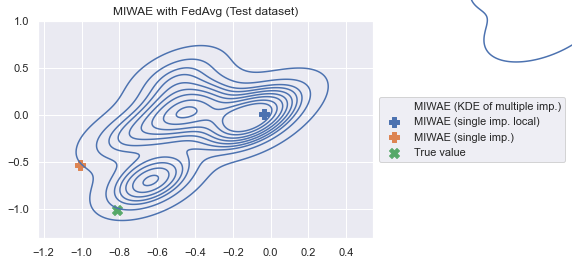

In [40]:
sns.kdeplot(x=mul_imp_fed[:,0],y=mul_imp_fed[:,1])
plt.scatter(x=single_imp_fed[0],y=single_imp_fed[1], s =100, marker = "P",  c = '#2ca02c')
plt.scatter(x=single_imp_loc[0],y=single_imp_loc[1], s =100, marker = "P")
plt.scatter(x=true_values[0],y=true_values[1], s =100, marker = "X",  c = '#d62728')
plt.legend(["MIWAE (KDE of multiple imp.)", "MIWAE (single imp. local)", "MIWAE (single imp.)","True value"],loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("MIWAE with FedAvg (Test dataset)")
plt.show()

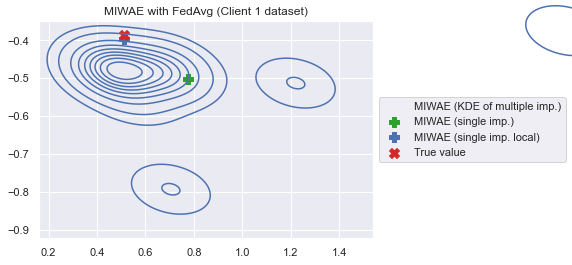

In [38]:
sns.kdeplot(x=mul_imp_cl1_fed[:,0],y=mul_imp_cl1_fed[:,1])
plt.scatter(x=single_imp_cl1_fed[0],y=single_imp_cl1_fed[1], s =100, marker = "P",  c = '#2ca02c')
plt.scatter(x=single_imp_cl1_loc[0],y=single_imp_cl1_loc[1], s =100, marker = "P")
plt.scatter(x=true_values_cl1[0],y=true_values_cl1[1], s =100, marker = "X",  c = '#d62728')
plt.legend(["MIWAE (KDE of multiple imp.)", "MIWAE (single imp.)", "MIWAE (single imp. local)","True value"],loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("MIWAE with FedAvg (Client 1 dataset)")
plt.show()

As you can see, the federated model performs better than the local one!

## Accuracy

In [41]:
from copy import deepcopy

data_client_1 = deepcopy(Clients_data[0])
target_client_1 = deepcopy(target)
cl1_index_list = Clients_data[0].index.values.tolist()
target_client_1 = target_client_1[target_client_1.index.isin(cl1_index_list)].reindex(data_client_1.index)

In [42]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix

data_cl1 = np.copy(Clients_data[0])
xfull_cl1 = np.copy(data_cl1)
xfull_cl1 = (xfull_cl1 - mean_train_post)/std_train_post
target_cl1 = np.copy(target_client_1)

In [43]:
xfull_test = np.copy(data_test)
xfull_test = (xfull_test - np.mean(xfull_test,0))/np.std(xfull_test,0)
target_test = np.copy(labels_test)

In [44]:
# LDA Test
Size_tes = xfull_test.shape[0]

#full data
lda = LinearDiscriminantAnalysis()
X_cl1_lda = lda.fit_transform(xfull_cl1, target_cl1)
y_pred_test_full = lda.predict(xfull_test)
conf_LDA_Test_full = confusion_matrix(target_test, y_pred_test_full)
TP_full = np.diag(conf_LDA_Test_full)
accuracy_LDA_Test_full = sum(TP_full) / Size_tes

#imputed data (fedavg)
lda = LinearDiscriminantAnalysis()
X_cl1_imp_fed = lda.fit_transform(xhat_cl1_fed, target_cl1)
y_pred_test_fed = lda.predict(xfull_test)
conf_LDA_Test_fed = confusion_matrix(target_test, y_pred_test_fed)
TP_fed = np.diag(conf_LDA_Test_fed)
accuracy_LDA_Test_fed = sum(TP_fed) / Size_tes

#imputed data (loc)
lda = LinearDiscriminantAnalysis()
X_cl1_imp_loc = lda.fit_transform(xhat_cl1_loc, target_cl1)
y_pred_test_loc = lda.predict(xfull_test)
conf_LDA_Test_loc = confusion_matrix(target_test, y_pred_test_loc)
TP_loc = np.diag(conf_LDA_Test_loc)
accuracy_LDA_Test_loc = sum(TP_loc) / Size_tes

print('Accuracy (LDA) on testing data')
print('-----')
data = [['Full', accuracy_LDA_Test_full],
        ['FedAvg', accuracy_LDA_Test_fed],
['Local (cl1)', accuracy_LDA_Test_loc]]
print (tabulate(data, headers=["Model", "Accuracy (\u2191)"]))
print('-----')


Accuracy (LDA) on testing data
-----
Model          Accuracy (↑)
-----------  --------------
Full               0.793651
FedAvg             0.698413
Local (cl1)        0.825397
-----
